<h3>Prerequisite for Collab</h3>

In [1]:
!pip install pyomo

In [2]:
!pip install highspy

In [3]:
!pip install pyscipopt

In [4]:
!pip install shapely

<h3>Prerequisite for Conda Installation</h3>

In [5]:
#On Mac Terminal: conda create -n optim_env python=3.10
#conda activate optim_env
#conda install -c conda-forge pyomo scip
#conda install -c conda-forge glpk     # Linear / MILP solver
#conda install -c conda-forge highs    # Linear / Quadratic solver
#conda install -c conda-forge ipopt    # Nonlinear solver
#conda install -c conda-forge scip     # MINLP solver
#conda install networkx
#conda install conda-forge::matplotlib

# **I. Network Analysis**

In [6]:
import networkx as nx
import matplotlib.pyplot as plt
import math
import time

# Step 1: Create graph
G2 = nx.Graph()

# Step 2: Define node data with BOTH position and label
# Each entry: node_id: {"pos": (x, y), "label": "..."}
node_data = {
    1:  {"pos": (-4.559058, 15.174809), "label": "Route de Matadi (border Kinshasa)"},
    2:  {"pos": (-4.442848, 15.255100), "label": "Triangle Matadi Kibala"},
    3:  {"pos": (-4.406924, 15.256513), "label": "UPN"},
    4:  {"pos": (-4.349325, 15.238810), "label": "Av. de l'École – Binza"},
    5:  {"pos": (-4.328773, 15.252333), "label": "Mont Ngaliema"},
    6:  {"pos": (-4.310907, 15.288488), "label": "Bd du 30 Juin"},
    7:  {"pos": (-4.299709, 15.319240), "label": "Gare Centrale"},
    8:  {"pos": (-4.398246, 15.276497), "label": "Selembao (Auto Stop)"},
    9:  {"pos": (-4.381511, 15.282728), "label": "Sanatorium"},
    10: {"pos": (-4.337062, 15.295951), "label": "Pierre Mulele"},
    11: {"pos": (-4.395099, 15.307741), "label": "Triangle Campus"},
    12: {"pos": (-4.389760, 15.314763), "label": "Rond Point Ngaba"},
    13: {"pos": (-4.336819, 15.326397), "label": "Av. de l'Université"},
    14: {"pos": (-4.331834, 15.314427), "label": "Bd Triomphal"},
    15: {"pos": (-4.393572, 15.333011), "label": "Lemba"},
    16: {"pos": (-4.375441, 15.344869), "label": "Échangeur 1"},
    17: {"pos": (-4.397829, 15.393514), "label": "Masina"},
    18: {"pos": (-4.405498, 15.423430), "label": "Av. Ndjoku"},
    19: {"pos": (-4.391380, 15.446782), "label": "Aéroport Ndjili"},
    20: {"pos": (-4.384103, 15.470908), "label": "Nsele"},
    21: {"pos": (-4.209434, 15.578420), "label": "RP Nsele"},
    22: {"pos": (-4.202280, 15.613246), "label": "Menkao"},
    23: {"pos": (-4.051282, 15.558907), "label": "Maluku"},
    # 23 intentionally omitted
    24: {"pos": (-4.472585, 15.281341), "label": "Arrêt Gare"},
    25: {"pos": (-4.420154, 15.307442), "label": "UNIKIN"},
    26: {"pos": (-4.461385, 15.288240), "label": "Kimwenza 2"},
    27: {"pos": (-4.484759, 15.219752), "label": "Benseke"},
    28: {"pos": (-4.447334, 15.249644), "label": "Wenze Matadi Kibala"},
    29: {"pos": (-4.329183, 15.337959), "label": "Limete PL"},
    30: {"pos": (-4.353936, 15.335540), "label": "Limete R"},
    
}

# Step 3: Add nodes with attributes
for node, attrs in node_data.items():
    G2.add_node(node, **attrs)  # adds both 'pos' and 'label'

# Step 4: Define edges with names
edges = [
    (1, 27, {"name": "Route de Matadi - Benseke"}),
    (27, 28, {"name": "Benseke - Wenze Matadi Kibala"}),
    (28, 2, {"name": "Wenze (Matadi Kibala) - Triangle (Cité Verte)"}),
    (2, 3, {"name": "Matadi Kibala - UPN"}),
    (3, 4, {"name": "UPN - Binza"}),
    (4, 5, {"name": "Binza - Mont Ngaliema"}),
    (5, 6, {"name": "Boulevard du 30 Juin"}),
    (6, 7, {"name": "24 - Gare Centrale"}),
    (3, 8, {"name": "UPN - Selembao"}),
    (8, 9, {"name": "Sanatorium - Université"}),
    (9, 10, {"name": "Sanatorium - Pierre Mulele"}),
    (10, 6, {"name": "24 Novembre"}),
    (2, 11, {"name": "Triangle (Cité Verte) - Triangle (Campus)"}),
    (11, 12, {"name": "Tr.Campus - RP Ngaba"}),
    (12, 13, {"name": "Av. Université"}),
    (10, 14, {"name": "B. Triomphal"}),
    (13, 14, {"name": "B. Sendwe"}),
    (12, 15, {"name": "RP Ngaba - Lemba"}),
    (15, 16, {"name": "Lemba - Echangeur 1"}),
    (13, 30, {"name": "Sendwe - Limete"}),
    (30, 16, {"name": "Limete. Lumumba 1"}),
    (16, 17, {"name": "Echangeur - Masina"}),
    (17, 18, {"name": "Masina - Av.Ndjoku (B.Lumumba 2)"}),
    (18, 19, {"name": "Av.Ndjoku - Int Aeroport (B.Lumumba 3)"}),#
    (19, 20, {"name": "Aeroport - Nsele"}),#
    (20, 21, {"name": "Nsele - RP. Nsele"}),#
    (21, 22, {"name": "RP.Nsele - Menkao"}),#
    (21, 23, {"name": "RP.Nsele - Maluku"}),#
    (2, 24, {"name": "Triangle Cité Verte - R. Kimwenza"}),#
    (11, 25, {"name": "Triangle Campus - Unikin"}),#
    (12, 25, {"name": "RP Ngaba - Unikin"}),#
    (25, 26, {"name": "Unikin - Kimwenza 2"}),#
    (7, 29, {"name": "Gare Centrale - Poids Lourd"}),#
    (29, 16, {"name": "Poids Lourd - Echangeur"}),#
]
G2.add_edges_from(edges)
G0 = G2.copy()

In [7]:
#(Distance) Calibration -------------------------------------
P1 = node_data[3]['pos']
P2 = node_data[27]['pos']
d = math.sqrt((P1[0]-P2[0])**2 + (P1[1]-P2[1])**2 )
True_d  = 4.2
calibration_score = d/True_d
print(d,calibration_score)
# ----------------------------------------------------------
# Edge lengths (Euclidean from node positions)
# ----------------------------------------------------------
def compute_edge_lengths(G):
    #pos = nx.get_node_attributes(G, 'pos')
    lengths = {}
    for (u, v) in G.edges(): 
        x1, y1 = node_data[u]['pos']
        x2, y2 = node_data[v]['pos']
        lengths[(u, v)] = ((x1 - x2) ** 2 + (y1 - y2) ** 2) ** 0.5
    return lengths

0.08607937236063044 0.02049508865729296


<h3>Problem Configuration</h3>

In [8]:
from joblib import load

demand_dict = load("../../data/od_demand.joblib")
print("Loaded", len(demand_dict), "OD pairs.")


Loaded 114 OD pairs.


In [9]:
#----- Complete Graph
Gc = nx.complete_graph(G0.nodes()) #complete graph
Gs = Gc.copy()
Gs.remove_edges_from(G0.edges())
complete_edge_list = Gs.edges()
#---- System Configuration ----------------------
lengths = compute_edge_lengths(Gc)
cost_weights = {(i,j): lengths[i,j] for (i,j) in Gc.edges()}
CALIB = calibration_score
#-------- Demand Data ---------------------------
OD_pairs = demand_dict.keys() #[(1,27),(16,18),(5,7),(10,13)] #Origin Destination Pairs
demand_paths = demand_dict# {(1,27):25, (16,18):15, (5,7):15, (10,13):18}
Budget = 100 #100 Km
travel_t0 = {(i,j):cost_weights[i,j] for (i,j) in Gc.edges()}
travel_alpha = {(i,j):0.15 for (i,j) in Gc.edges()}
#Optimisation settings
penalty_factor = 1e9
optim_max_iter = 200
optim_pop_size = 20
optim_stall_iter = optim_max_iter
#Number of runs
n_runs = 10

<h3>Analysis</h3>

In [10]:
import math
import networkx as nx
import matplotlib.pyplot as plt

def draw_rotated_graph(
    G,
    degrees=-90,
    figsize=(10, 8),
    invert_x=True,
    edge_flows=None,
    scale=0.055,
    show_labels=True,
    node_size=120,
    spread=2.0,
    label_pos=0.55,
    node_font_size=6,
    edge_font_size=6
):

    def rotate_pos(pos_dict, degrees):
        theta = math.radians(degrees)
        cos_t, sin_t = math.cos(theta), math.sin(theta)
        return {
            n: (x * cos_t + y * sin_t, -x * sin_t + y * cos_t)
            for n, (x, y) in pos_dict.items()
        }

    # Get positions
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        pos = nx.spring_layout(G, seed=42, k=1.0)

    pos_rotated = rotate_pos(pos, degrees)
    pos_scaled = {n: (x*spread, y*spread) for n, (x,y) in pos_rotated.items()}

    # Edge widths
    edge_widths = []
    for (u,v) in G.edges():
        flow = 0.0
        if edge_flows:
            flow = edge_flows.get((u, v), edge_flows.get((v, u), 0.0))
        edge_widths.append(max(0.5, flow * scale))

    # Edge color normalization
    edge_values = []
    if edge_flows:
        flow_vals = [
            edge_flows.get((u,v), edge_flows.get((v,u), 0.0))
            for (u,v) in G.edges()
        ]
        f_min, f_max = min(flow_vals), max(flow_vals)

        for (u,v) in G.edges():
            f = edge_flows.get((u,v), edge_flows.get((v,u), 0.0))
            norm_f = (f - f_min) / (f_max - f_min) if f_max > f_min else 0.0
            edge_values.append(norm_f)
    else:
        edge_values = "grey"

    # Plot
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos_scaled, node_size=node_size, node_color="lightblue")
    nx.draw_networkx_labels(G, pos_scaled, font_size=node_font_size, font_weight="bold")

    nx.draw_networkx_edges(
        G,
        pos_scaled,
        width=edge_widths,
        edge_color=edge_values,
        edge_cmap=plt.cm.RdYlGn_r,  # green=low, red=high
        arrows=G.is_directed()
    )

    if edge_flows and show_labels:
        edge_labels = {
            (u,v): f"{edge_flows.get((u,v), edge_flows.get((v,u), 0.0)):.2f}"
            for (u,v) in G.edges()
        }
        nx.draw_networkx_edge_labels(
            G,
            pos_scaled,
            edge_labels=edge_labels,
            font_size=edge_font_size,
            label_pos=label_pos,
            font_color="brown"
        )

    if invert_x:
        plt.gca().invert_xaxis()

    plt.axis("off")
    plt.show()


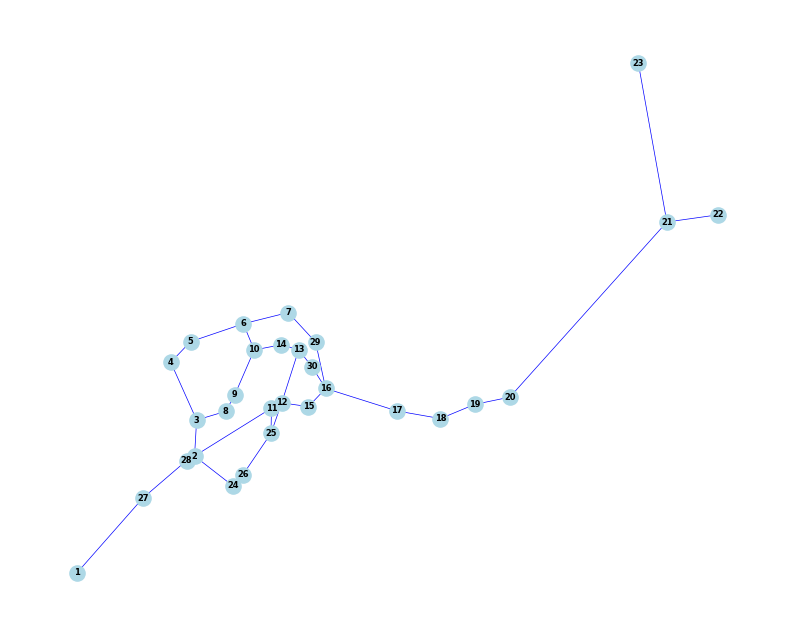

In [11]:
draw_rotated_graph(G2)

In [12]:
#Optimisation Preparation
import networkx as nx
Gs = Gc.copy()
Gs.remove_edges_from(G0.edges())
print('[0] Initial Network:',G0, '\n[1] Complete Network:', Gc,'\n[2] Solution Network:',Gs)
#candidate solution
Gi = G0
def get_simple_paths(Gi, r, s):
  return list(nx.all_simple_paths(Gi,source=r,target=s))

[0] Initial Network: Graph with 30 nodes and 34 edges 
[1] Complete Network: Graph with 30 nodes and 435 edges 
[2] Solution Network: Graph with 30 nodes and 401 edges


In [13]:
from shapely.geometry import LineString
from shapely.strtree import STRtree
import itertools

def precompute_intersections(node_data):
    """
    Compute all intersecting edge pairs in a complete geometric graph.

    Parameters
    ----------
    node_data : dict
        {node_id: {"pos": (x, y)}}

    Returns
    -------
    list[tuple]
        [((u1, v1), (u2, v2)), ...] where each pair of edges intersects.
    """

    # === 1. Build edge list and geometries ===
    nodes = list(node_data.keys())
    edges = [(u, v) for u, v in itertools.combinations(nodes, 2)]
    geoms = [LineString([node_data[u]["pos"], node_data[v]["pos"]]) for u, v in edges]

    # === 2. Build spatial index ===
    tree = STRtree(geoms)

    # === 3. Map geometry id back to its index ===
    # These are actual geometry objects used in the tree.
    geom_to_index = {g: i for i, g in enumerate(geoms)}

    # === 4. Compute intersections ===
    intersection_pairs = set()

    for i, geom1 in enumerate(geoms):
        edge1 = edges[i]
        for geom2 in tree.query(geom1):
            # Some STRtree versions return proxy types; skip if not valid geometry
            if not isinstance(geom2, LineString):
                continue

            j = geom_to_index.get(geom2)
            if j is None or j == i:
                continue
            edge2 = edges[j]

            # Skip shared endpoints
            if set(edge1) & set(edge2):
                continue

            # Use .crosses() which ensures proper line intersection (not touching)
            if geom1.crosses(geom2):
                intersection_pairs.add(tuple(sorted([edge1, edge2])))

    return list(intersection_pairs)


In [14]:
precomputed_pairs = precompute_intersections(node_data)
precomputed_pairs

[]

In [15]:
def count_intersections_subnetwork(G, precomputed_pairs):
    """
    Count how many of the precomputed intersection pairs exist in G.
    """
    edges_in_G = set(tuple(sorted(e)) for e in G.edges())
    count = sum(1 for (e1, e2) in precomputed_pairs
                if e1 in edges_in_G and e2 in edges_in_G)
    return count


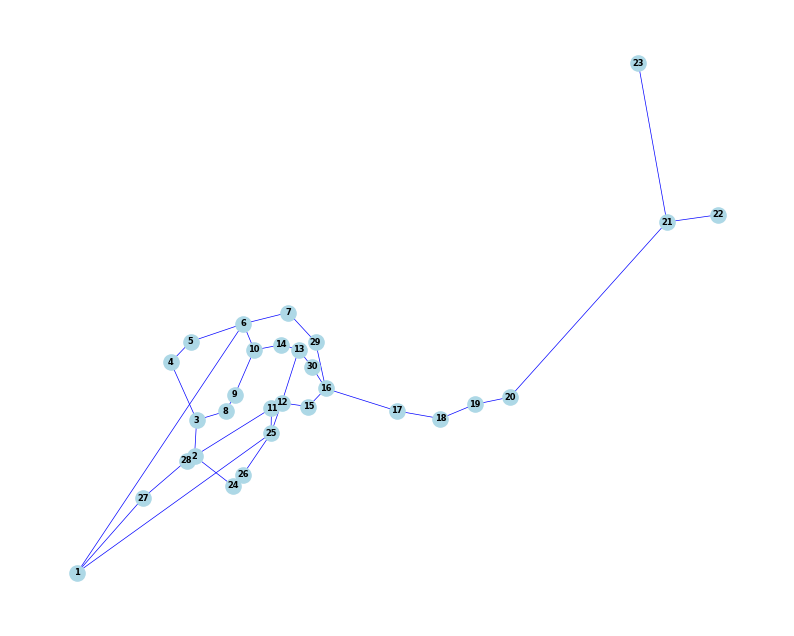

In [16]:
Gi_ = G0.copy()
Gi_.add_edges_from([(1,25),(1,6)])
draw_rotated_graph(Gi_)

In [17]:
#num_intersections = count_intersections(Gi_, node_data)
#print("Number of geometric intersections:", num_intersections)

# **I. Greedy Algorithm**

A transportation network design problem (TNDP) is formulated as bilevel optimisation problem.

\begin{align}
  \textbf{ULP}: \underset{y}{Minimise} \text{ }\quad  & \underset{}{T(y) = \sum_{(i,j)\in \Gamma \cup E}x^*_{i,j}t_{ij}(x^*_{i,j})}\\
   s.t\quad  & \sum_{}^{}c_{i,j}y_{i,j } \leq  B\\
   \quad & y_{i,j}\in\{0,1\}\\
   \quad & x^*_{i,j} = \text{arg min }F(x,f,y)\\
   \textbf{LLP}: \underset{x, f}{Minimise} \text{ }\quad & \underset{}{F(x,f,y) = \sum_{(i,j)\in \Gamma\cup E} \int_{0}^{x_{i,j}}t_{i,j}(w)dw}\\
   s.t\quad & x_{i,j}=\sum_{P_{r,s}\in E\cup \Gamma}\sum_{k\in P_{r,s}}f_k\delta_k^{i,j}\\
   \quad & \sum_{k\in P_{r,s}}f_k=d_{r,s}\\
   \quad & f_k\geq 0\\
   \quad & x_{i,j}\geq 0\\
   \quad & \delta_k^{i,j}\in \{0,1\}
\end{align}
where $y_{i,j}$ is a decision variable to add or remove an edge $(i,j)$, $x_{i,j}$ is the overall flow rate of the edge $(i,j)$, $f_k$ is the flow of a path $k$ in a given origin destination pair $(r,s)$ and $\delta_k^{i,j}$ a network structure variable that excludes a flow $f_k$ if it does not go through $x_{i,j}$.

The travel time function is typically given \cite{babazadeh2011application,koh2007solving,zhang2009bilevel} as
\begin{equation}
t(x) = t_{ij}(x_{ij}) = \alpha_{ij}+\beta_{ij}x_{ij}^4   
\end{equation}


<h3>Greedy Algorithm</h3>
In the problem of network augmentation, a greedy algorithm proposed can be used to iteratively identify a good candidate subset that will minimise $T(y)$ using a step-by-step greedy addition of local best links \cite{medya2018group}. The advantage of greedy algorithms is in providing stable, efficient and ``good'' solutions (see algorithm \ref{alg:greedy}).

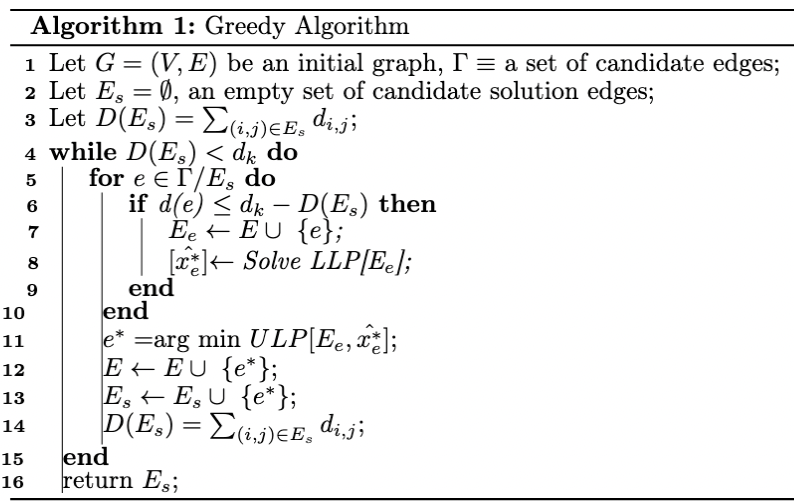

At each iteration, a sample candidate edge is selected from $\Gamma/E_s$ and added to a novel network $G_e$ with more edge additions. The edge that yields the best cost function minimisation is added to the candidate solution pool $E_s$, and as such, the network is updated, the candidate subset and termination constraint are updated. This process continues until a termination criterion is reached.

<h3>Lower Level Problem Solver</h3>

In [18]:
import pyomo.environ as pyo
import numpy as np
import math
import ast
import networkx as nx

#Var2Edge
def var2edge(edge_list,y_var):
    return [edge for edge,y_i in zip(edge_list,y_var) if y_i==1]

#Edge2Var
def edge2var(edge_list,edges_):
    ys = [1 if (i,j) in edges_ or (j,i) in edges_ else 0 for (i,j) in edge_list]
    return ys
    
#Travel time function
def travel_time_discrete(t0,alpha,x_ij):
    return t0*(1 + alpha*x_ij**4)
    
def travel_time_integral(t0,alpha,x_ij):
    return t0*(x_ij + 0.2*alpha*x_ij**5)

#Lower Level Problem
def LLP_problem_solve(G_0, design_edges, 
                      OD_pairs, 
                      demand_paths, 
                      travel_t0, 
                      travel_alpha,
                      display=True,
                      solver_="ipopt"
                      ):

    Gi = G_0.copy() #New Design Network
    Gi.add_edges_from(design_edges) #Add edges to network

    """
    #get flow paths between root and destination
    def get_flow_paths(Gi,r,s):
      paths_ = list(nx.all_simple_paths(Gi,source=r,target=s))
      return [list(zip(path[:-1],path[1:])) for path in paths_]
    flow_paths = {(r,s): get_flow_paths(Gi,r,s)  for (r,s) in OD_pairs}
    """

    # Get flow paths between root and destination
    def get_flow_paths(Gi, r, s, k=5, weight=None):
        """
        Returns up to k shortest simple paths (instead of all simple paths).
        Much more efficient for large graphs.
        """
        gen = nx.shortest_simple_paths(Gi, source=r, target=s, weight=weight)
        paths_ = []
        for i, path in enumerate(gen):
            if i >= k:   # stop after k paths
                break
            paths_.append(list(zip(path[:-1], path[1:])))
        return paths_
    
    # Dictionary of OD flow paths
    flow_paths = {(r, s): get_flow_paths(Gi, r, s, k=5, weight="length") for (r, s) in OD_pairs}

    #Get flow dictionary: paths per (r,s)
    flow_dics = {} #flow dictionaries
    flow_vars_inds = []
    for fi in flow_paths:
      i = 0
      for path in flow_paths[fi]:
        flow_var = f'{fi}_%d'%(i+1)
        flow_dics[flow_var] =  path#store paths
        flow_vars_inds.append(flow_var)
        i+=1
    
    #flow demand rule
    def flow_demand_rule(problem,i,j):
      return sum(problem.f_k[str((i,j))+'_%d'%(ii+1)] for ii in range(len(flow_paths[i,j]))) == demand_paths[i,j]
    
    #flow - overall flow rule [link-path consistency]
    def flow_xij_rule(problem,i,j):
      expr = 0
      for key in flow_dics:
        path = flow_dics[key]
        if (i,j) in path or (j,i) in path:
          expr += problem.f_k[key]
      return expr==problem.x_ij[i,j]
    
    #Create Lower Level Problem
    LL_Trans_Problem = pyo.ConcreteModel()
    LL_Trans_Problem.x_ij = pyo.Var(Gi.edges(),within=pyo.NonNegativeReals) #continuous flow variables
    LL_Trans_Problem.f_k = pyo.Var(flow_vars_inds, within=pyo.NonNegativeReals) #Flow variables are rs-dependent
    LL_Trans_Problem.constraint_flow = pyo.Constraint(OD_pairs,rule=flow_demand_rule)#Flow Demand rule
    LL_Trans_Problem.constraint_flow_xij = pyo.Constraint(Gi.edges(),rule=flow_xij_rule)#Flow Xij rule
    LL_Trans_Problem.obj = pyo.Objective(expr=sum(LL_Trans_Problem.x_ij[i,j]*travel_time_integral(travel_t0[i,j],travel_alpha[i,j],LL_Trans_Problem.x_ij[i,j]) for (i,j) in LL_Trans_Problem.x_ij))
    pyo.SolverFactory(solver_).solve(LL_Trans_Problem,tee=display)

    if display:
        print('Number of x-variables: ',len(LL_Trans_Problem.x_ij),'\n')
    x_flows = {}
    for (i,j) in LL_Trans_Problem.x_ij:
        x_flows[i,j] = pyo.value(LL_Trans_Problem.x_ij[i,j])
        if display:
            print(f"x[{i},{j}] =",x_flows[i,j] )

    if display:
        print('Number of f-variables: ',len(LL_Trans_Problem.f_k),'\n')
    f_flows = {}
    for i in LL_Trans_Problem.f_k:
        f_flows[i] = pyo.value(LL_Trans_Problem.f_k[i])
        if display:
            print(f"f[{k}] =", pyo.value(LL_Trans_Problem.f_k[k]))

    L_opt = pyo.value(LL_Trans_Problem.obj)#optimal valur
    
    return L_opt, x_flows,f_flows

<h3>Lower Level Problem - Case Study</h3>

In [30]:
E_e = [] #Design edges
L_opt, x_flows, f_flows = LLP_problem_solve(G0, 
                                            design_edges=E_e, 
                                            OD_pairs=OD_pairs, 
                                            demand_paths=demand_paths,
                                            travel_t0=travel_t0,
                                            travel_alpha=travel_alpha,
                                            display=False
                                           )


In [31]:
print("\n--- Results ---")
print("Objective =", L_opt)


--- Results ---
Objective = 80303388.84962241


In [21]:
print('Number of x-variables: ',len(x_flows),'\n')
for (i,j) in x_flows:
    print(f"x[{i},{j}] =",x_flows[i,j] )

Number of x-variables:  35 

x[13,30] = 39.13340633045447
x[3,4] = 19.82815854439554
x[16,29] = 37.289106164525776
x[16,17] = 53.14399999999999
x[7,29] = 36.3888099403771
x[12,13] = 22.92077765924958
x[21,22] = 13.212000000000003
x[8,9] = 17.12437762672029
x[12,25] = 20.67700409952313
x[17,18] = 28.244000000000042
x[2,11] = 29.183928154903043
x[27,28] = 40.73999999999998
x[25,26] = 18.124533551153153
x[13,14] = 25.910725513568693
x[1,27] = 40.73999999999998
x[18,19] = 28.244000000000042
x[4,5] = 24.57770644834671
x[5,6] = 21.80924080233004
x[12,15] = 26.077781809169174
x[4,26] = 18.124533551153153
x[9,10] = 19.836377746719094
x[10,14] = 31.794725633568188
x[19,20] = 13.212000000000003
x[6,7] = 38.9988923554745
x[11,25] = 2.5524701927446367
x[15,16] = 37.26178214916887
x[2,28] = 40.73999999999998
x[6,10] = 27.205185287129396
x[16,30] = 27.104494387184694
x[21,23] = 0.0
x[20,21] = 13.212000000000003
x[3,8] = 16.92437752672036
x[2,3] = 30.768070745097507
x[11,12] = 26.631457846532637
x[2,

In [32]:
print('Number of f-variables: ',len(f_flows),'\n')
for k in f_flows:
    print(f"f[{k}] =", f_flows[k])


Number of f-variables:  530 

f[(1, 2)_1] = 1.018
f[(1, 4)_1] = 0.5080000399999838
f[(1, 4)_2] = -9.999989021358503e-09
f[(1, 4)_3] = -9.999997873406983e-09
f[(1, 4)_4] = -9.999997873402205e-09
f[(1, 4)_5] = -9.999999054673007e-09
f[(1, 5)_1] = 1.5180000399999813
f[(1, 5)_2] = -9.999986762752632e-09
f[(1, 5)_3] = -9.999997800719647e-09
f[(1, 5)_4] = -9.999997800714538e-09
f[(1, 5)_5] = -9.999999040577322e-09
f[(1, 7)_1] = 2.0260000399999636
f[(1, 7)_2] = -9.99999832054503e-09
f[(1, 7)_3] = -9.999969526447924e-09
f[(1, 7)_4] = -9.99999832054206e-09
f[(1, 7)_5] = -9.999997572610569e-09
f[(1, 9)_1] = 0.6780000399999843
f[(1, 9)_2] = -9.999997629627303e-09
f[(1, 9)_3] = -9.999990595353431e-09
f[(1, 9)_4] = -9.999997629621364e-09
f[(1, 9)_5] = -9.999998347132428e-09
f[(1, 10)_1] = 2.0260000399999774
f[(1, 10)_2] = -9.999997362507469e-09
f[(1, 10)_3] = -9.999984277678253e-09
f[(1, 10)_4] = -9.999997362500119e-09
f[(1, 10)_5] = -9.999998221534778e-09
f[(1, 12)_1] = 1.4834284712636165
f[(1, 12

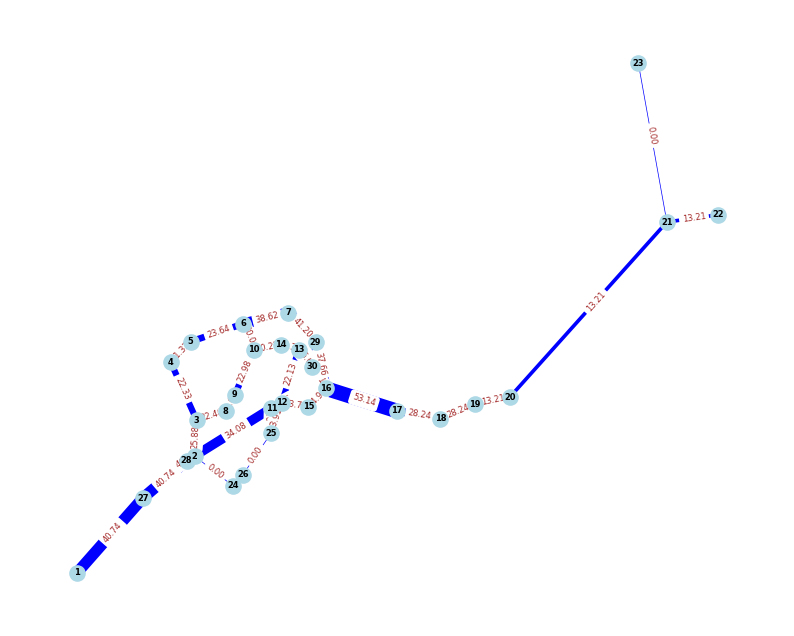

In [33]:
Gi = G0.copy()
Gi.add_edges_from(E_e)
draw_rotated_graph(Gi,edge_flows=x_flows)

<h3>Upper Level Problem</h3>

In [35]:
#--------------------------------------------------
def Upper_Level_Problem_obj_func(G0, 
                                y_vars=None, 
                                OD_pairs=OD_pairs, 
                                demand_paths=demand_paths,
                                travel_t0=travel_t0,
                                travel_alpha=travel_alpha,
                                cost_weights = cost_weights,
                                budget = 100,
                                penalty_factor = 1e9,
                                calib = CALIB,
                                complete_edge_vars=complete_edge_list,
                                display=False):
    
    E_e = [edge for edge,y_i in zip(complete_edge_vars,y_vars) if y_i== 1]#new design variables
    #print('E',E_e)
    #-- Solve the LLP problem
    L_opt, x_flows, f_flows = LLP_problem_solve(G0, 
                                            design_edges=E_e, 
                                            OD_pairs=OD_pairs, 
                                            demand_paths=demand_paths,
                                            travel_t0=travel_t0,
                                            travel_alpha=travel_alpha,
                                            display=display
                                           )
    #Solve the Objective Function
    obj_value = sum([x_flows[i,j]*travel_time_discrete(travel_t0[i,j],travel_alpha[i,j],x_flows[i,j]) for (i,j) in x_flows])
    penalty = max(0,sum([cost_weights[i,j] for (i,j) in E_e])-budget*calib)
    #print('penalty:', penalty)
    pure_cost = obj_value
    obj_value += penalty_factor*penalty
    
    return obj_value, x_flows, pure_cost



#------------------------------------------------ (Test Example) ----
#y_vars = edge2var(complete_edge_list,[(7, 17), (1, 26), (19, 29), (7, 30), (24, 29), (1, 14), (13, 19), (5, 29), (2, 30), (1, 6), (22, 25), (8, 29), (17, 30), (13, 29)]
#  )
y_vars = edge2var(complete_edge_list,[])
#---------------------------------------------------------------------
obj_value,x_flows,pure_cost = Upper_Level_Problem_obj_func(G0, 
                                y_vars=y_vars, 
                                OD_pairs=OD_pairs, 
                                demand_paths=demand_paths,
                                travel_t0=travel_t0,
                                travel_alpha=travel_alpha,
                                budget = Budget,
                                cost_weights = cost_weights,
                                complete_edge_vars=complete_edge_list,
                                display=False)
                                         
print('\n\nUpper problem value:', obj_value,pure_cost)    



Upper problem value: 9257125.681379149 9257125.681379149


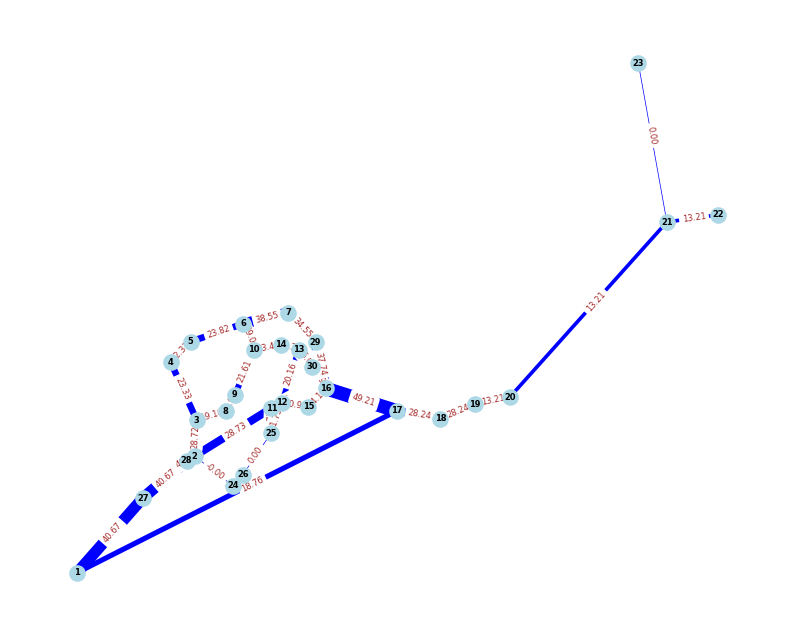

In [25]:
E_e = [edge for edge,y_i in zip(complete_edge_list,y_vars) if y_i== 1]
Gi = G0.copy()
Gi.add_edges_from(E_e)
draw_rotated_graph(Gi,edge_flows=x_flows)

In [26]:
def evaluate_upper_level(selected_edges, display=False):
    """
    Evaluate the Upper-Level Problem (ULP) given a list of selected edges only.
    
    Parameters
    ----------
    selected_edges : list of tuples
        Edges to add to the base network, e.g. [(26,4), (26,23)].
    display : bool, optional
        If True, prints progress and diagnostic details.

    Returns
    -------
    obj_value : float
        Objective value of the upper-level problem.
    x_flows : dict
        Flow solution from the lower-level problem.
    """

    # === Access or import the encapsulated parameters ===
    global G0, complete_edge_list, OD_pairs, demand_paths
    global travel_t0, travel_alpha, cost_weights, Budget, CALIB

    # --- Convert edge list to binary decision vector ---
    y_vars = [1 if e in selected_edges else 0 for e in complete_edge_list]

    # --- Evaluate the upper-level objective ---
    obj_value, x_flows, pure_cost = Upper_Level_Problem_obj_func(
        G0,
        y_vars=y_vars,
        OD_pairs=OD_pairs,
        demand_paths=demand_paths,
        travel_t0=travel_t0,
        travel_alpha=travel_alpha,
        cost_weights=cost_weights,
        budget=Budget,
        penalty_factor=1e9,
        calib=CALIB,
        complete_edge_vars=complete_edge_list,
        display=display
    )

    if display:
        print("Selected edges:", selected_edges)
        print(f"Upper-level objective value = {obj_value:.4f}")

    distance = 0
    for e in selected_edges:
        distance+= cost_weights[e]
        
    return obj_value, x_flows, pure_cost, distance/CALIB


In [27]:
def visualize_network(selected_edges, edge_flows=None, display=True):
    """
    Visualize the network for a given set of selected edges and optional flow data.

    Parameters
    ----------
    selected_edges : list of tuples
        Edges to be added to the base graph, e.g. [(26,4), (26,23)].
    edge_flows : dict, optional
        Dictionary of edge flow values (can be None).
    display : bool, optional
        If True, prints the number of edges and draws the graph.

    Returns
    -------
    Gi : networkx.Graph
        The updated network with selected edges added.
    """

    # Use global base graph (for simplicity)
    global G0

    Gi = G0.copy()
    Gi.add_edges_from(selected_edges)

    if display:
        print(f"Visualising network with {len(selected_edges)} added edges...")
        try:
            draw_rotated_graph(Gi, edge_flows=edge_flows)
        except Exception as e:
            print(f"⚠️ Could not draw graph: {e}")
    return Gi


<h3>Greedy Algorithm</h3>

In [28]:
import copy
import random

def greedy_upper_solver(G0, 
                        complete_edge_list, 
                        OD_pairs, 
                        demand_paths, 
                        travel_t0, 
                        travel_alpha, 
                        cost_weights, 
                        budget=100, 
                        penalty_factor=1e9, 
                        calib=CALIB, 
                        sampling_rate=0.2, 
                        display=False):
    """
    Greedy solver for the Upper Level Problem (ULP) with optional edge sampling.
    
    Parameters
    ----------
    G0 : networkx.Graph
        Initial graph.
    complete_edge_list : list
        List of all possible candidate edges.
    OD_pairs : list
        Origin-destination pairs.
    demand_paths : dict
        Precomputed demand paths.
    travel_t0, travel_alpha : dict
        Travel time parameters.
    cost_weights : dict
        Edge construction costs.
    budget : float
        Total budget constraint.
    penalty_factor : float
        Penalty factor for infeasible solutions.
    calib : float
        Calibration factor for scaling budget.
    sampling_rate : float
        Fraction (0 < sampling_rate ≤ 1) of candidate edges to evaluate at each step.
        Example: 0.2 means only 20% of candidate edges are tested.
    display : bool
        If True, prints iteration details.
    """

    # Candidate solution edges
    E_s = []
    total_cost = 0.0
    best_obj, best_flows = None, None

    iter_history = {
        "edges":[],
        "obj":[],
        "flows":[]
    }
    
    while total_cost < budget * calib:
        candidate_edge = None
        candidate_obj = float("inf")
        candidate_flows = None

        # Build reduced candidate set by sampling
        remaining_edges = [e for e in complete_edge_list if e not in E_s and e not in G0.edges()]
        if not remaining_edges:
            break

        sample_size = max(1, int(len(remaining_edges) * sampling_rate))
        sampled_edges = random.sample(remaining_edges, sample_size)

        # For each sampled candidate edge
        for e in sampled_edges:
            edge_cost = cost_weights[e]
            if edge_cost > budget * calib - total_cost:
                continue  # cannot fit in remaining budget
            
            # Build trial solution (E_s ∪ {e})
            y_trial = [1 if edge in E_s+[e] else 0 for edge in complete_edge_list]
            
            # Solve LLP and evaluate ULP objective
            obj_val, flows, pure_cost = Upper_Level_Problem_obj_func(
                G0,
                y_vars=y_trial,
                OD_pairs=OD_pairs,
                demand_paths=demand_paths,
                travel_t0=travel_t0,
                travel_alpha=travel_alpha,
                cost_weights=cost_weights,
                budget=budget,
                penalty_factor=penalty_factor,
                calib=calib,
                complete_edge_vars=complete_edge_list,
                display=False
            )
            
            # Keep best candidate
            if obj_val < candidate_obj:
                candidate_obj = obj_val
                candidate_edge = e
                candidate_flows = flows
        
        # If no feasible edge found → break
        if candidate_edge is None:
            break
        
        # Commit to best edge e*
        E_s.append(candidate_edge)
        total_cost += cost_weights[candidate_edge]
        best_obj = candidate_obj
        best_flows = candidate_flows

        iter_history["obj"].append(best_obj.copy())
        iter_history["flows"].append(best_flows.copy())
        
        if display:
            print(f"Added edge {candidate_edge}, Obj={best_obj:.4f}, Cost={total_cost:.2f}")
            
    iter_history["edges"] = E_s.copy()
    
    return E_s, best_obj, best_flows,iter_history

In [29]:
bool_result_exist = True

if not bool_result_exist:
    start_greedy = time.time()
    greedy_chosen_edges, greedy_best_obj, greedy_best_flows,greedy_iter_history = greedy_upper_solver(
        G0,
        complete_edge_list,
        OD_pairs=OD_pairs,
        demand_paths=demand_paths,
        travel_t0=travel_t0,
        travel_alpha=travel_alpha,
        cost_weights=cost_weights,
        budget=Budget,
        calib=CALIB,
        sampling_rate = 1,
        display=True
    )
    
    stop_greedy = time.time()
    elapsed_greedy = (stop_greedy - start_greedy)/60
    print("\nGreedy Chosen edges:", greedy_chosen_edges)
    print("Final objective:", greedy_best_obj)
    print(f"Elapsed time: {elapsed_greedy:.4f} minutes")
else:
    greedy_chosen_edges = [(7, 17), (1, 26), (19, 29), (7, 30), (24, 29), (1, 14), (13, 19), (5, 29), (2, 30), (1, 6), (22, 25), (8, 29), (17, 30), (13, 29)]
    #Final objective: 66348.36500373315


    #Design 2:
    #Greedy Chosen edges: [(7, 17), (1, 3), (7, 30), (17, 29), (16, 24), (6, 23), (1, 17), (2, 13), (1, 2), (7, 19), (12, 30), (29, 30), (10, 13), (5, 10), (15, 30), (2, 25), (17, 19), (9, 13), (15, 25), (24, 26), (13, 29)]
    #Final objective: 10102039.030624228
    #Elapsed time: 29.5065 minutes

    elapsed_greedy = 27.3416 #minutes
    y_vars = edge2var(complete_edge_list,greedy_chosen_edges)
    greedy_iter_history = []
    greedy_best_obj, greedy_best_flows, best_pure_cost = Upper_Level_Problem_obj_func(
        G0,
        y_vars=y_vars,
        OD_pairs=OD_pairs,
        demand_paths=demand_paths,
        travel_t0=travel_t0,
        travel_alpha=travel_alpha,
        cost_weights=cost_weights,
        budget=Budget,
        penalty_factor=1e9,
        calib=CALIB,
        complete_edge_vars=complete_edge_list,
        display=display
    )


Ipopt 3.14.19: 

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.19, running with linear solver MUMPS 5.8.1.

Number of nonzeros in equality constraint Jacobian...:     2714
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       48

Total number of variables............................:      618
                     variables with only lower bounds:      618
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number

In [30]:
print("\nGreedy Chosen edges:", greedy_chosen_edges)
print("Final objective:", greedy_best_obj)
print(f"Elapsed time: {elapsed_greedy:.4f} minutes")


Greedy Chosen edges: [(7, 17), (1, 26), (19, 29), (7, 30), (24, 29), (1, 14), (13, 19), (5, 29), (2, 30), (1, 6), (22, 25), (8, 29), (17, 30), (13, 29)]
Final objective: 66348.36500373317
Elapsed time: 27.3416 minutes


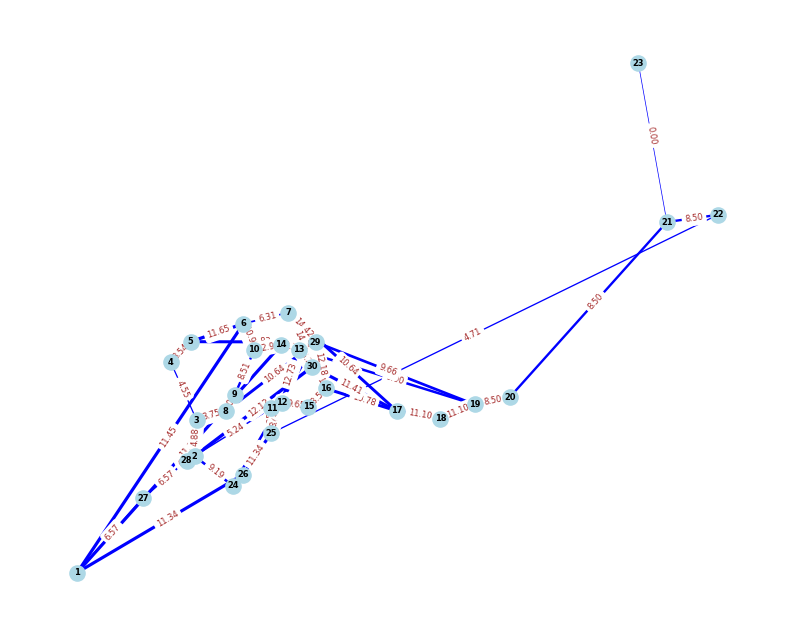

In [31]:
Gi = G0.copy()
Gi.add_edges_from(greedy_chosen_edges)
draw_rotated_graph(Gi,edge_flows=greedy_best_flows)

<h3>Tabu Search</h3>

In [32]:
import copy
import random
import math

# ===============================================================
# === Helper Functions ==========================================
# ===============================================================

def euclidean_distance(p1, p2):
    """Compute Euclidean distance between two coordinate pairs (lat, lon)."""
    return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)


def nearest_nodes(node_data, target_node, k=3, exclude_self=True):
    """Return top-k nearest nodes to 'target_node' based on Euclidean distance."""
    target_pos = node_data[target_node]["pos"]
    distances = []
    for nid, data in node_data.items():
        if exclude_self and nid == target_node:
            continue
        dist = euclidean_distance(target_pos, data["pos"])
        distances.append((nid, dist))
    distances.sort(key=lambda x: x[1])
    return [nid for nid, _ in distances[:k]]


def generate_spatial_neighbours(edge, node_data, k=3):
    """
    Generate candidate neighbour edges for a given edge (a,b)
    following Yves' three spatial rules:
      1. (a,b) → (a,y)  where y near b
      2. (a,b) → (x,b)  where x near a
      3. (a,b) → (x,y)  where x near a and y near b
    """
    a, b = edge
    candidates = set()

    nearest_a = nearest_nodes(node_data, a, k=k)
    nearest_b = nearest_nodes(node_data, b, k=k)

    # Rule 1: replace b with y near b
    for y in nearest_b:
        if y != a:
            candidates.add(tuple(sorted((a, y))))

    # Rule 2: replace a with x near a
    for x in nearest_a:
        if x != b:
            candidates.add(tuple(sorted((x, b))))

    # Rule 3: replace both ends
    for x in nearest_a:
        for y in nearest_b:
            if x != y:
                candidates.add(tuple(sorted((x, y))))

    return list(candidates)


# ===============================================================
# === Tabu Search ===============================================
# ===============================================================

def tabu_search_ul(
    G0,
    node_data,
    complete_edge_list,
    OD_pairs,
    demand_paths,
    travel_t0,
    travel_alpha,
    cost_weights,
    initial_edges,
    initial_obj,
    initial_flows,
    budget=100,
    penalty_factor=penalty_factor,
    calib=1.0,
    max_iter=50,
    tabu_tenure=5,
    neigh_size=10,
    top_k=3,         # ← how many nearest nodes to use in neighbour generation
    display=False,
):
    """
    Spatial Tabu Search for the Upper Level Problem (ULP)
    -----------------------------------------------------
    Starts from an initial edge set and replaces edges
    with geographically close alternatives to explore
    network design space.
    """

    current_edges = copy.deepcopy(initial_edges)
    current_obj = initial_obj
    current_flows = copy.deepcopy(initial_flows)

    best_edges = copy.deepcopy(current_edges)
    best_obj = current_obj
    best_flows = copy.deepcopy(current_flows)

    tabu_list = {}  # {move: expiry_iteration}

    if display:
        print(f"[Init] Spatial Tabu Search started, Obj = {best_obj:.4f}")

    iter_history = {
        "edges":[],
        "obj":[],
        "flows":[]
    }
    # === Main Loop ===
    for iteration in range(1, max_iter + 1):
        best_neigh_obj = float("inf")
        best_neigh_edges = None
        best_neigh_flows = None
        best_move = None

        # Pick random subset of edges to perturb
        for _ in range(neigh_size):
            if not current_edges:
                break

            edge_to_replace = random.choice(current_edges)
            candidate_edges = generate_spatial_neighbours(edge_to_replace, node_data, k=top_k)
            if not candidate_edges:
                continue

            new_edge = random.choice(candidate_edges)
            move = (edge_to_replace, new_edge)  # (old_edge, new_edge)

            # Skip if move is tabu (unless aspiration)
            if move in tabu_list and tabu_list[move] > iteration:
                continue

            # Build neighbour solution: replace edge_to_replace with new_edge
            neigh_edges = [e for e in current_edges if e != edge_to_replace]
            if new_edge not in neigh_edges:
                neigh_edges.append(new_edge)

            # === Evaluate new solution ===
            y_trial = [1 if e in neigh_edges else 0 for e in complete_edge_list]
            obj_val, flows, pure_cost = Upper_Level_Problem_obj_func(
                G0,
                y_vars=y_trial,
                OD_pairs=OD_pairs,
                demand_paths=demand_paths,
                travel_t0=travel_t0,
                travel_alpha=travel_alpha,
                cost_weights=cost_weights,
                budget=budget,
                penalty_factor=penalty_factor,
                calib=calib,
                complete_edge_vars=complete_edge_list,
                display=False
            )

            # Aspiration: allow tabu if improvement over global best
            if obj_val < best_obj:
                tabu_list.pop(move, None)

            # Keep best neighbour
            if obj_val < best_neigh_obj:
                best_neigh_obj = obj_val
                best_neigh_edges = neigh_edges
                best_neigh_flows = flows
                best_move = move

        # --- No admissible neighbour ---
        if best_neigh_edges is None:
            if display:
                print(f"Iteration {iteration}: No admissible neighbour found.")
            break

        # --- Update current solution ---
        current_edges = best_neigh_edges
        current_obj = best_neigh_obj
        current_flows = best_neigh_flows

        # --- Update tabu list ---
        if best_move:
            tabu_list[best_move] = iteration + tabu_tenure

        # --- Update global best ---
        if current_obj < best_obj:
            best_obj = current_obj
            best_edges = copy.deepcopy(current_edges)
            best_flows = copy.deepcopy(current_flows)

        # --- Display progress ---
        if display:
            print(f"Iter {iteration:02d}: Obj={current_obj:.4f}, Best={best_obj:.4f}, Tabu={len(tabu_list)}")
            Gi = G0.copy()
            Gi.add_edges_from(current_edges)
            try:
                draw_rotated_graph(Gi, edge_flows=current_flows)
            except Exception:
                pass
        
        iter_history["edges"].append(best_edges.copy())
        iter_history["obj"].append(best_obj)
        iter_history["flows"].append(best_flows.copy())
        
    if display:
        print(f"[Done] Best objective = {best_obj:.4f} after {iteration} iterations.")

    return best_edges, best_obj, best_flows, iter_history


In [33]:
optim_tabu_tenure = 10


=== Greedy Solution ===
Initial edges selected: [(7, 17), (1, 26), (19, 29), (7, 30), (24, 29), (1, 14), (13, 19), (5, 29), (2, 30), (1, 6), (22, 25), (8, 29), (17, 30), (13, 29)]
Initial objective value: 66348.36500373317
[Init] Spatial Tabu Search started, Obj = 66348.3650
Iter 01: Obj=55726.2631, Best=55726.2631, Tabu=1


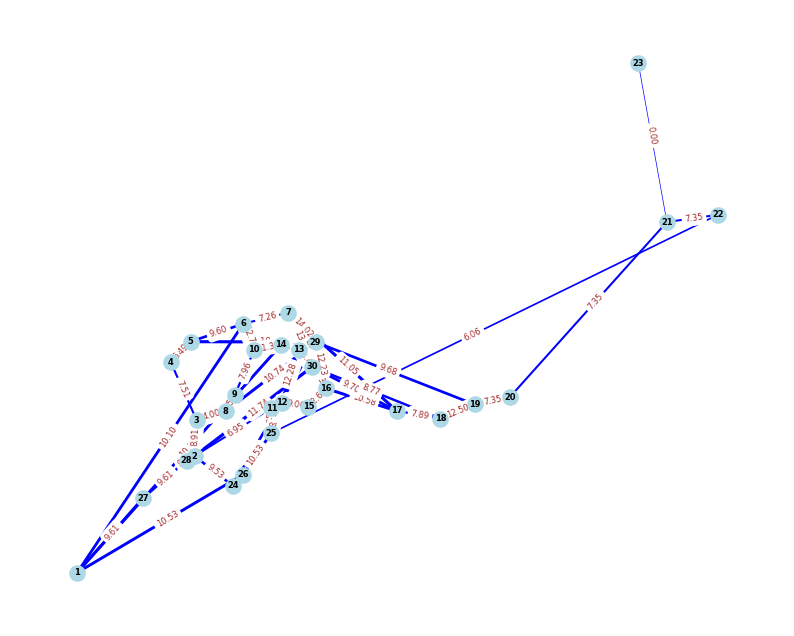

Iter 02: Obj=55311.2820, Best=55311.2820, Tabu=2


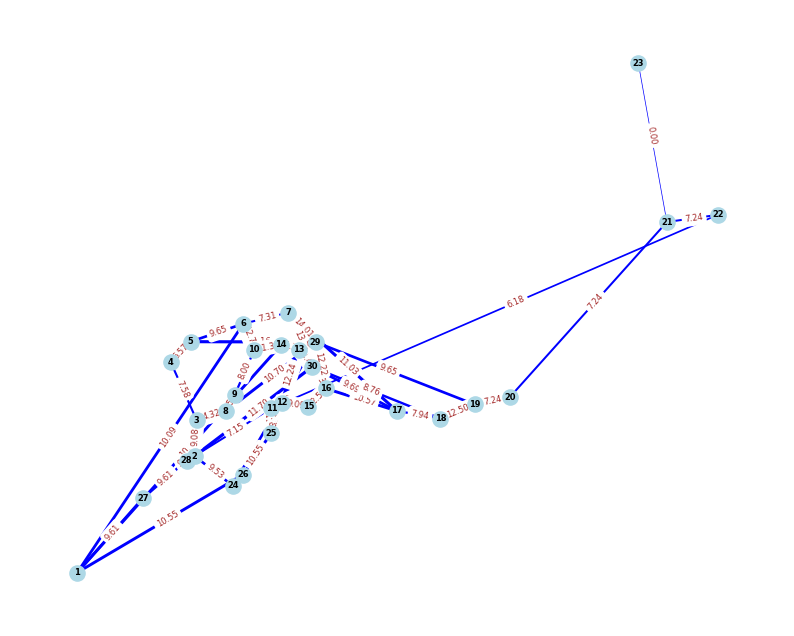

Iter 03: Obj=53896.0620, Best=53896.0620, Tabu=3


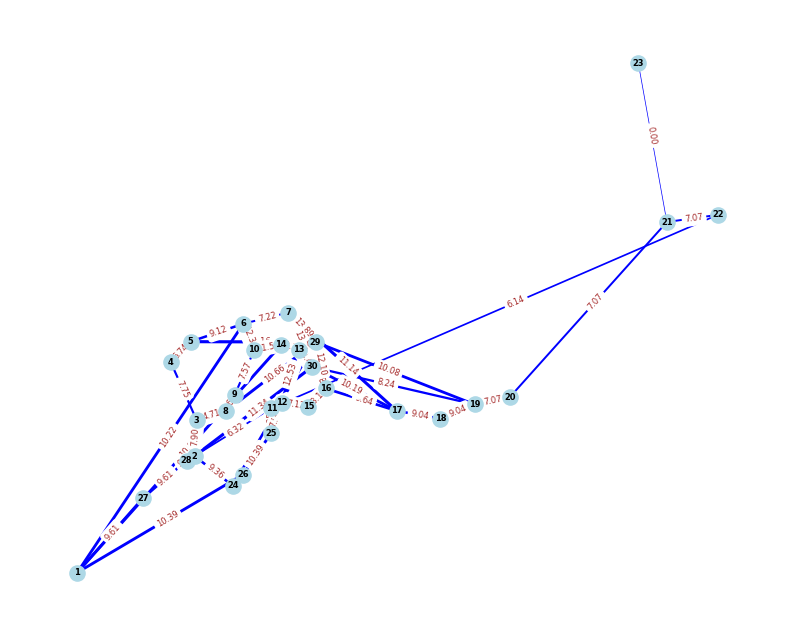

Iter 04: Obj=52543.8279, Best=52543.8279, Tabu=4


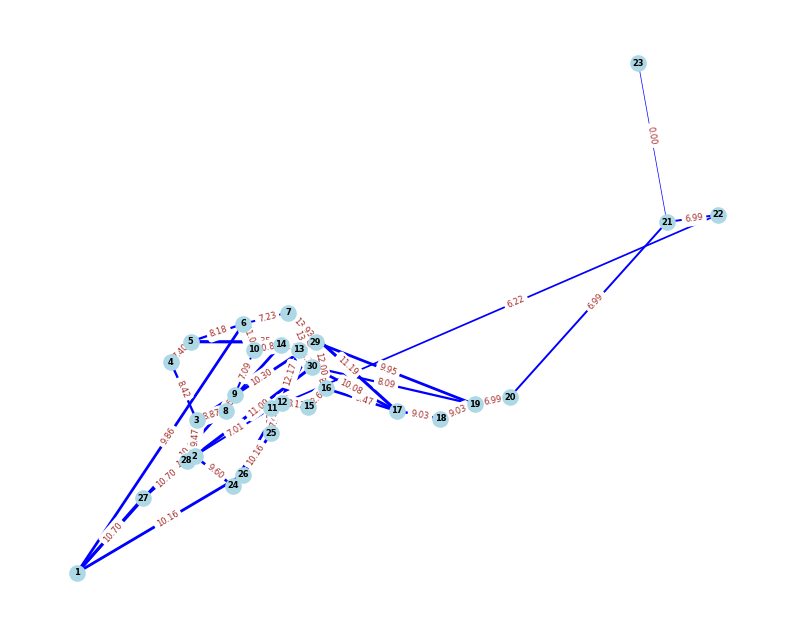

Iter 05: Obj=52543.8279, Best=52543.8279, Tabu=5


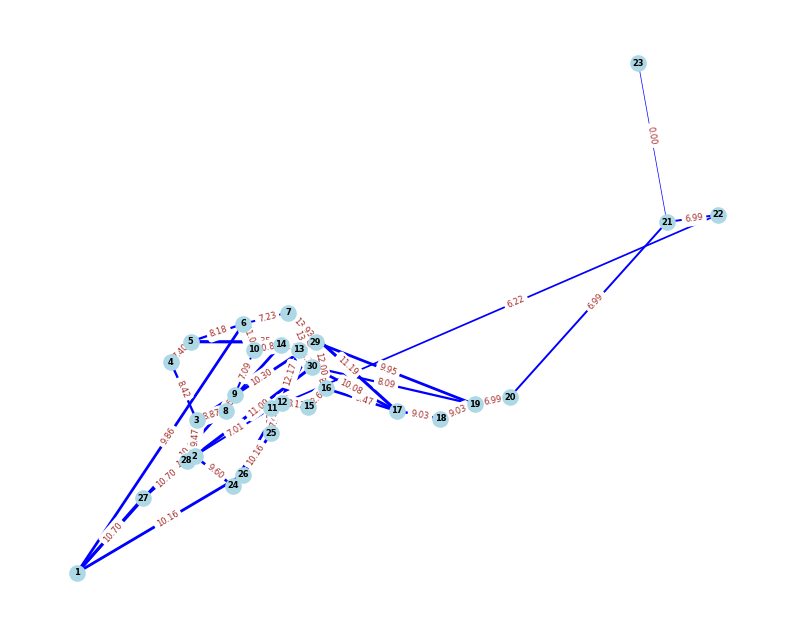

Iter 06: Obj=53791.2685, Best=52543.8279, Tabu=6


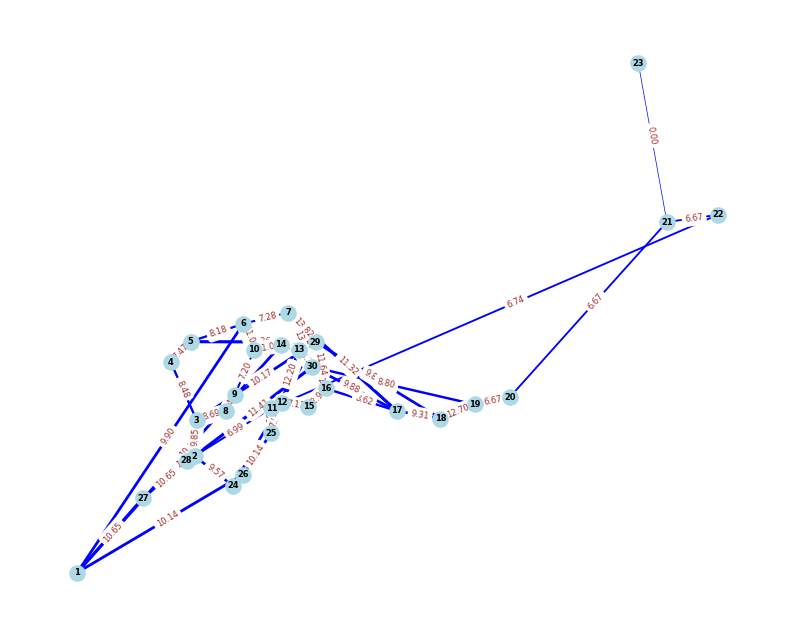

Iter 07: Obj=51336.5486, Best=51336.5486, Tabu=7


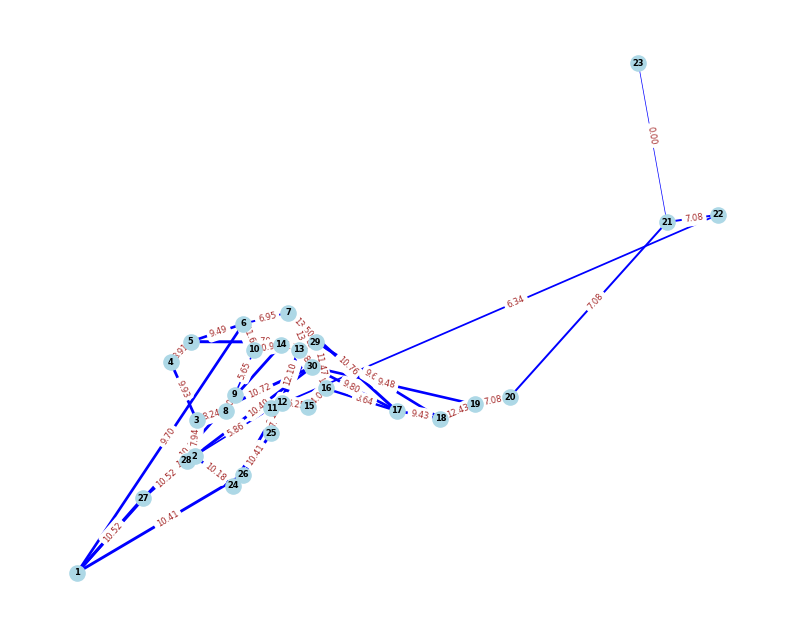

Iter 08: Obj=51815.1230, Best=51336.5486, Tabu=8


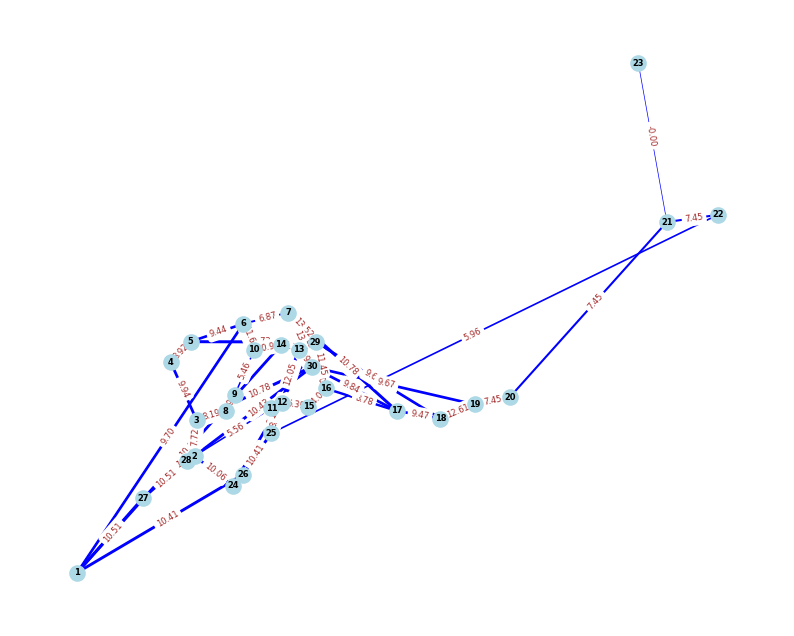

Iter 09: Obj=50396.1172, Best=50396.1172, Tabu=9


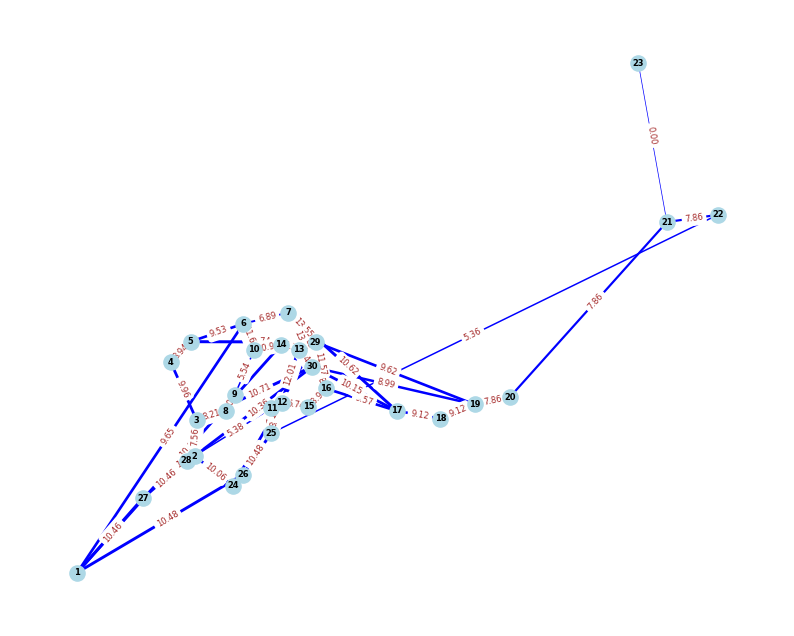

Iter 10: Obj=50992.5240, Best=50396.1172, Tabu=10


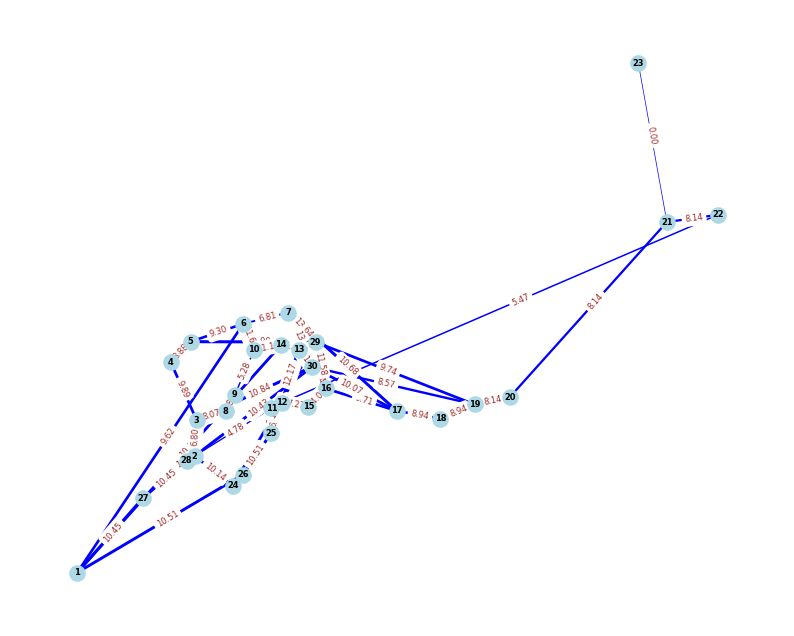

Iter 11: Obj=52019.0834, Best=50396.1172, Tabu=11


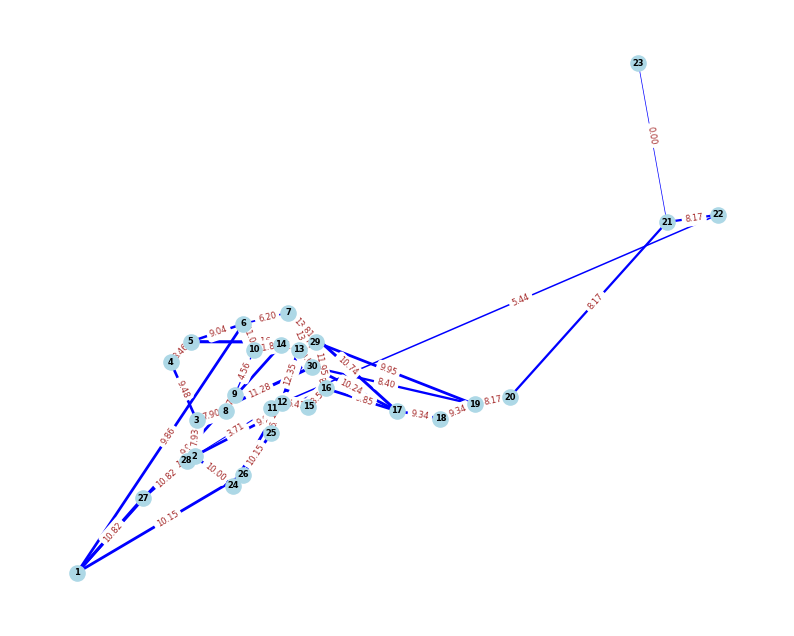

Iter 12: Obj=54102.9340, Best=50396.1172, Tabu=12


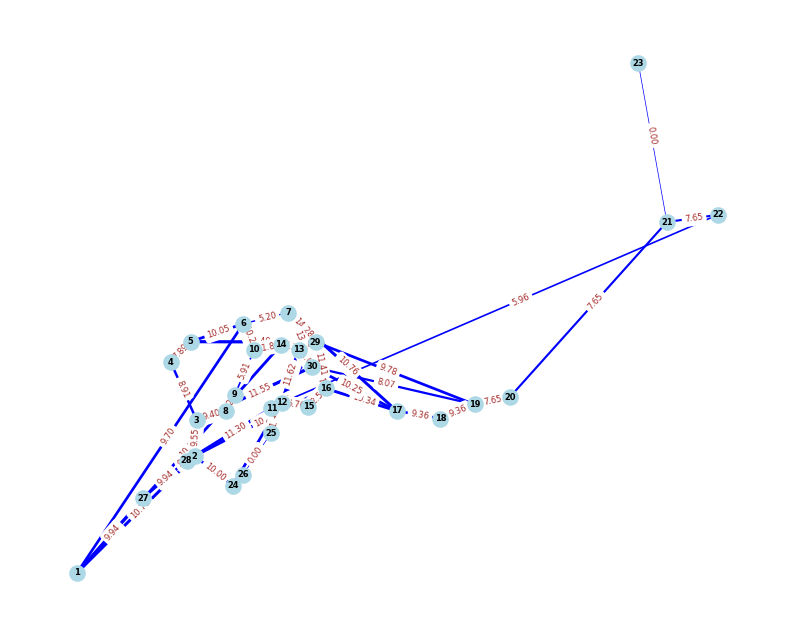

Iter 13: Obj=57579.0023, Best=50396.1172, Tabu=13


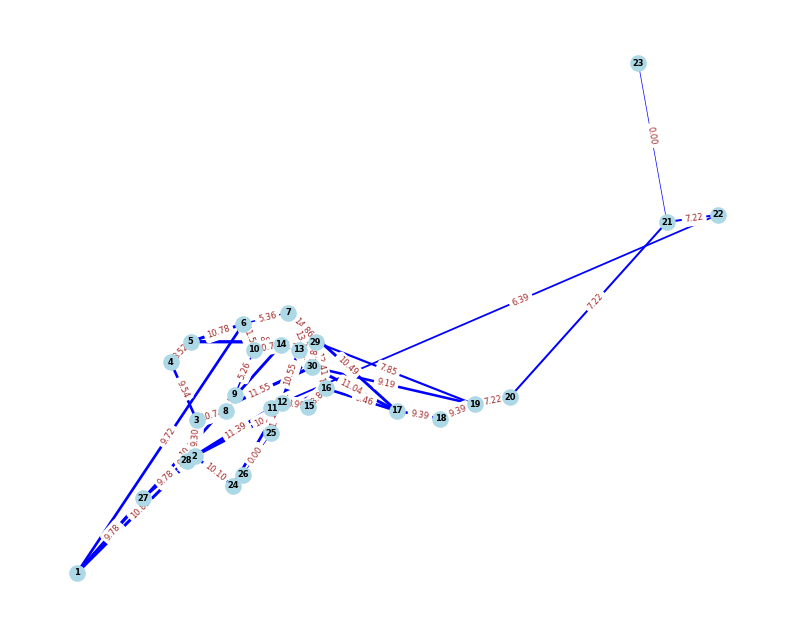

Iter 14: Obj=57854.8182, Best=50396.1172, Tabu=14


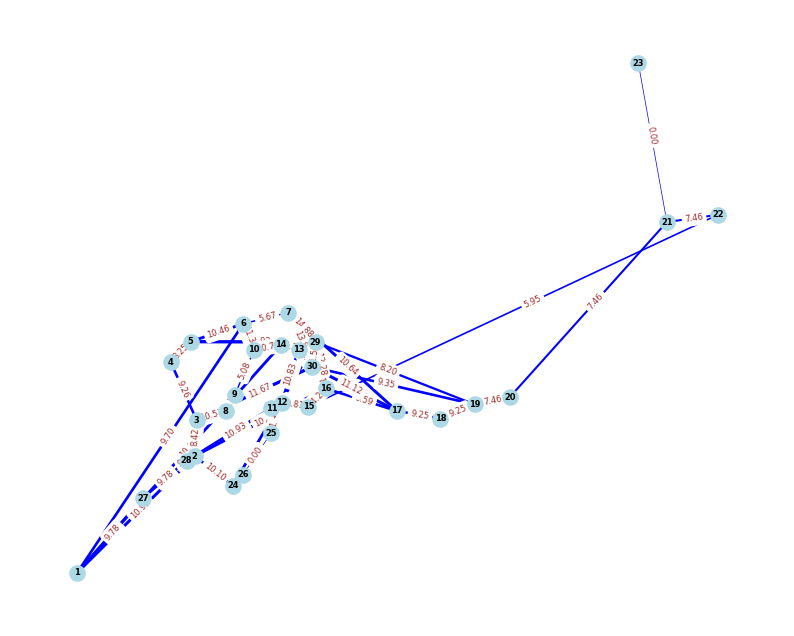

Iter 15: Obj=59045.3557, Best=50396.1172, Tabu=15


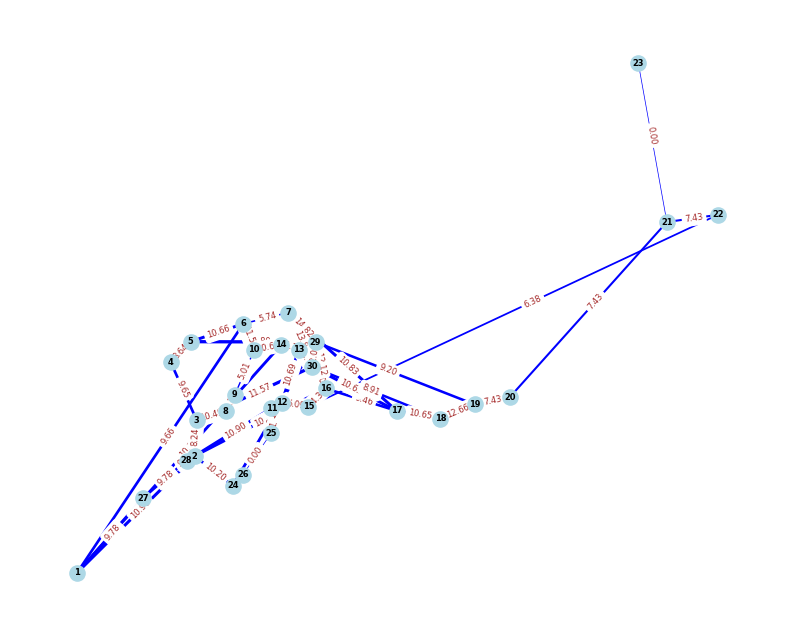

Iter 16: Obj=57990.7626, Best=50396.1172, Tabu=16


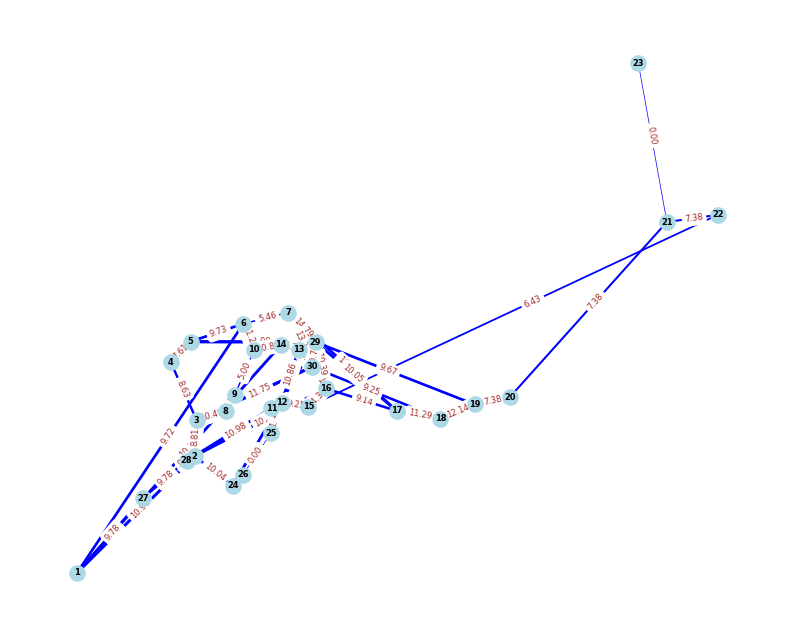

Iter 17: Obj=57286.3564, Best=50396.1172, Tabu=17


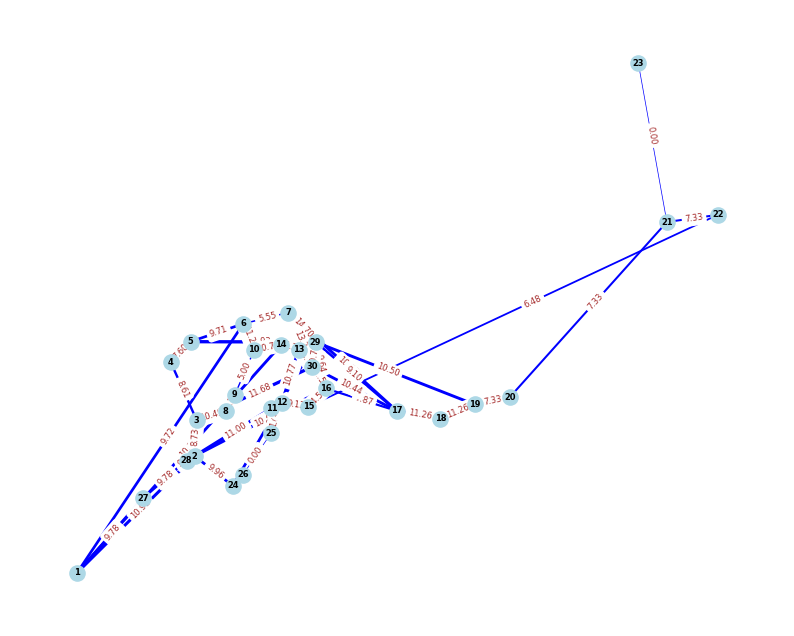

Iter 18: Obj=55520.0499, Best=50396.1172, Tabu=18


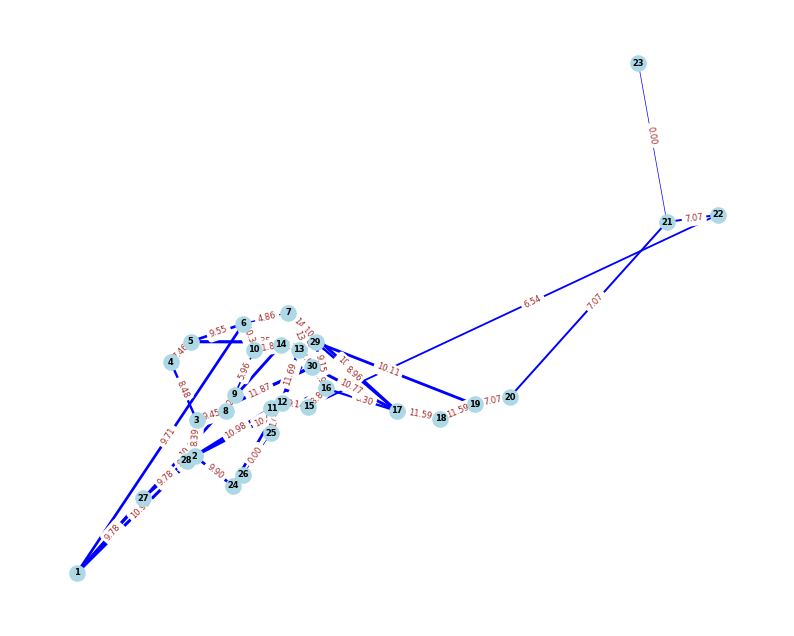

Iter 19: Obj=55903.9883, Best=50396.1172, Tabu=19


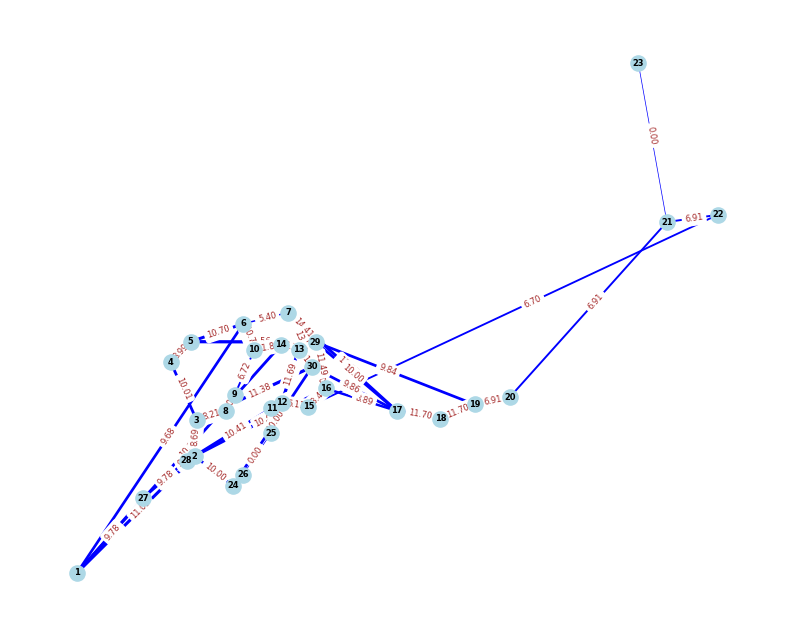

Iter 20: Obj=55697.8144, Best=50396.1172, Tabu=20


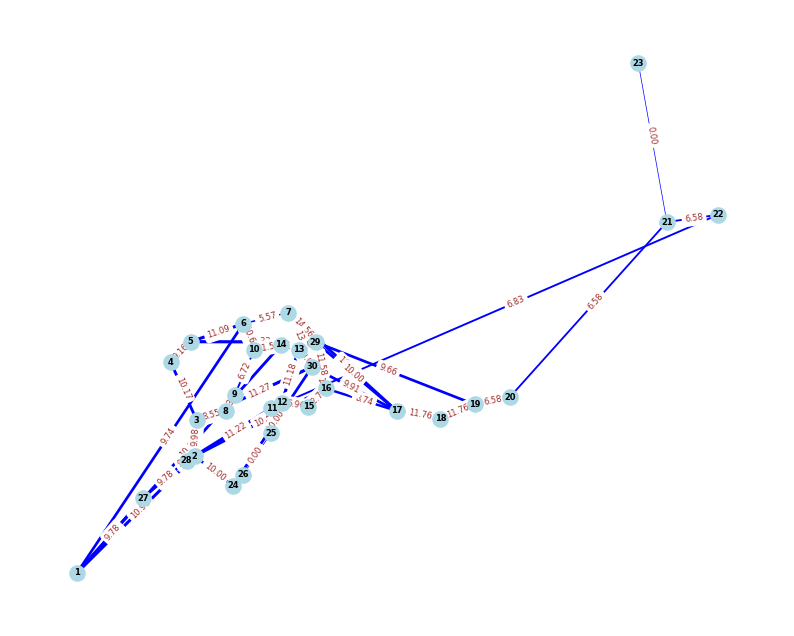

Iter 21: Obj=57689.5919, Best=50396.1172, Tabu=21


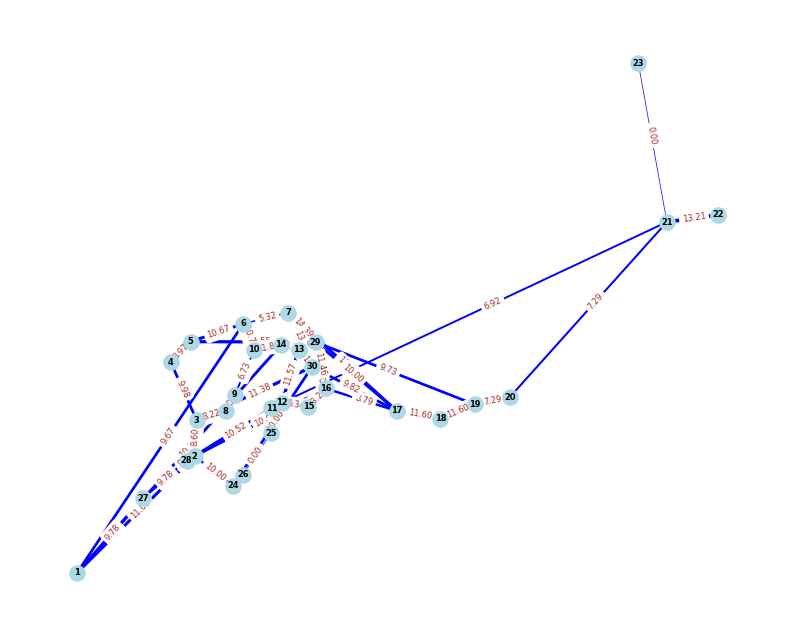

Iter 22: Obj=57855.8520, Best=50396.1172, Tabu=22


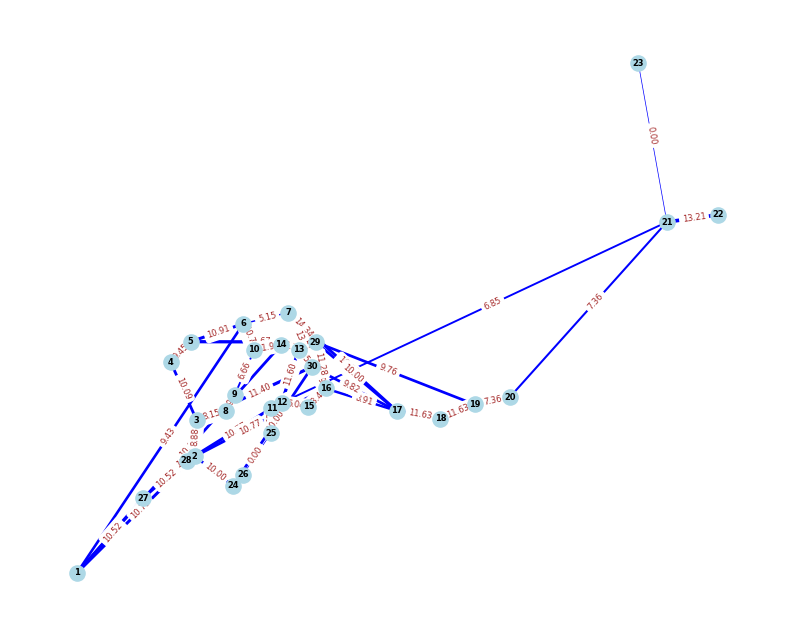

Iter 23: Obj=55755.7063, Best=50396.1172, Tabu=23


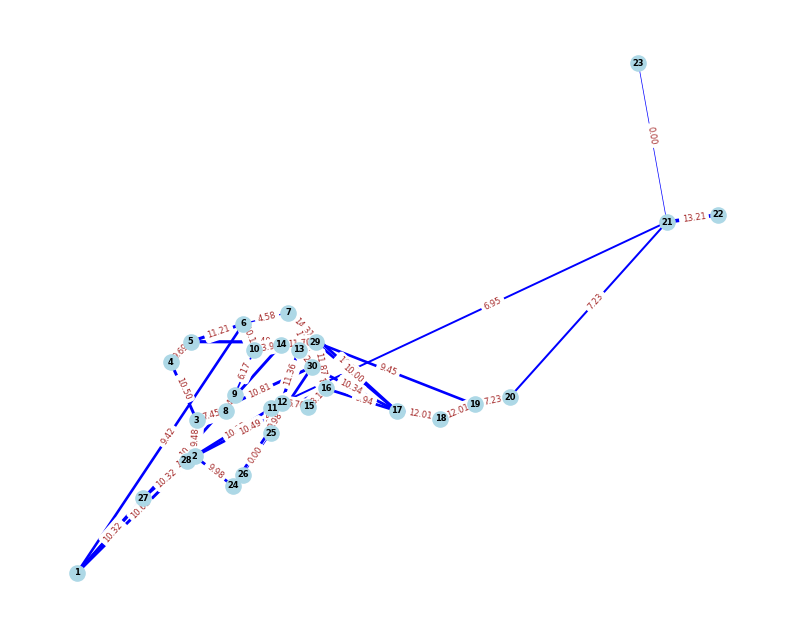

Iter 24: Obj=53551.6287, Best=50396.1172, Tabu=24


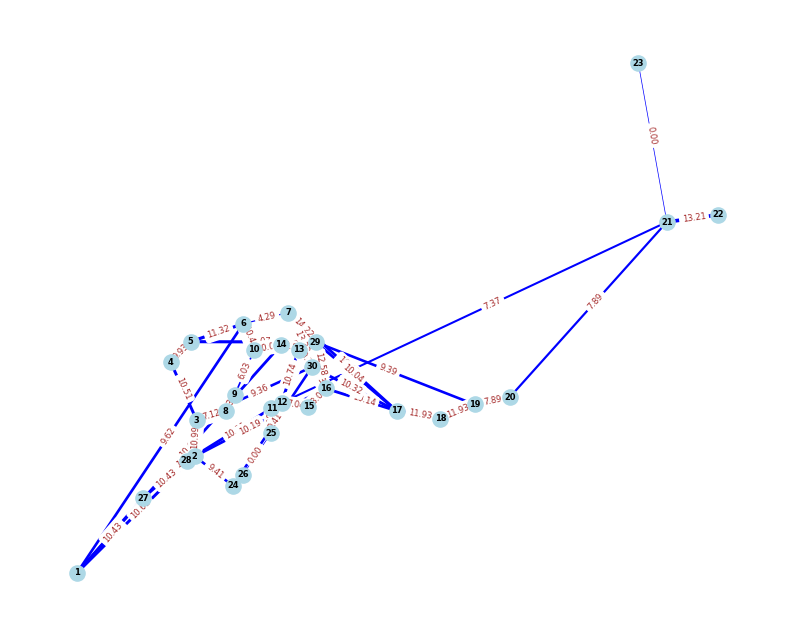

Iter 25: Obj=51497.6546, Best=50396.1172, Tabu=25


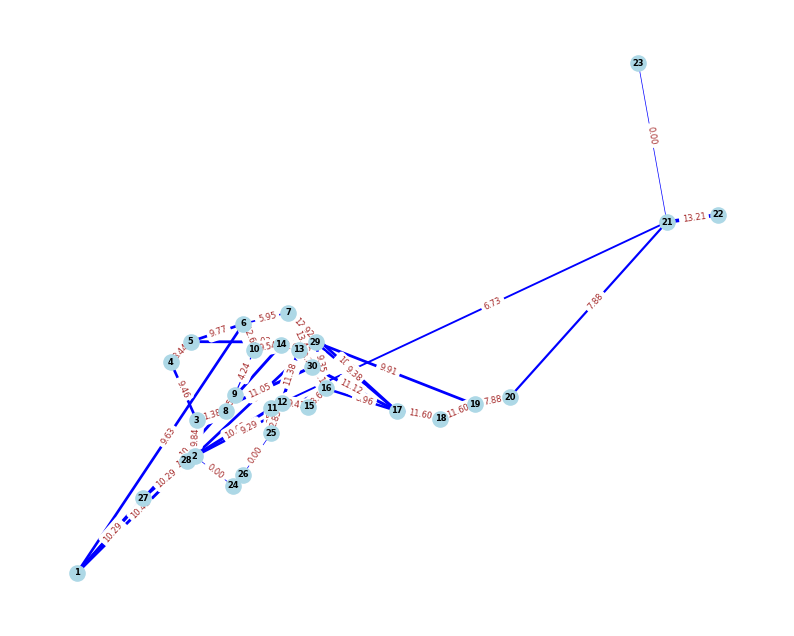

Iter 26: Obj=49947.7013, Best=49947.7013, Tabu=26


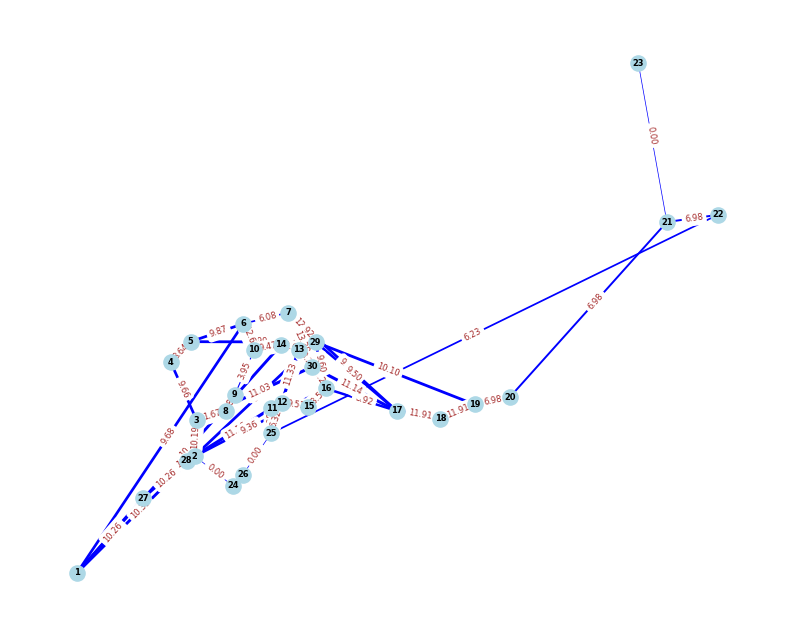

Iter 27: Obj=53459.5052, Best=49947.7013, Tabu=27


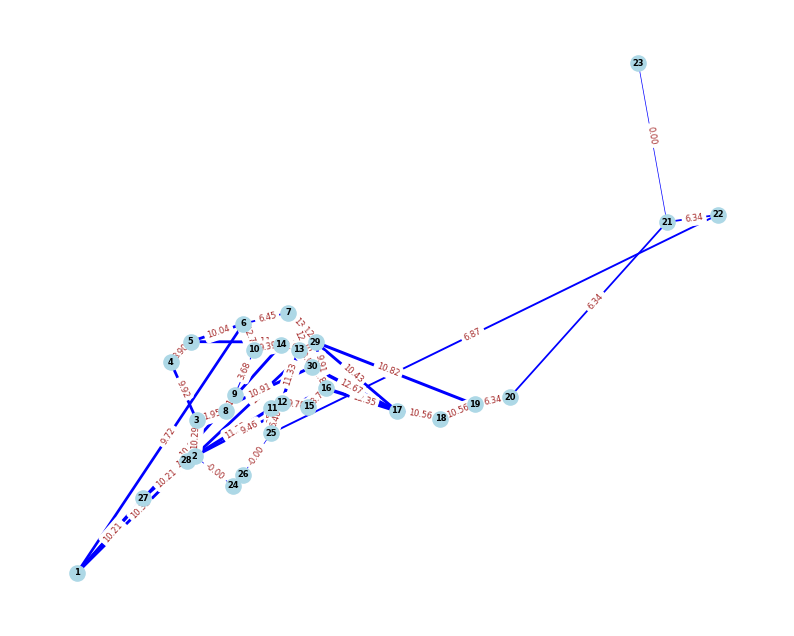

Iter 28: Obj=55543.0898, Best=49947.7013, Tabu=28


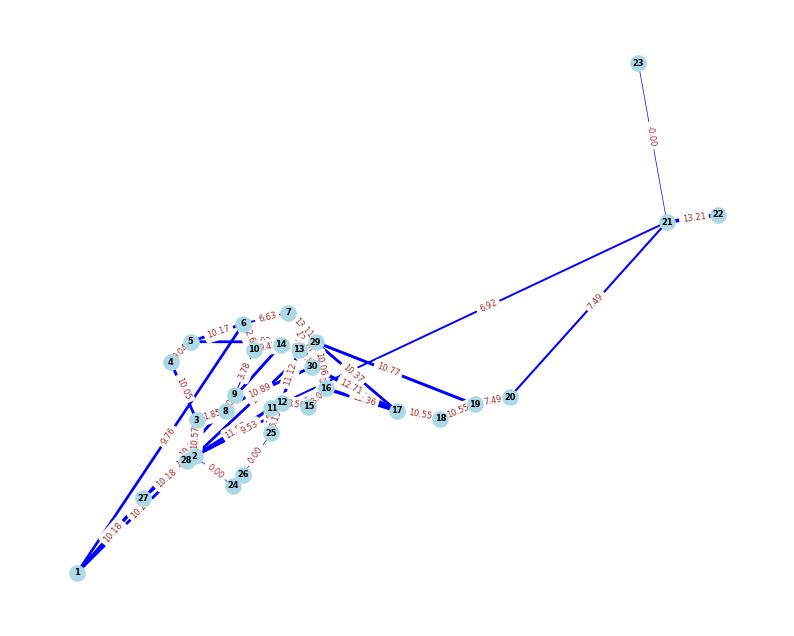

Iter 29: Obj=53549.9894, Best=49947.7013, Tabu=29


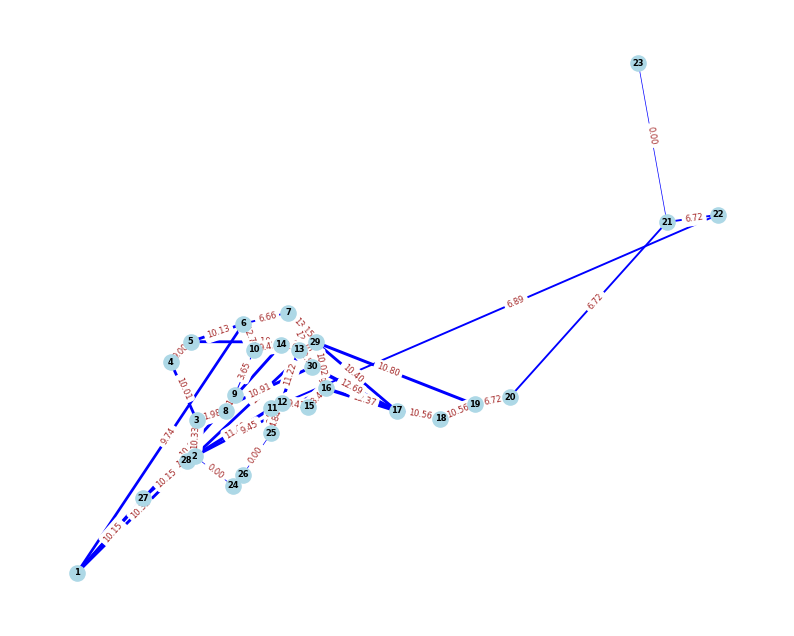

Iter 30: Obj=50987.3336, Best=49947.7013, Tabu=30


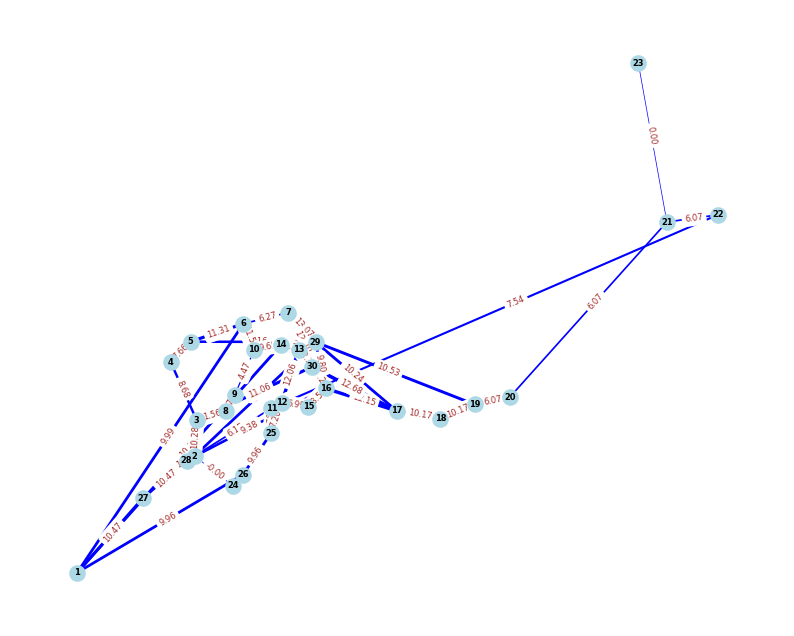

Iter 31: Obj=50936.5867, Best=49947.7013, Tabu=31


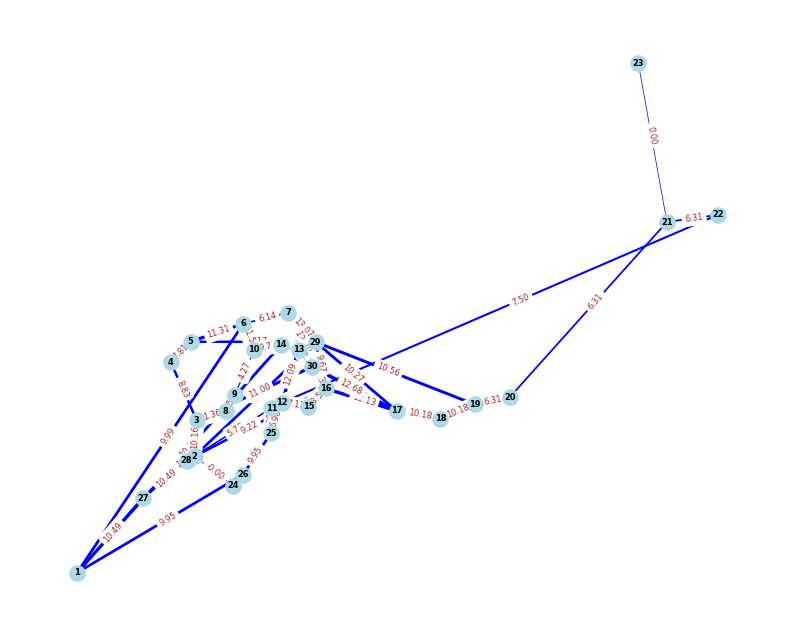

Iter 32: Obj=51233.8627, Best=49947.7013, Tabu=32


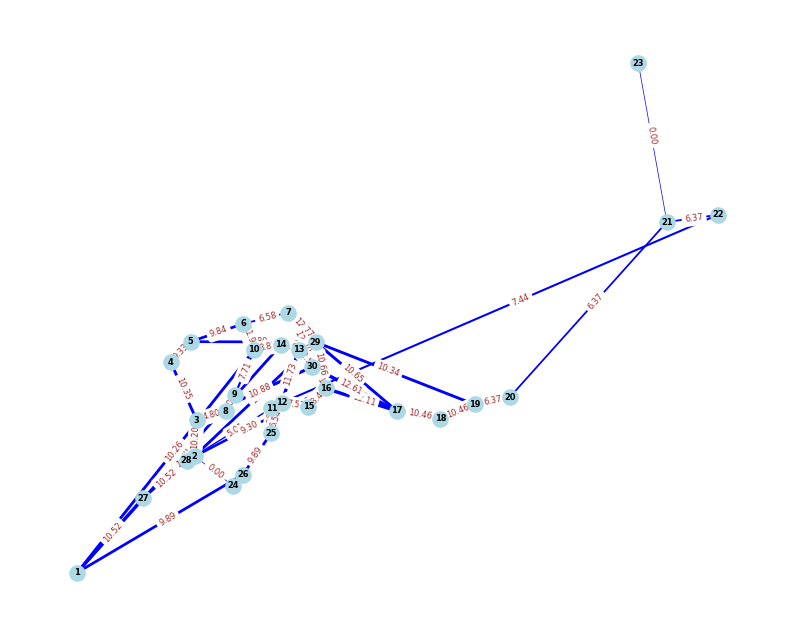

Iter 33: Obj=51976.4143, Best=49947.7013, Tabu=33


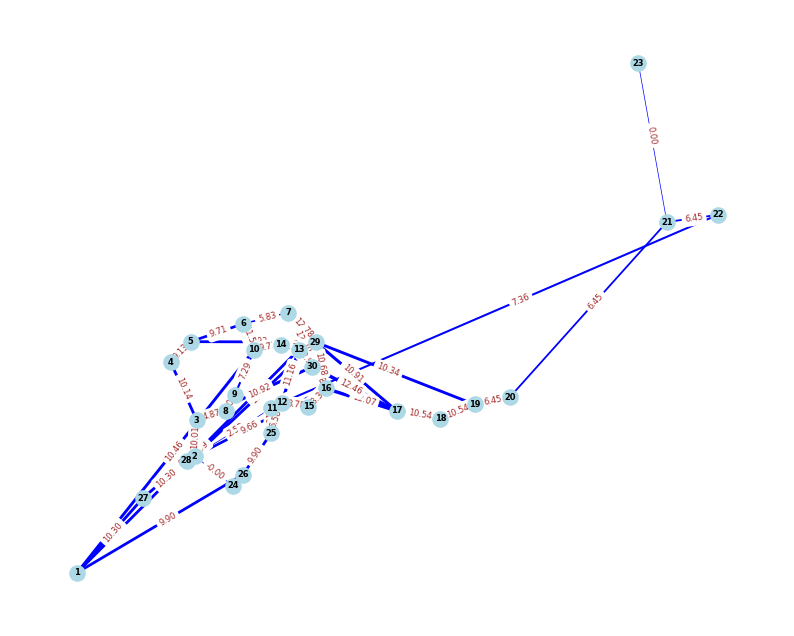

Iter 34: Obj=54495.3153, Best=49947.7013, Tabu=34


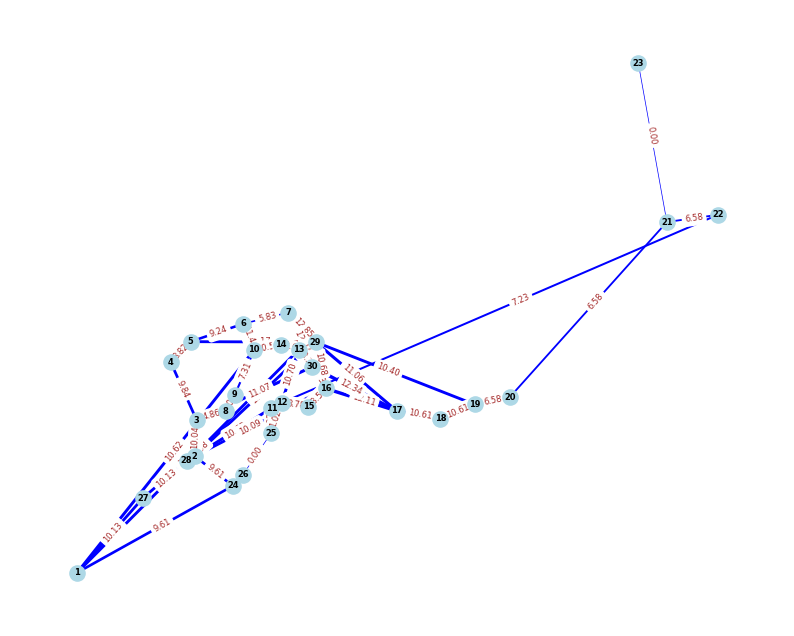

Iter 35: Obj=56618.8135, Best=49947.7013, Tabu=35


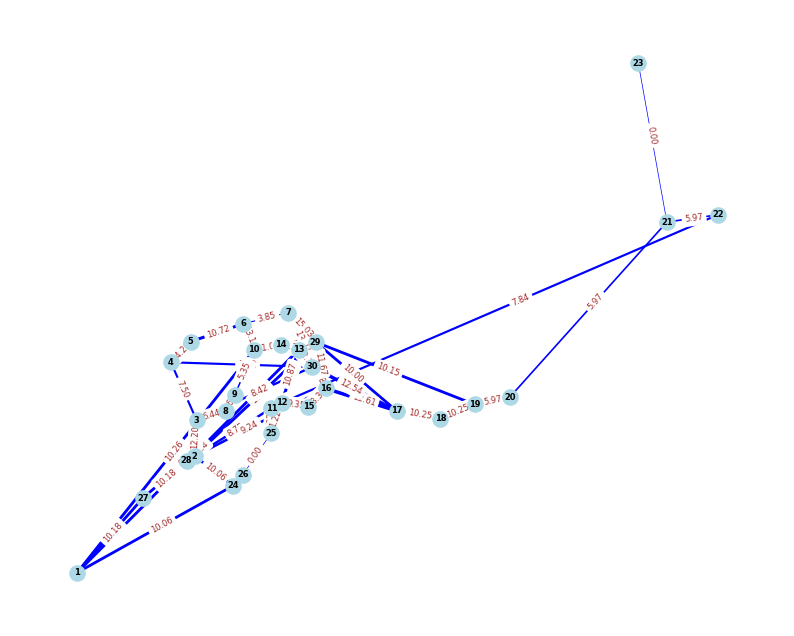

Iter 36: Obj=57095.3915, Best=49947.7013, Tabu=35


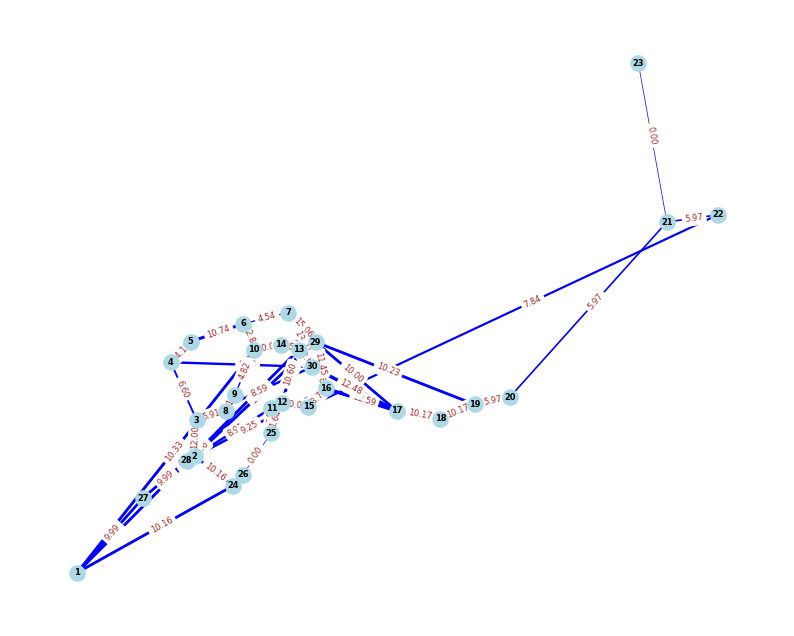

Iter 37: Obj=57147.8346, Best=49947.7013, Tabu=35


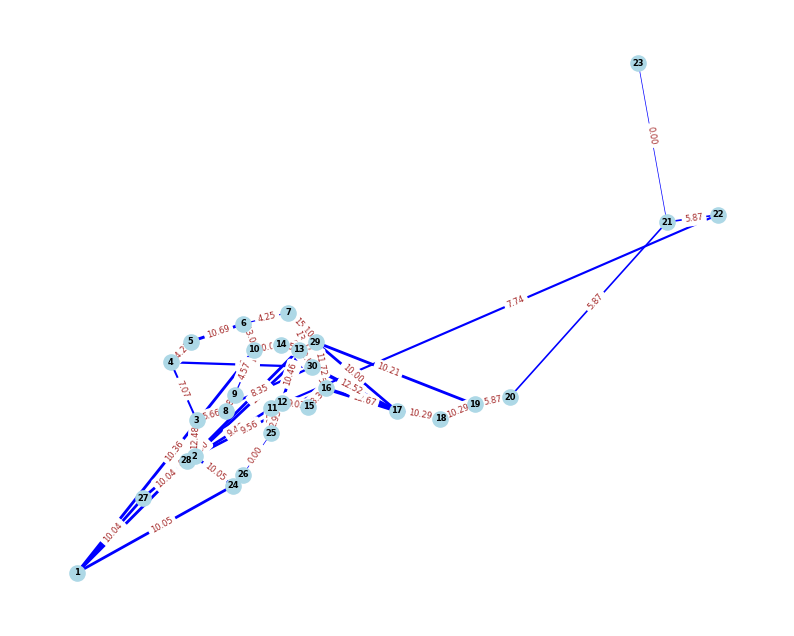

Iter 38: Obj=56369.0170, Best=49947.7013, Tabu=36


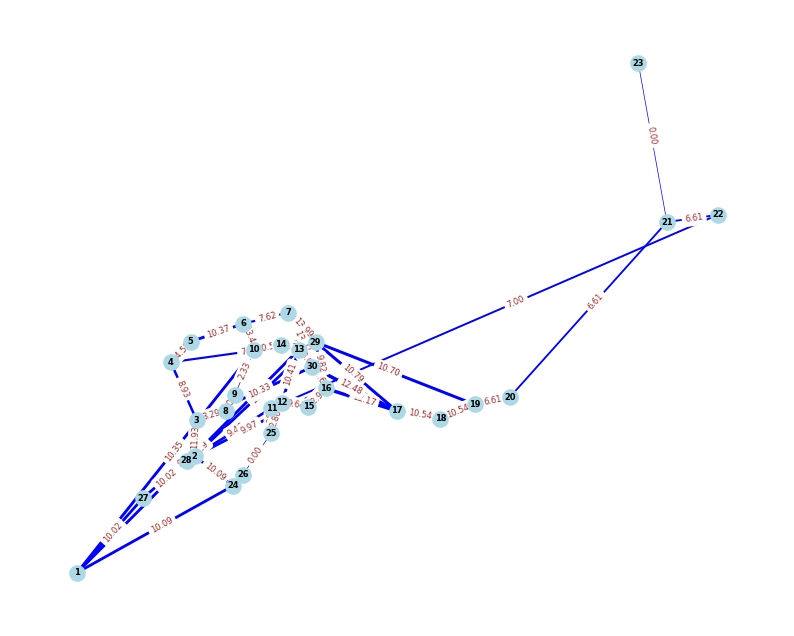

Iter 39: Obj=57840.5260, Best=49947.7013, Tabu=37


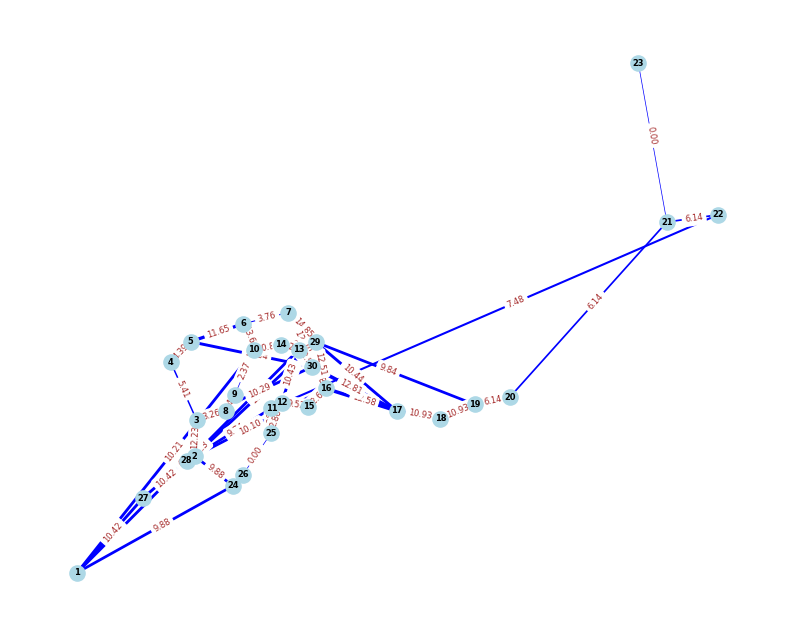

Iter 40: Obj=60373.4581, Best=49947.7013, Tabu=37


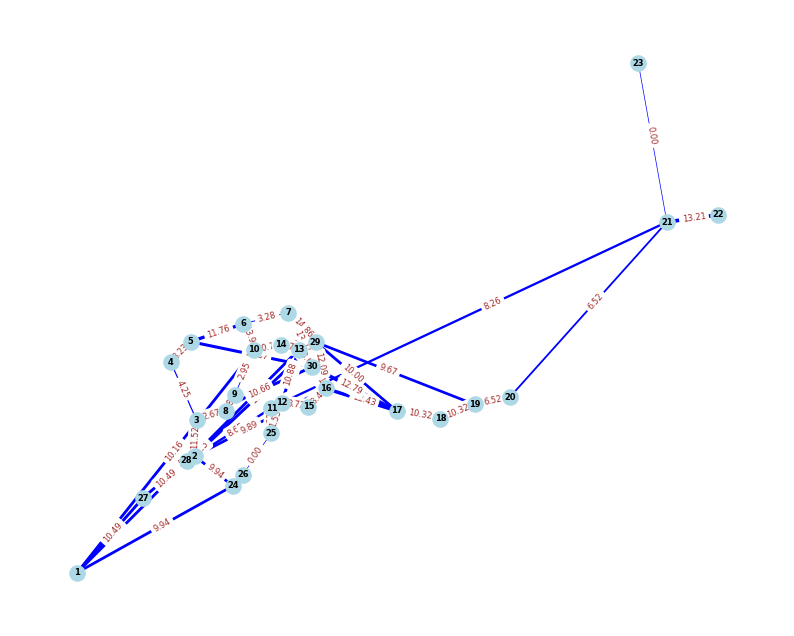

Iter 41: Obj=59741.8513, Best=49947.7013, Tabu=38


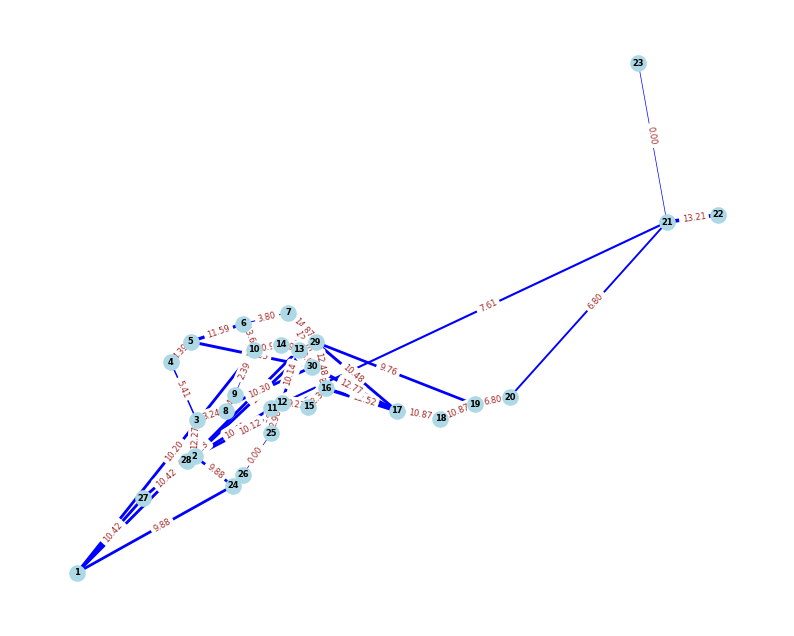

Iter 42: Obj=57194.0393, Best=49947.7013, Tabu=39


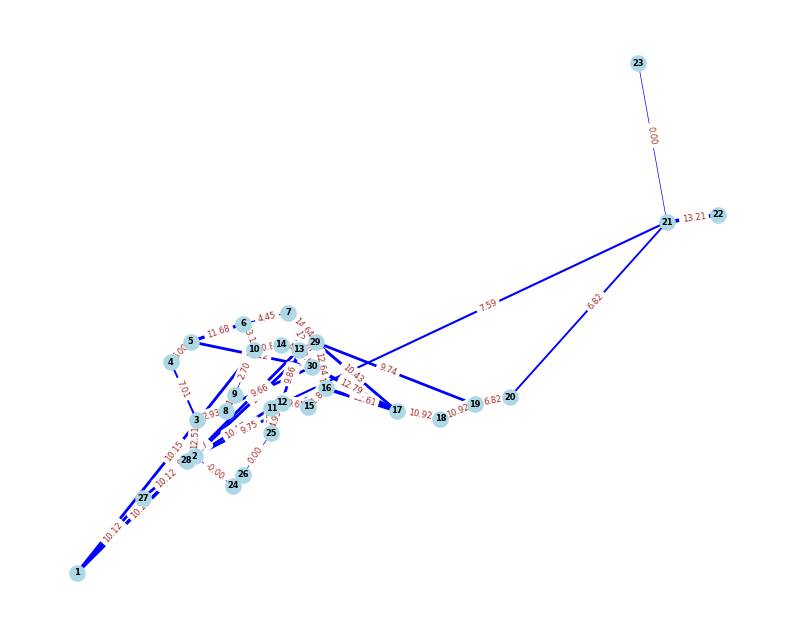

Iter 43: Obj=54049.4217, Best=49947.7013, Tabu=40


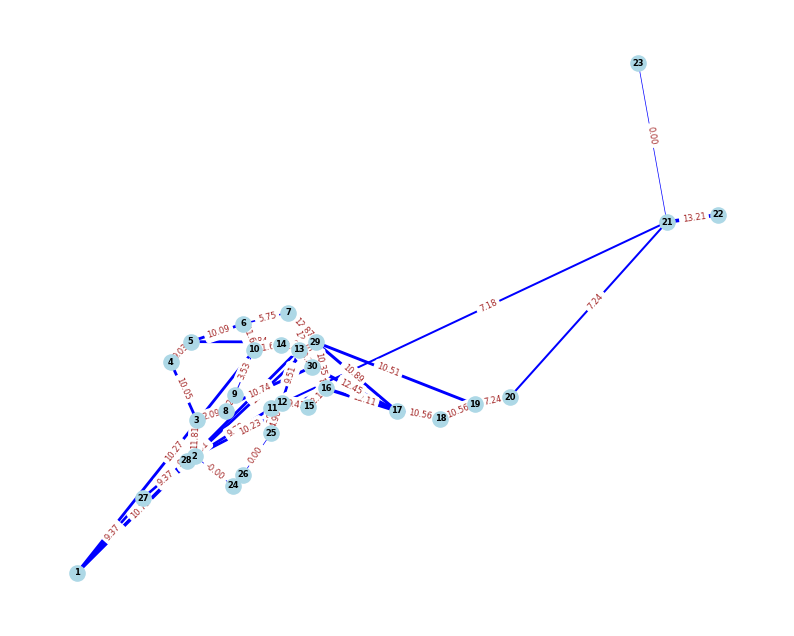

Iter 44: Obj=52224.8683, Best=49947.7013, Tabu=40


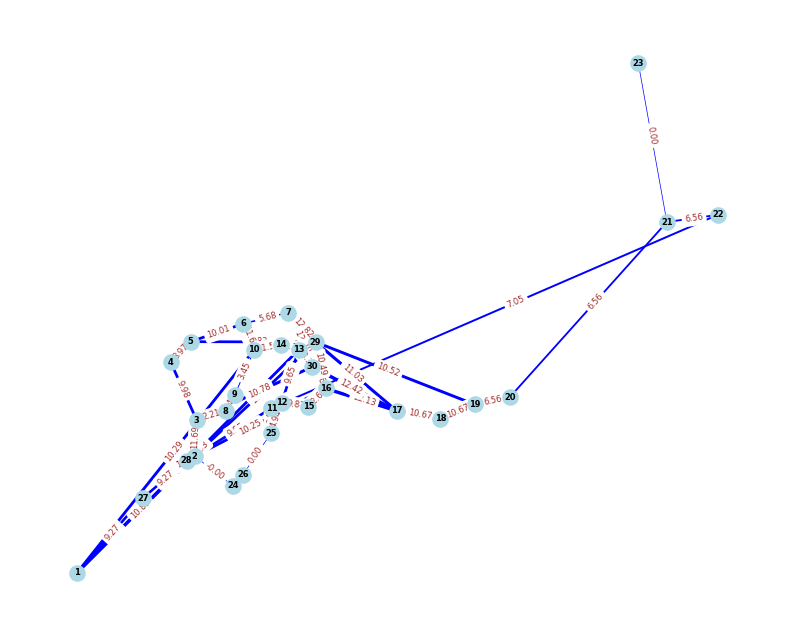

Iter 45: Obj=54718.4452, Best=49947.7013, Tabu=41


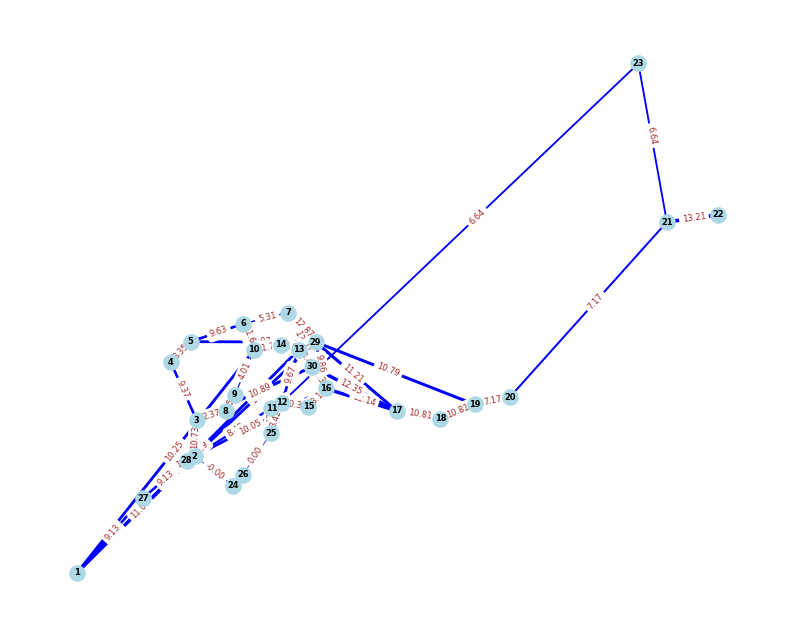

Iter 46: Obj=52224.8683, Best=49947.7013, Tabu=42


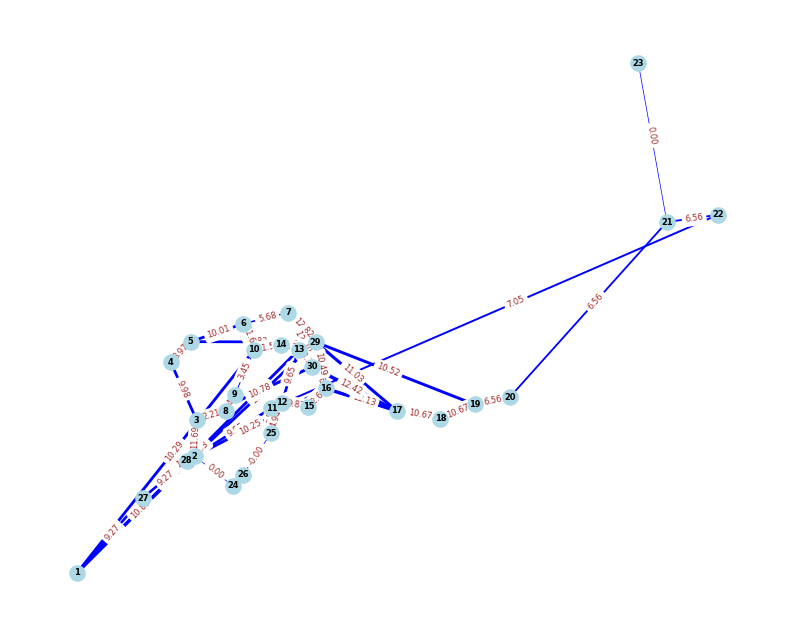

Iter 47: Obj=55184.2402, Best=49947.7013, Tabu=43


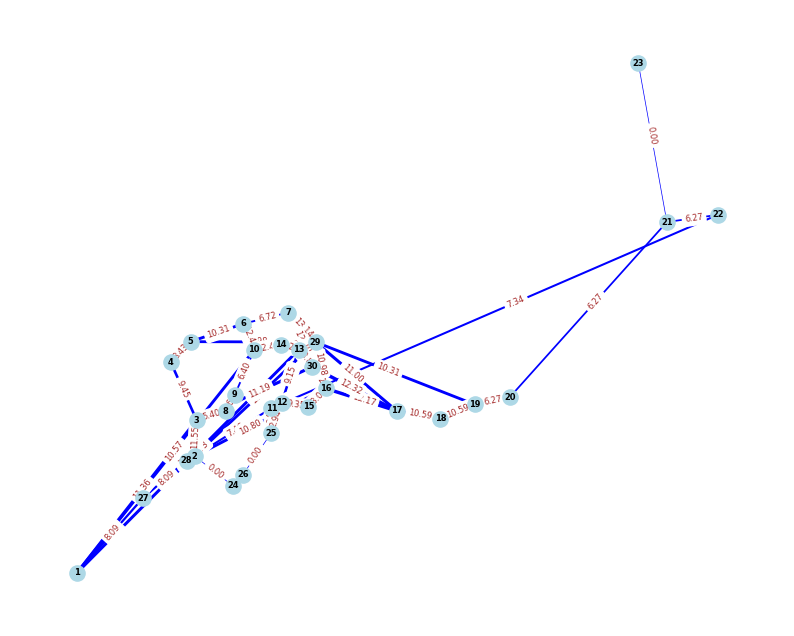

Iter 48: Obj=58753.6084, Best=49947.7013, Tabu=44


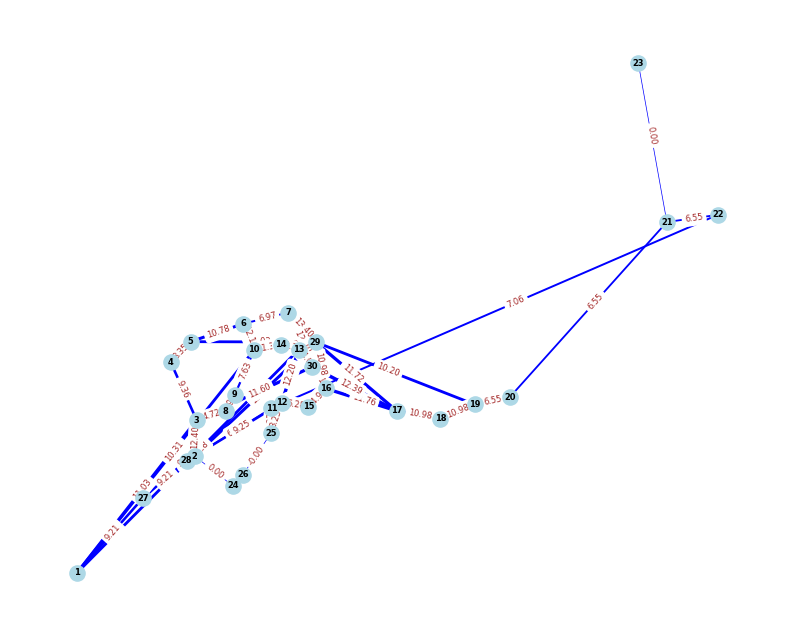

Iter 49: Obj=56073.9535, Best=49947.7013, Tabu=45


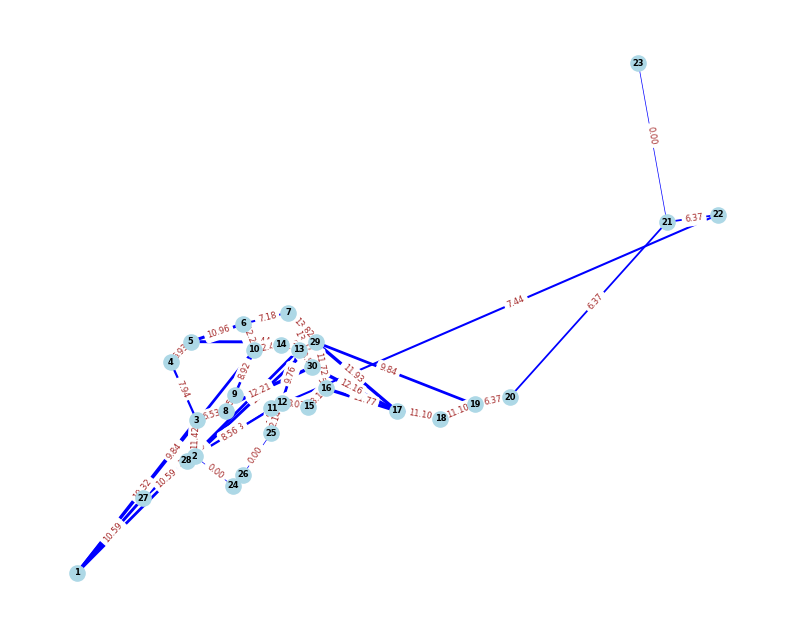

Iter 50: Obj=58842.5447, Best=49947.7013, Tabu=45


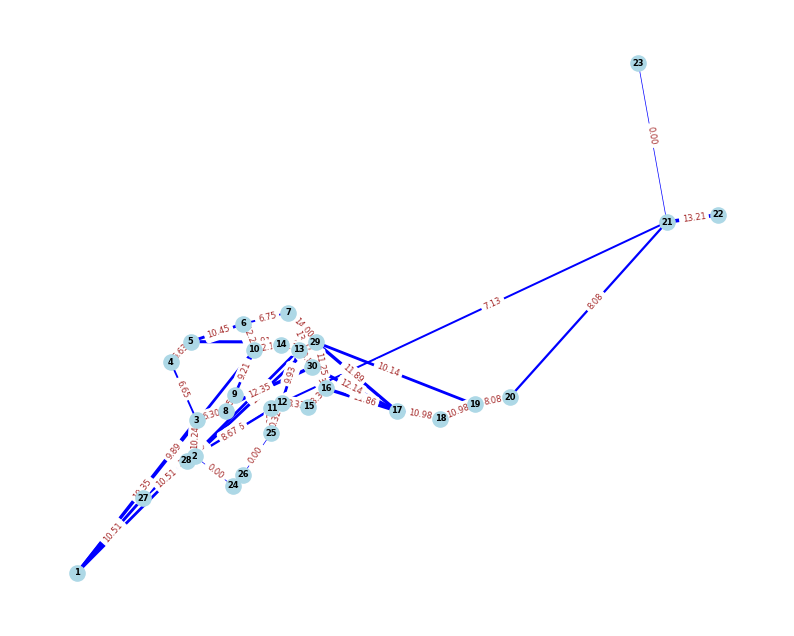

Iter 51: Obj=56073.9535, Best=49947.7013, Tabu=46


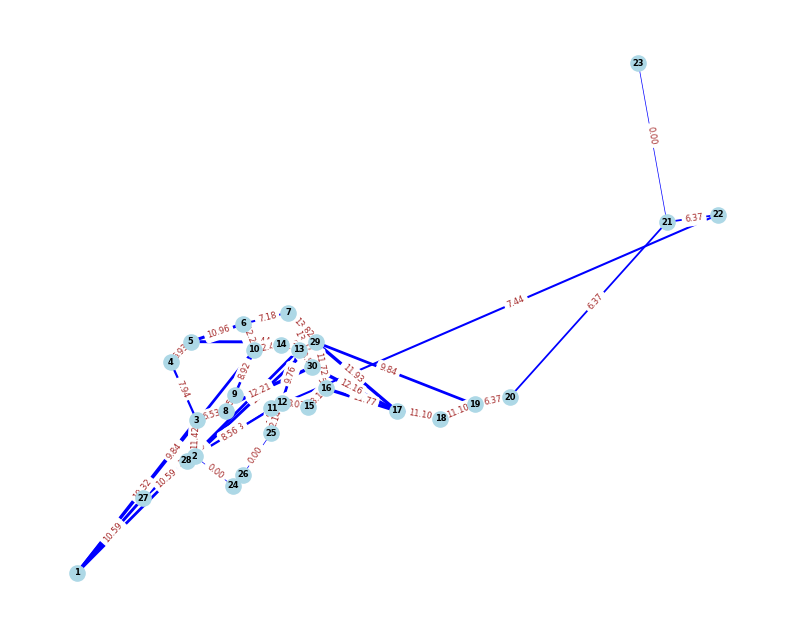

Iter 52: Obj=57614.8026, Best=49947.7013, Tabu=47


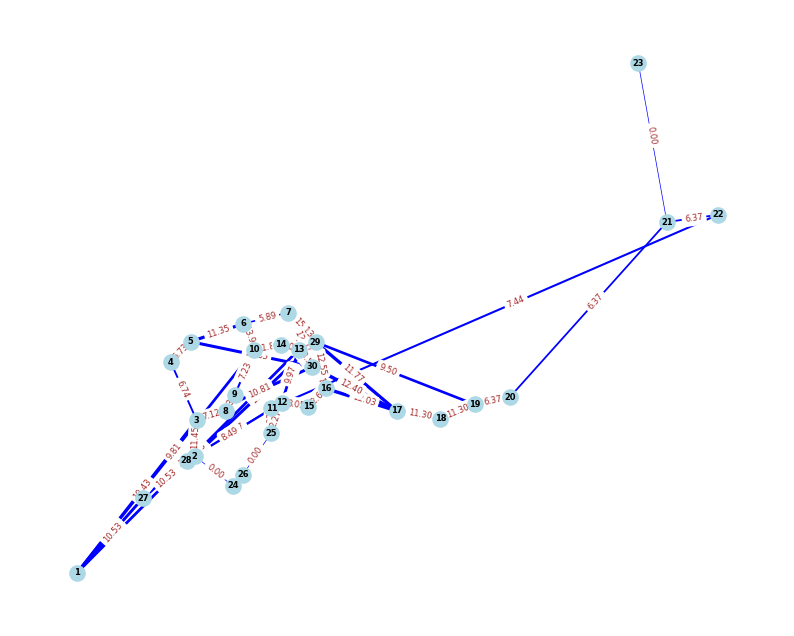

Iter 53: Obj=60892.0797, Best=49947.7013, Tabu=48


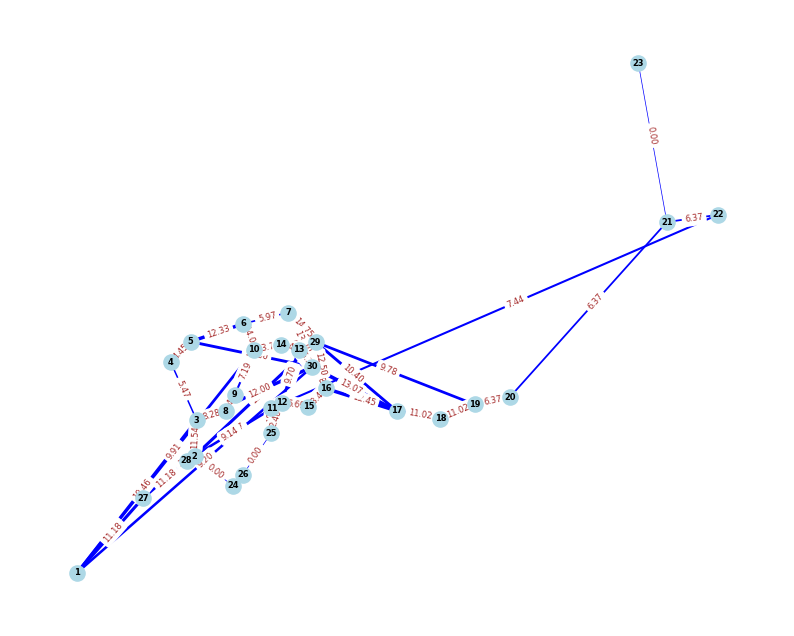

Iter 54: Obj=62551.1787, Best=49947.7013, Tabu=49


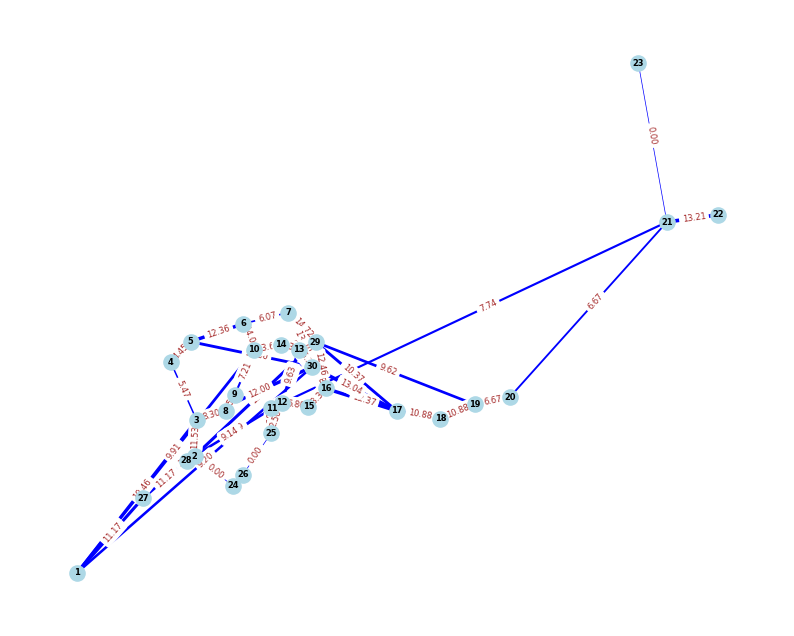

Iter 55: Obj=59352.9139, Best=49947.7013, Tabu=50


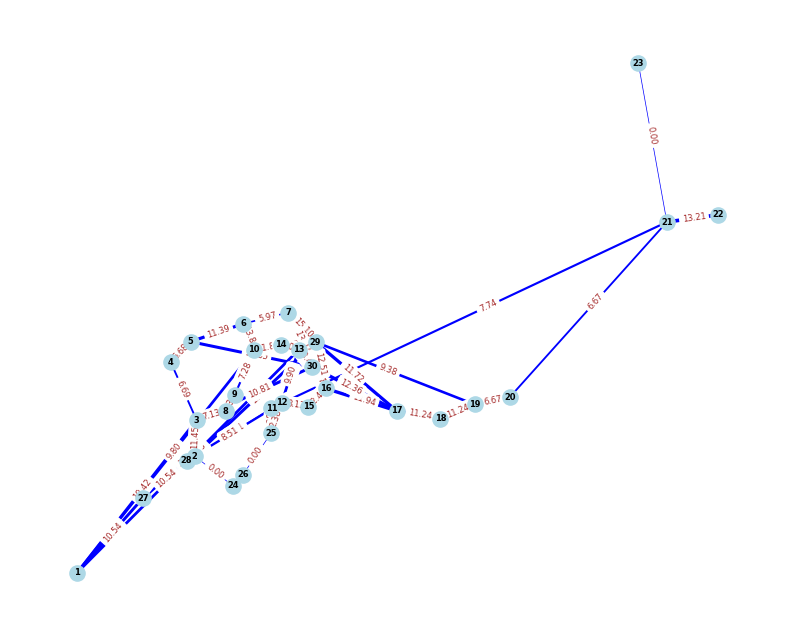

Iter 56: Obj=58713.3913, Best=49947.7013, Tabu=51


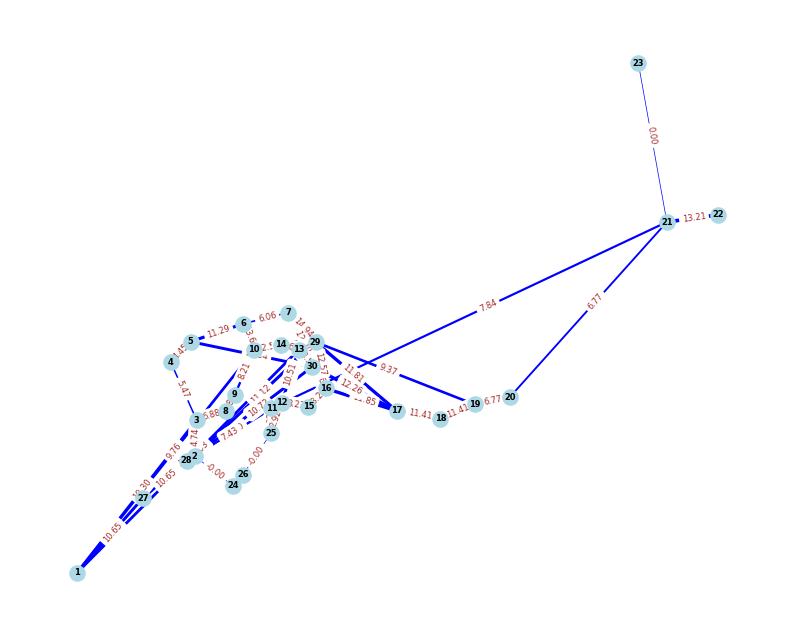

Iter 57: Obj=57889.6678, Best=49947.7013, Tabu=51


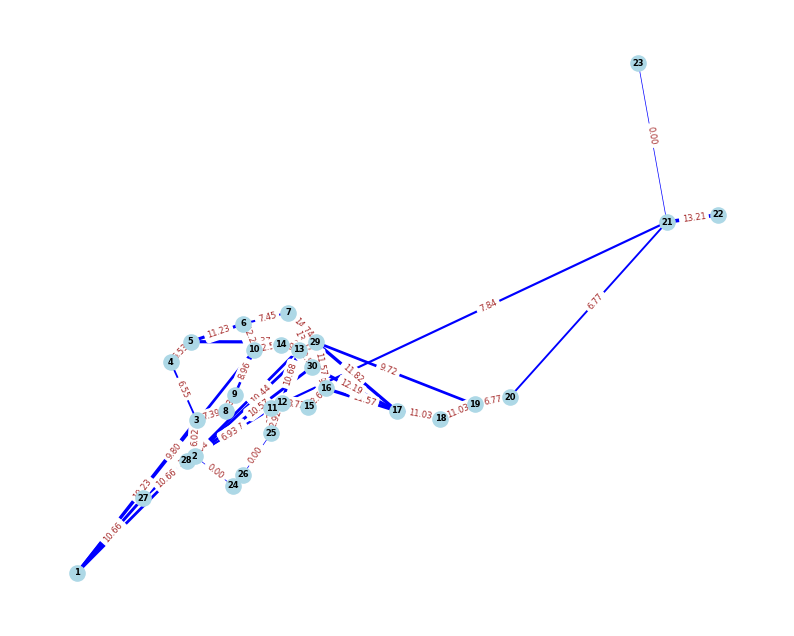

Iter 58: Obj=59657.7954, Best=49947.7013, Tabu=52


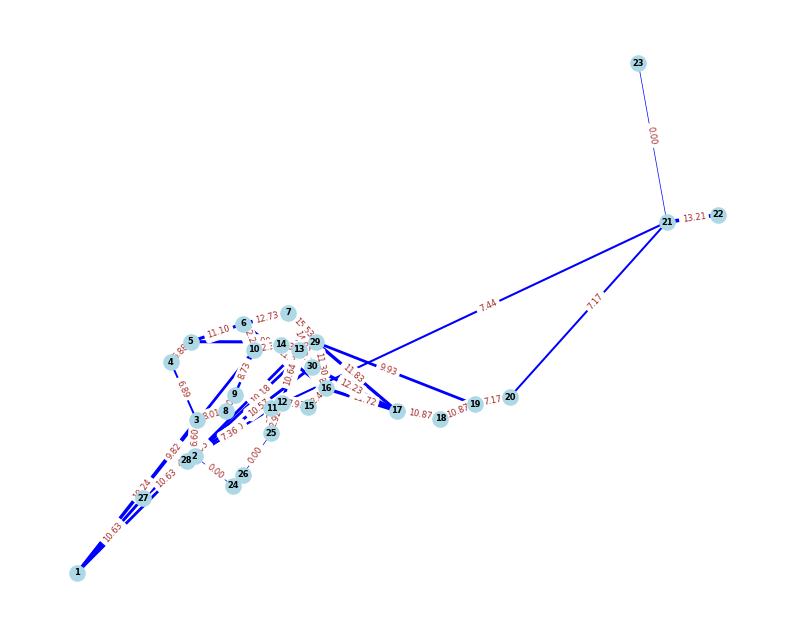

Iter 59: Obj=60496.2115, Best=49947.7013, Tabu=53


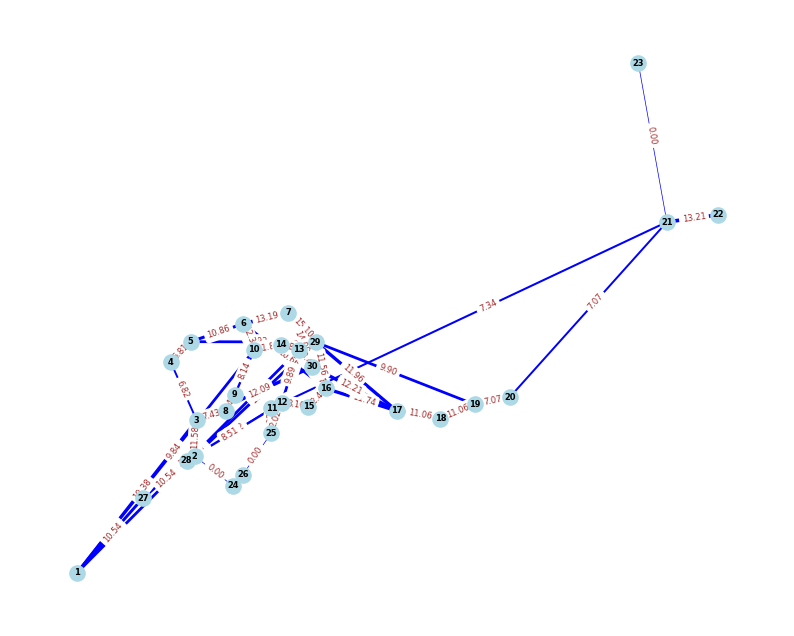

Iter 60: Obj=62958.2878, Best=49947.7013, Tabu=53


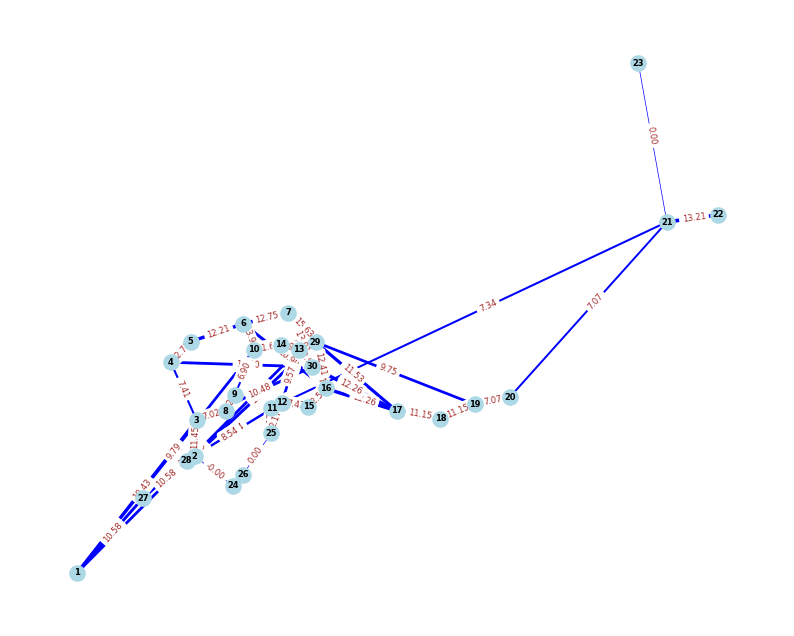

Iter 61: Obj=62648.6621, Best=49947.7013, Tabu=53


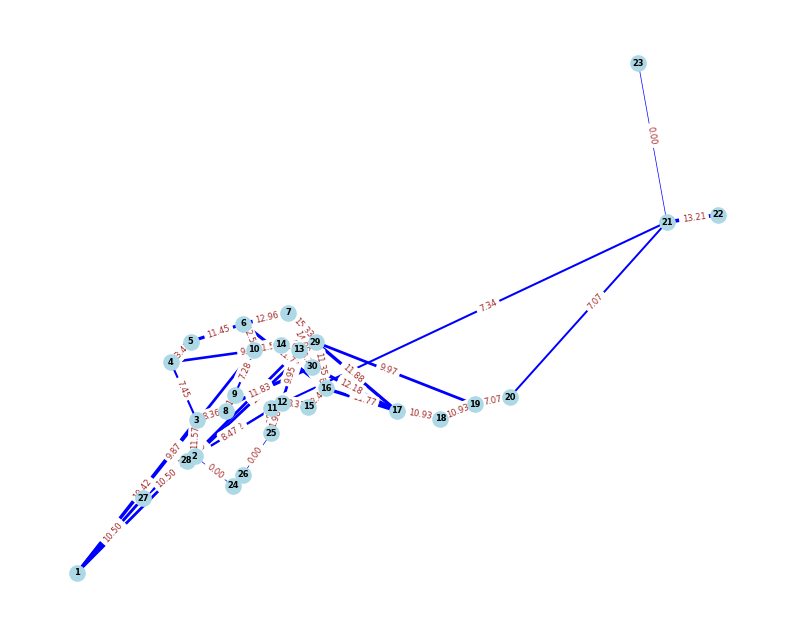

Iter 62: Obj=62769.0215, Best=49947.7013, Tabu=54


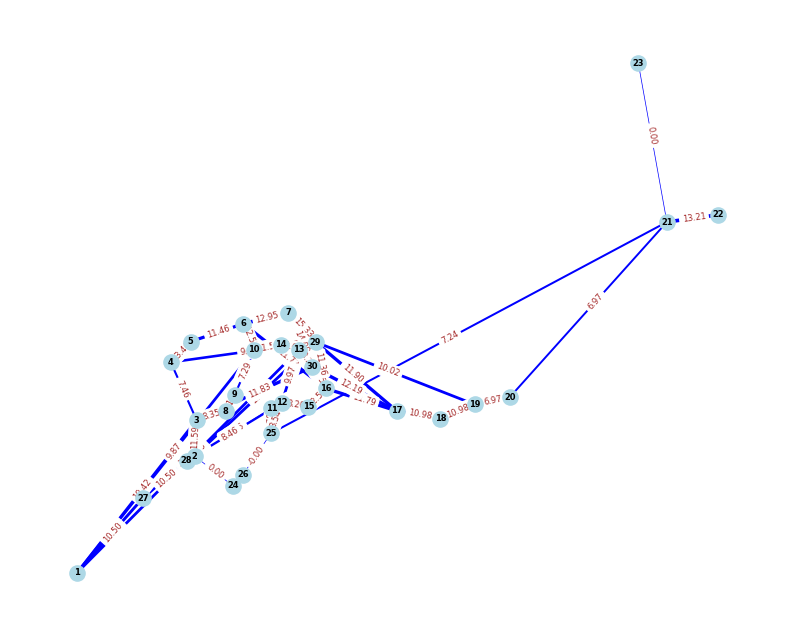

Iter 63: Obj=65023.8023, Best=49947.7013, Tabu=55


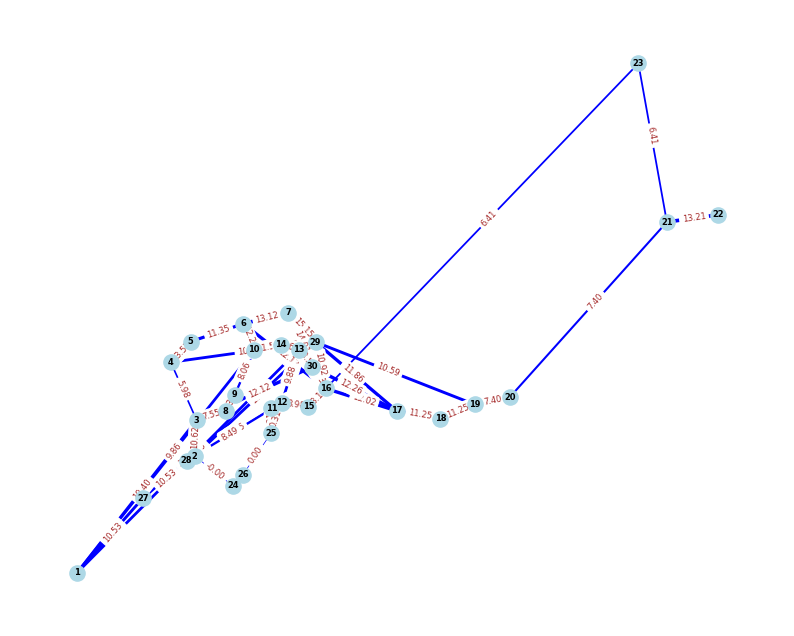

Iter 64: Obj=64299.0141, Best=49947.7013, Tabu=56


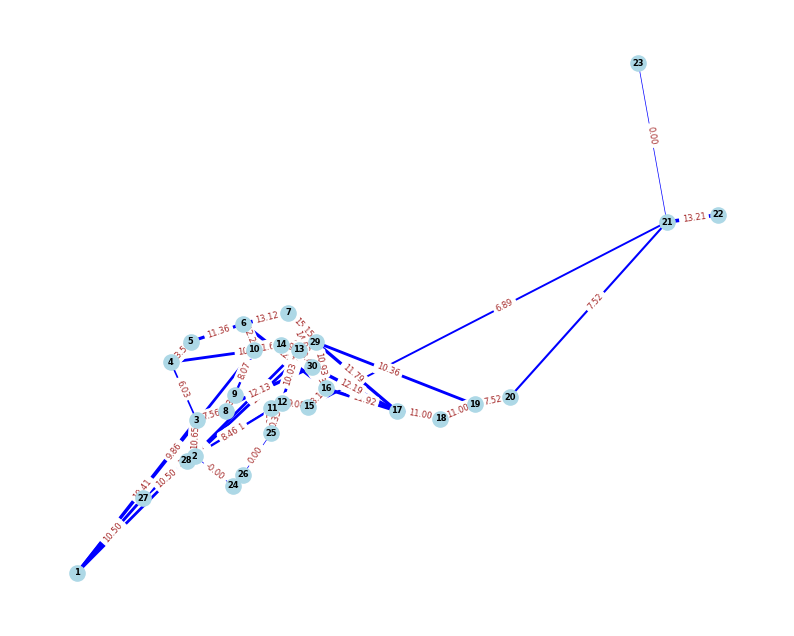

Iter 65: Obj=65023.8023, Best=49947.7013, Tabu=57


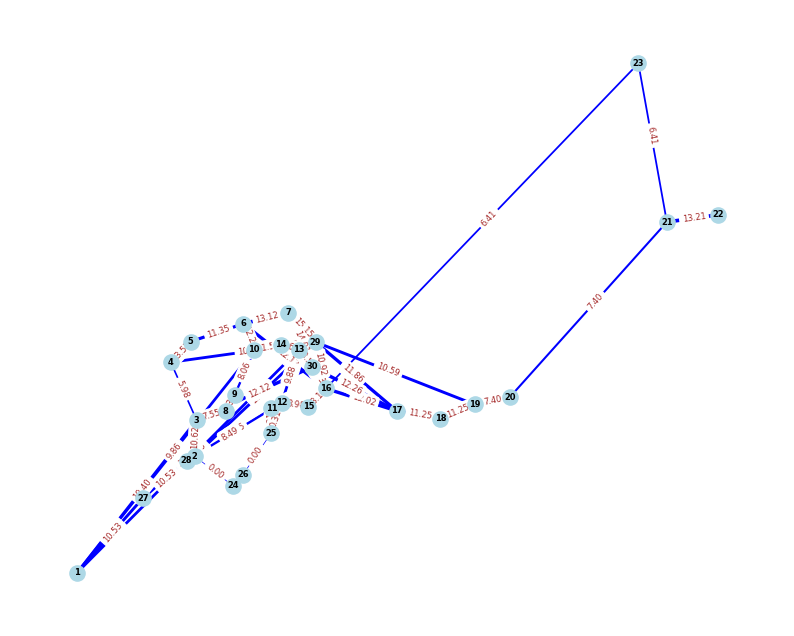

Iter 66: Obj=65808.1189, Best=49947.7013, Tabu=58


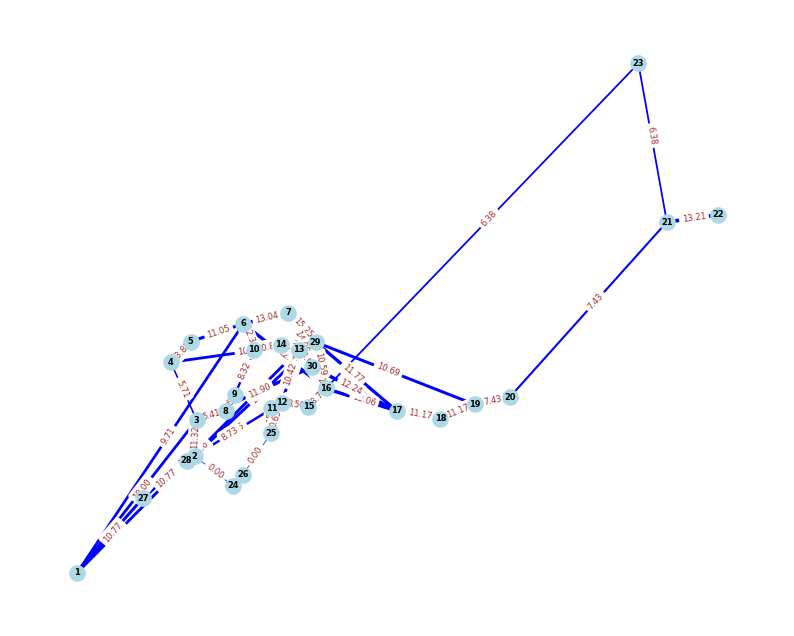

Iter 67: Obj=63259.9538, Best=49947.7013, Tabu=59


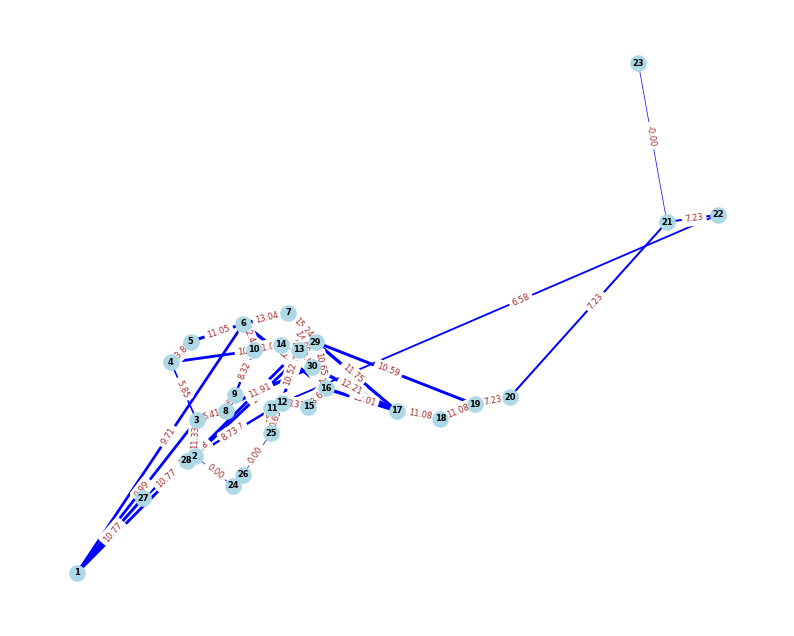

Iter 68: Obj=59878.1833, Best=49947.7013, Tabu=60


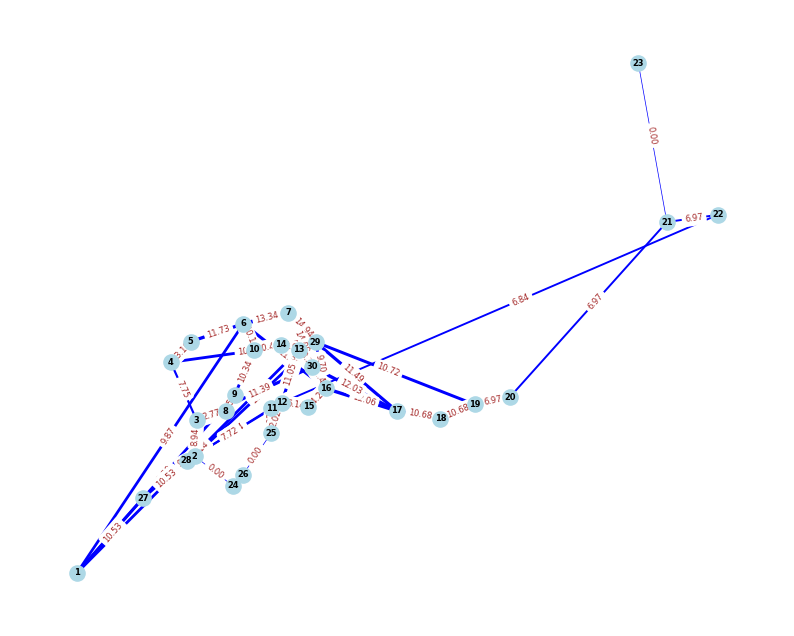

Iter 69: Obj=60905.6386, Best=49947.7013, Tabu=61


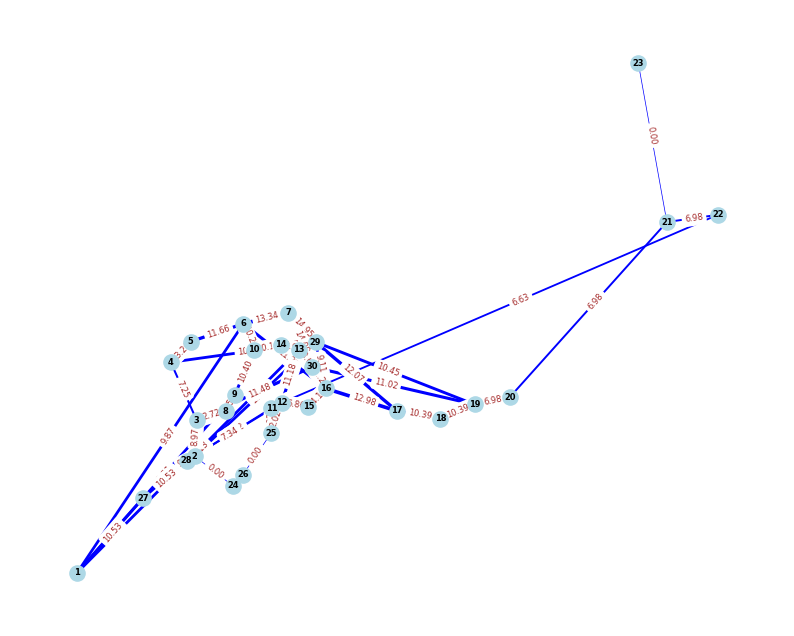

Iter 70: Obj=61004.0784, Best=49947.7013, Tabu=62


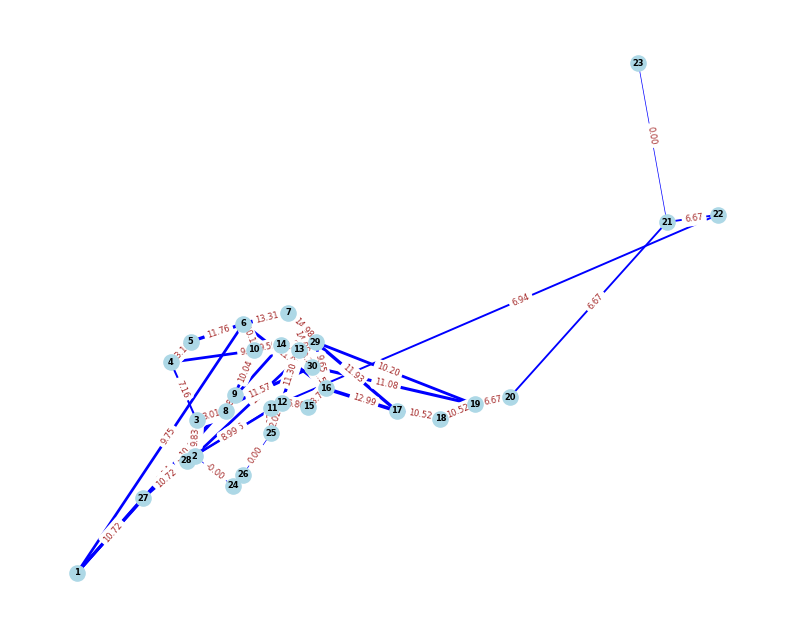

Iter 71: Obj=64181.2848, Best=49947.7013, Tabu=63


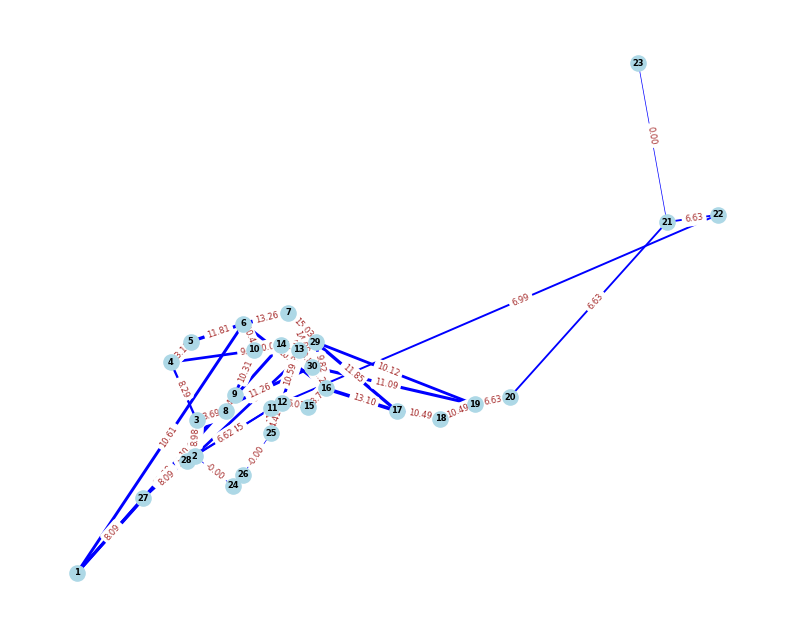

Iter 72: Obj=61725.6597, Best=49947.7013, Tabu=64


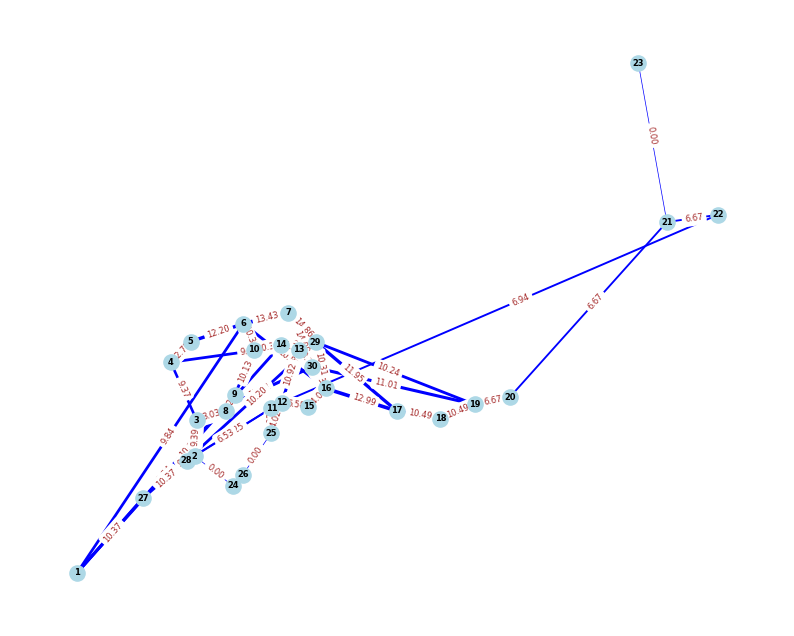

Iter 73: Obj=61223.2982, Best=49947.7013, Tabu=64


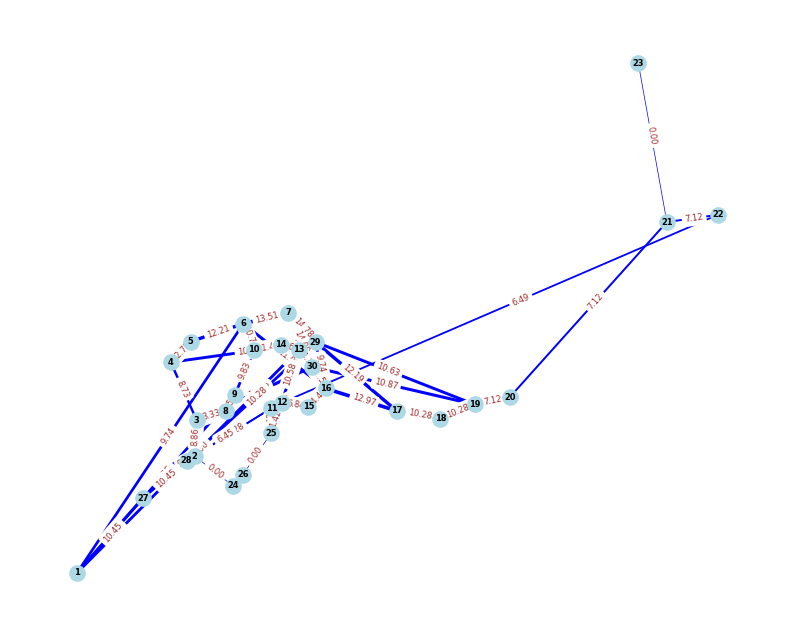

Iter 74: Obj=62938.1559, Best=49947.7013, Tabu=65


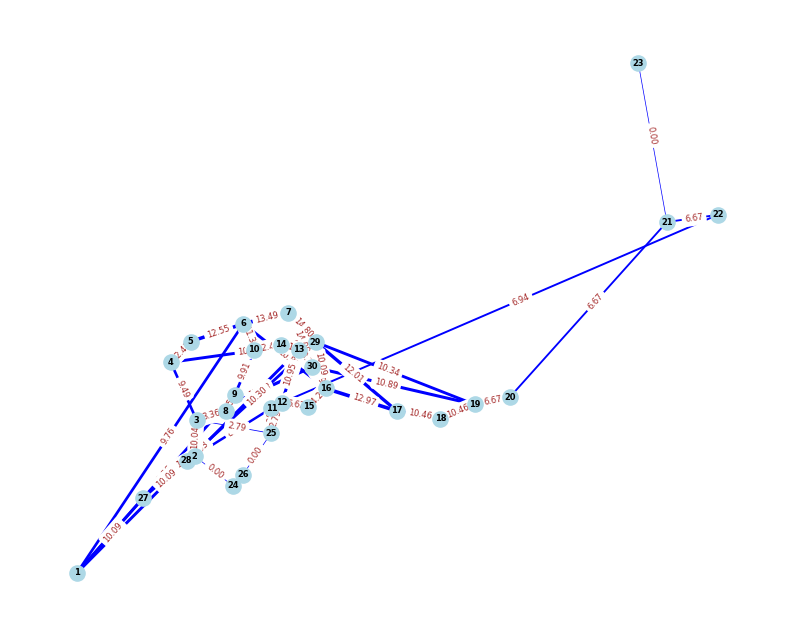

Iter 75: Obj=60948.2061, Best=49947.7013, Tabu=66


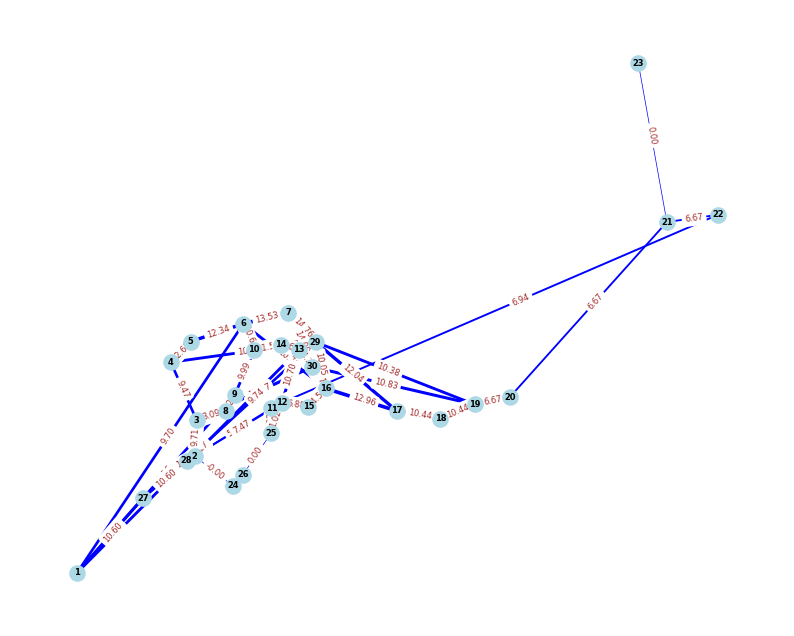

Iter 76: Obj=60723.2769, Best=49947.7013, Tabu=66


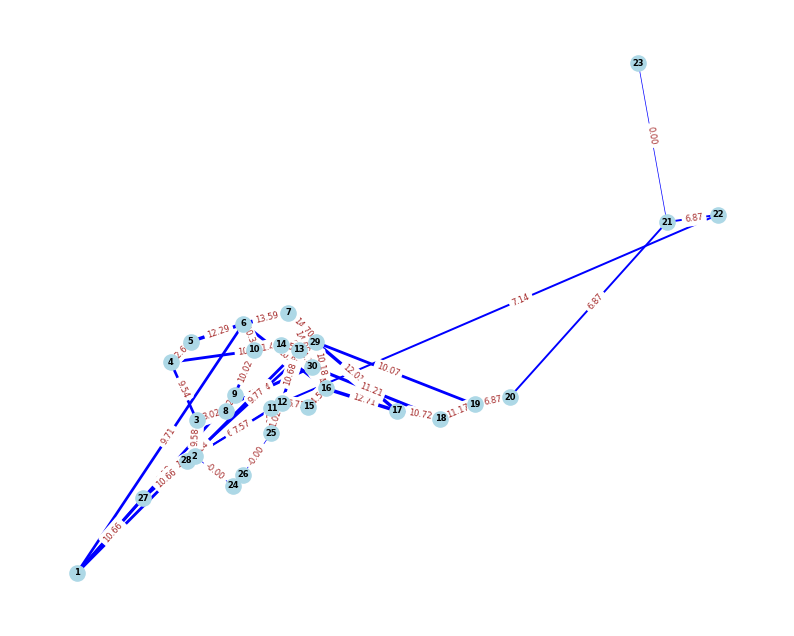

Iter 77: Obj=62784.8228, Best=49947.7013, Tabu=67


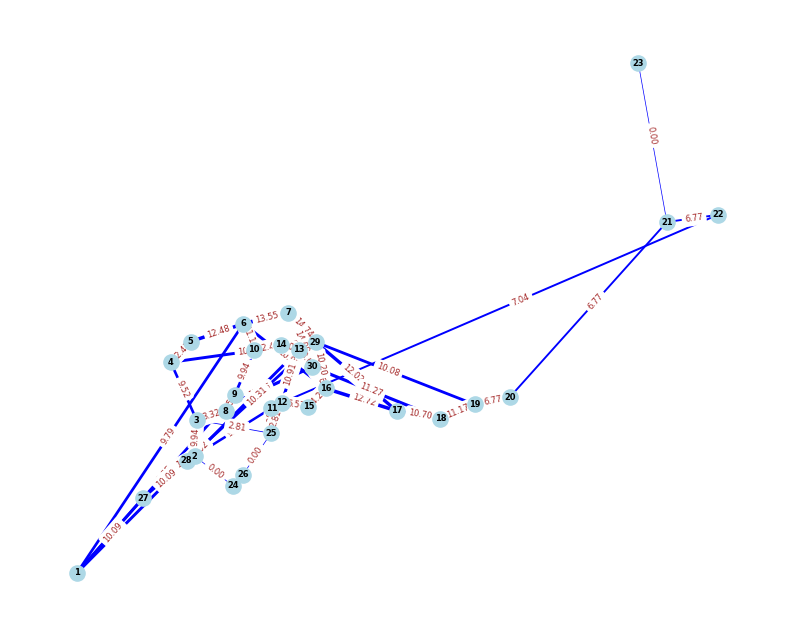

Iter 78: Obj=64361.1069, Best=49947.7013, Tabu=68


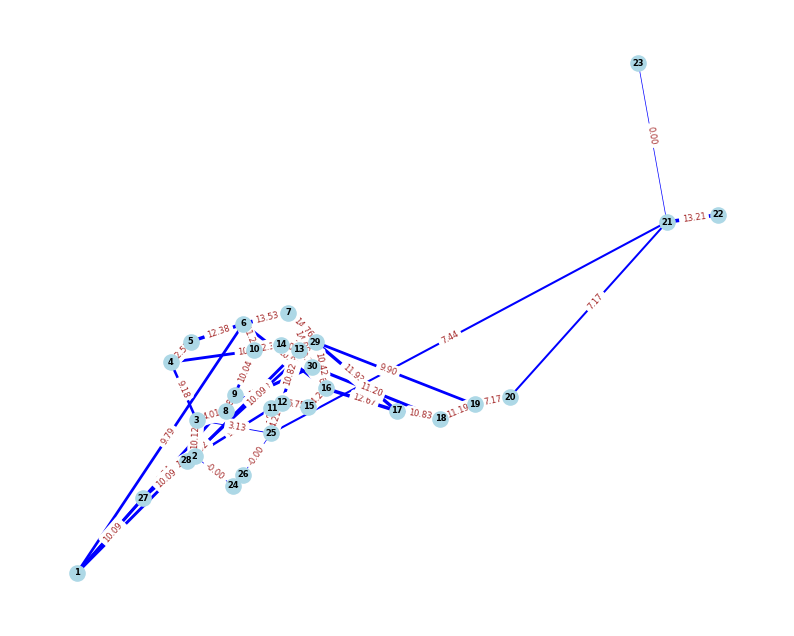

Iter 79: Obj=67338.0766, Best=49947.7013, Tabu=69


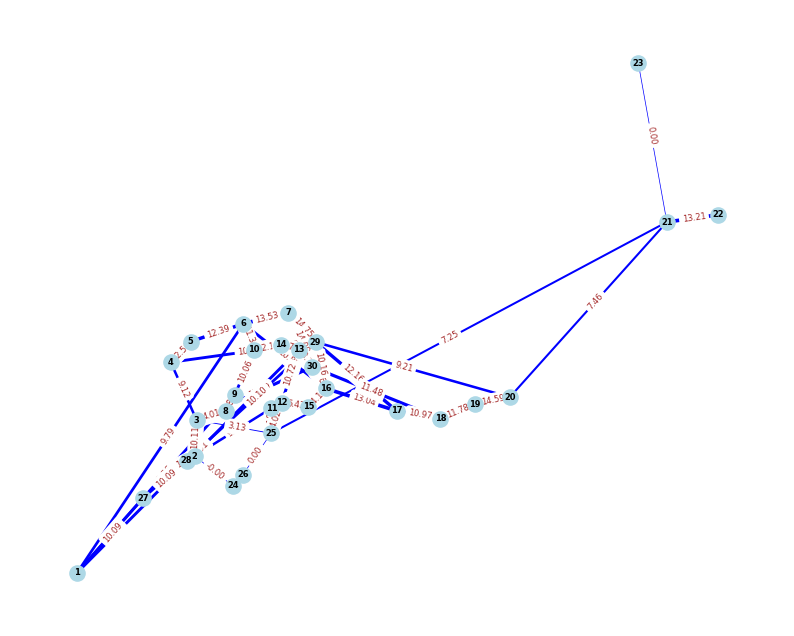

Iter 80: Obj=65679.2525, Best=49947.7013, Tabu=70


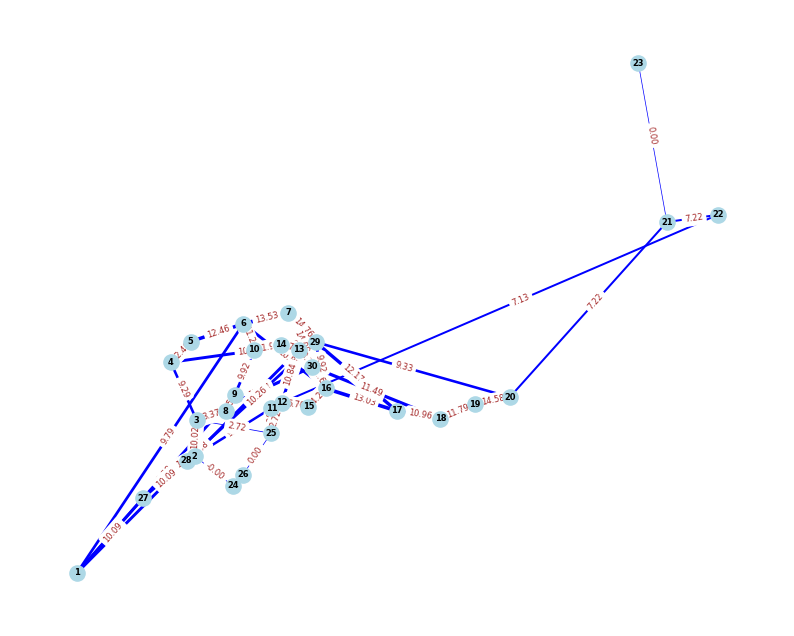

Iter 81: Obj=64071.3892, Best=49947.7013, Tabu=71


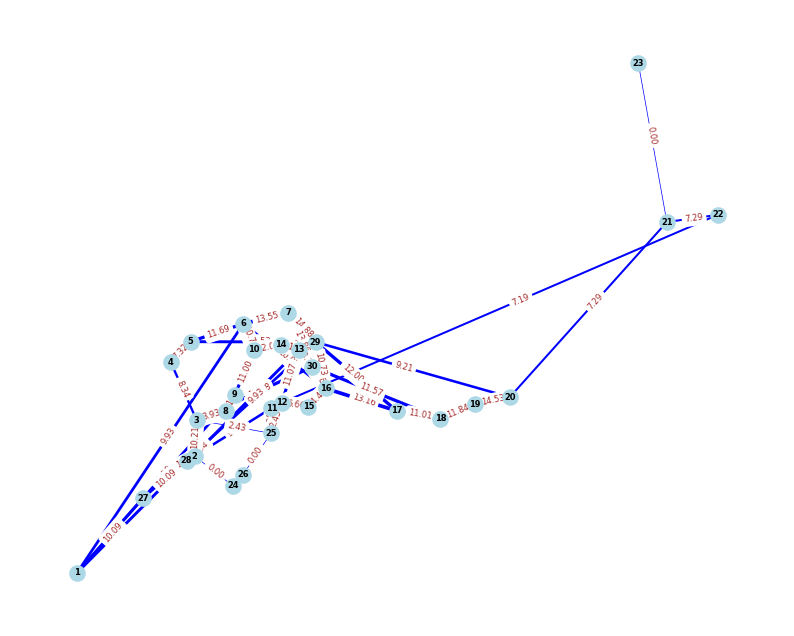

Iter 82: Obj=64129.8316, Best=49947.7013, Tabu=72


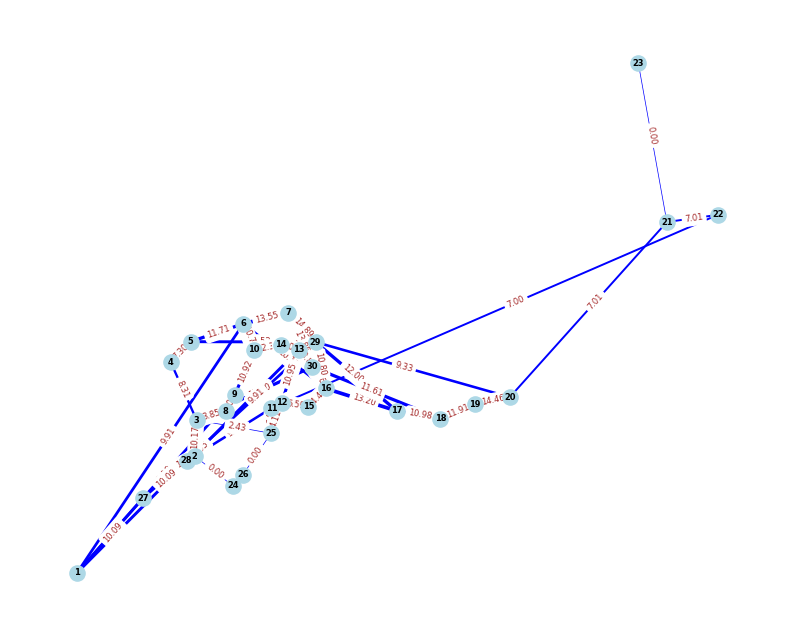

Iter 83: Obj=66489.9511, Best=49947.7013, Tabu=73


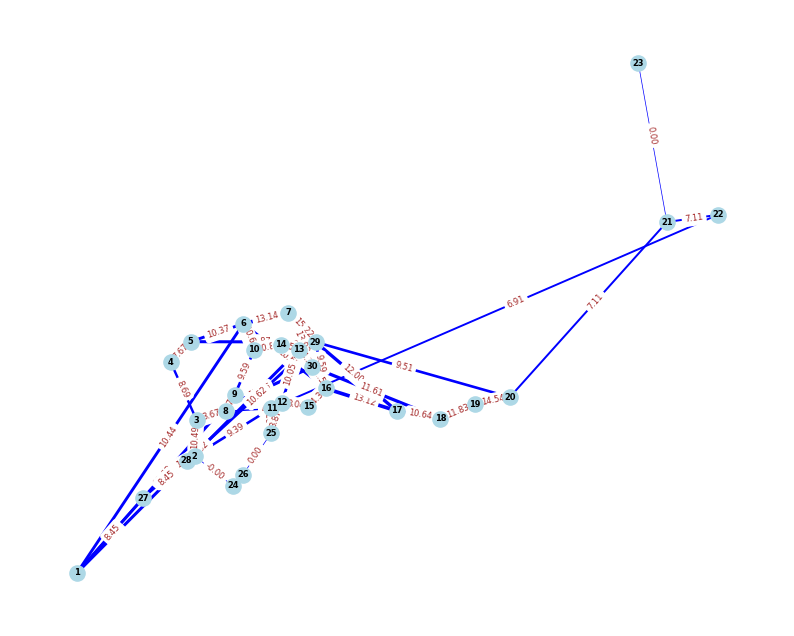

Iter 84: Obj=68747.2339, Best=49947.7013, Tabu=74


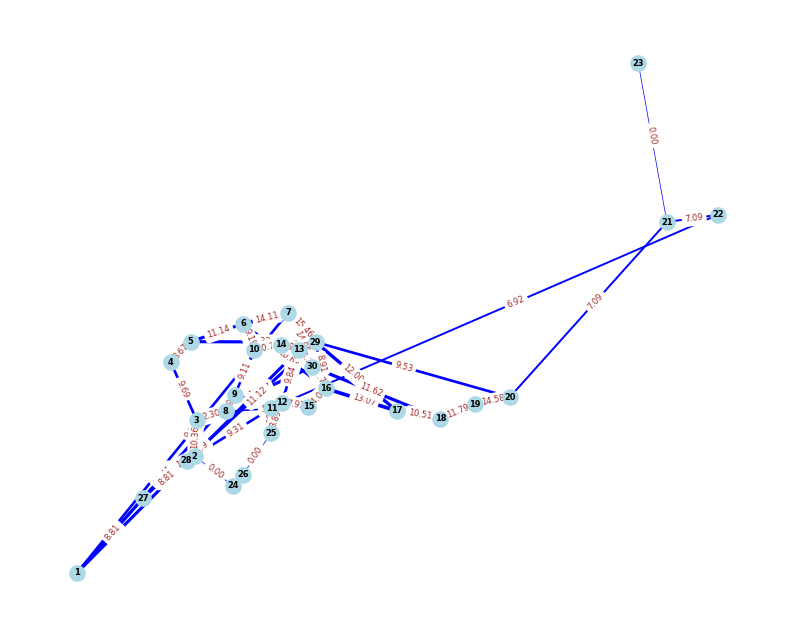

Iter 85: Obj=67069.5819, Best=49947.7013, Tabu=75


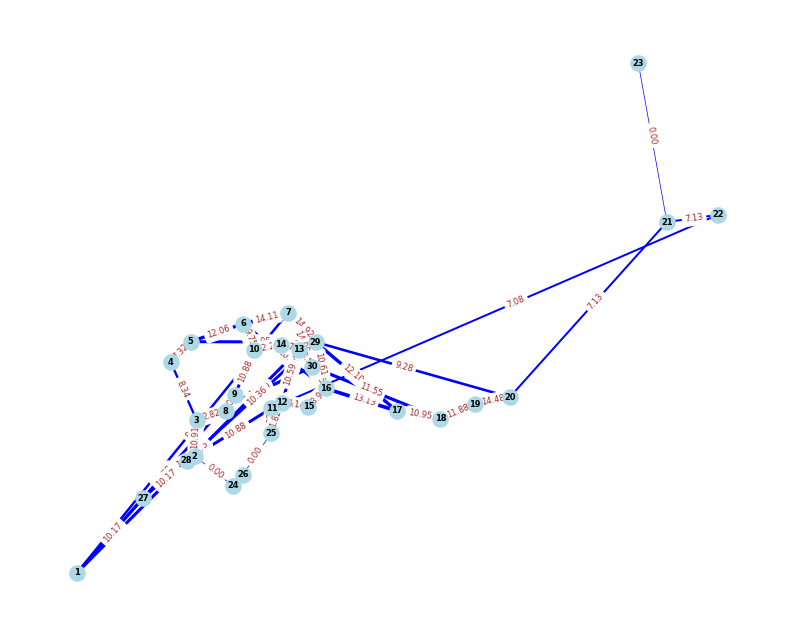

Iter 86: Obj=64484.6977, Best=49947.7013, Tabu=76


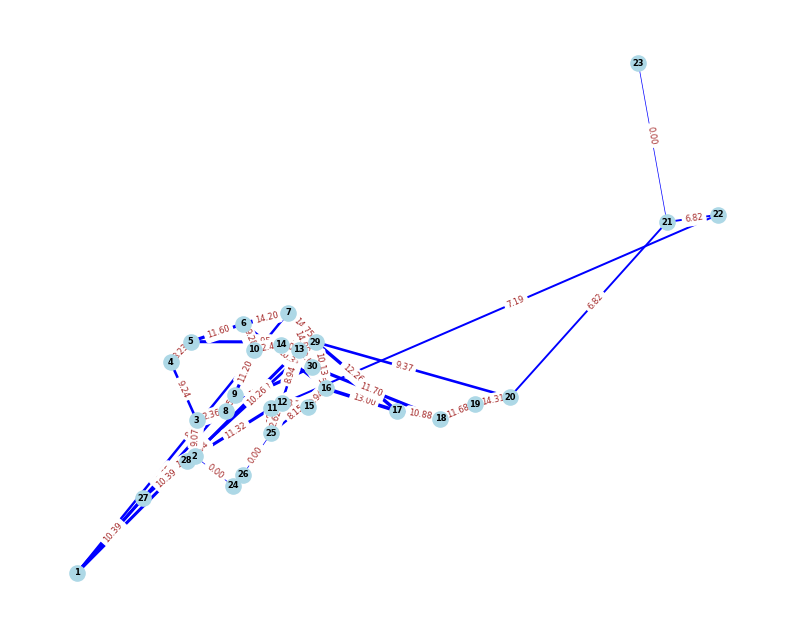

Iter 87: Obj=66474.3874, Best=49947.7013, Tabu=77


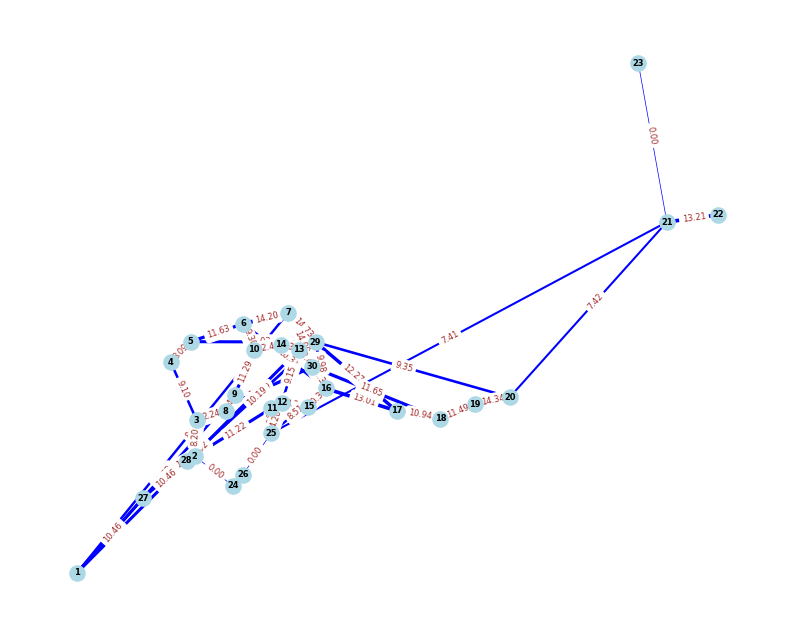

Iter 88: Obj=69435.0565, Best=49947.7013, Tabu=78


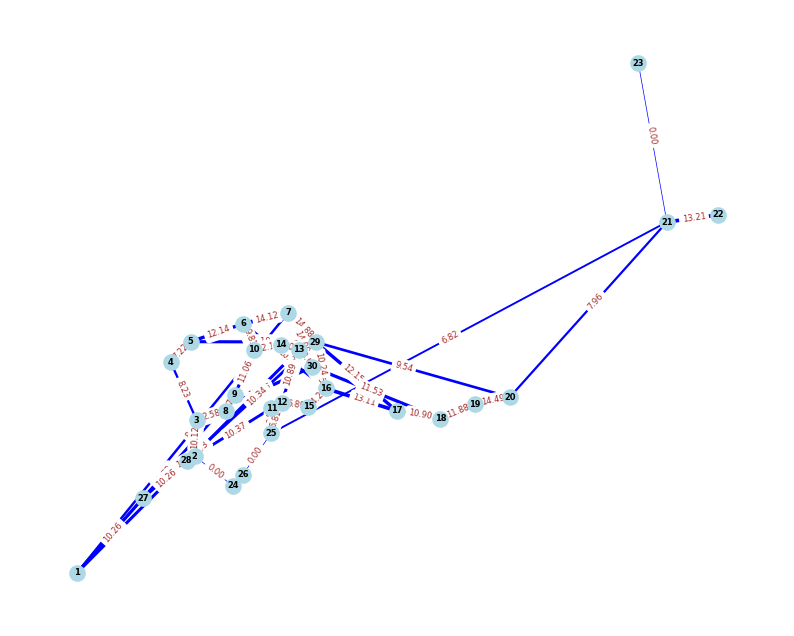

Iter 89: Obj=69435.0565, Best=49947.7013, Tabu=79


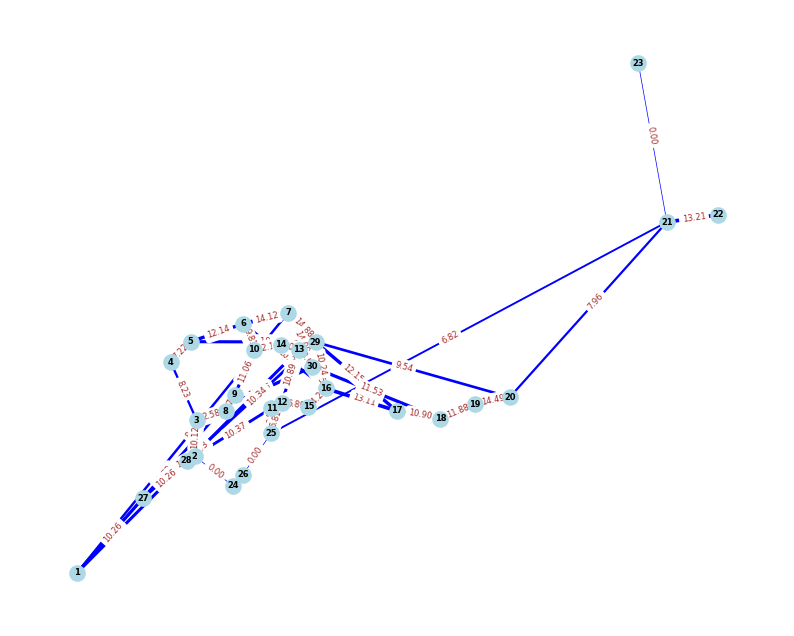

Iter 90: Obj=69435.0565, Best=49947.7013, Tabu=80


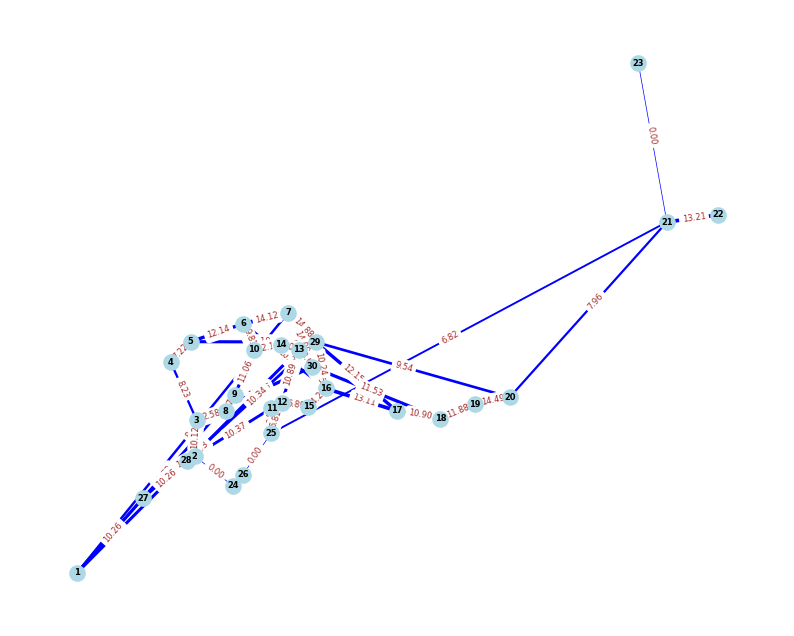

Iter 91: Obj=69435.0565, Best=49947.7013, Tabu=81


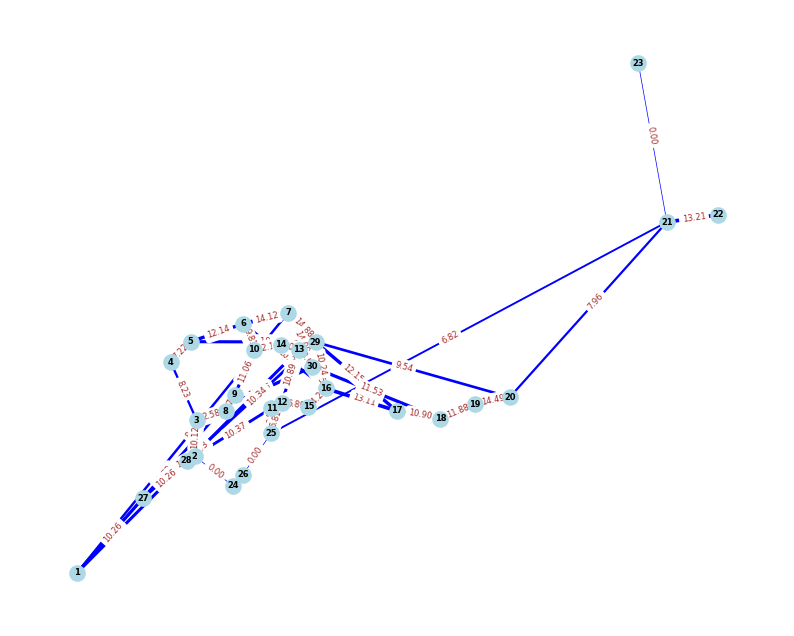

Iter 92: Obj=66225.4150, Best=49947.7013, Tabu=82


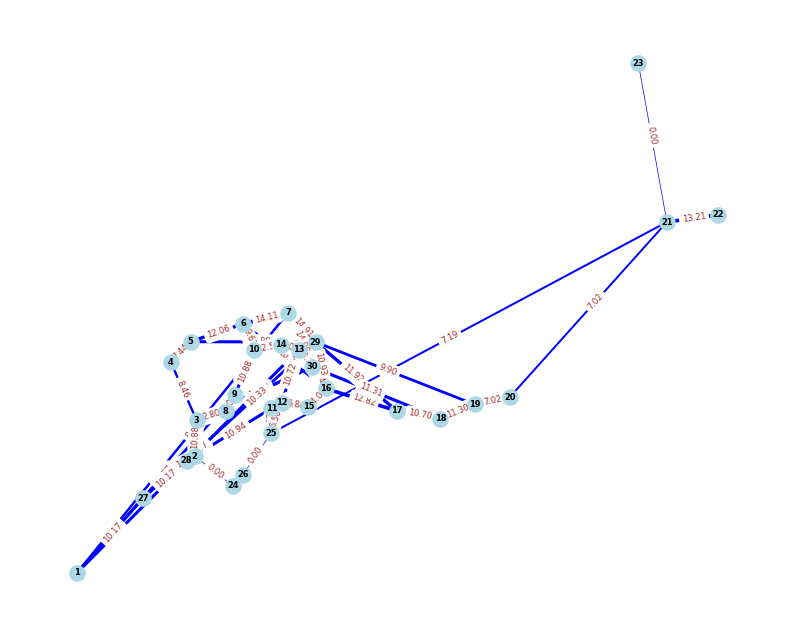

Iter 93: Obj=66116.6841, Best=49947.7013, Tabu=83


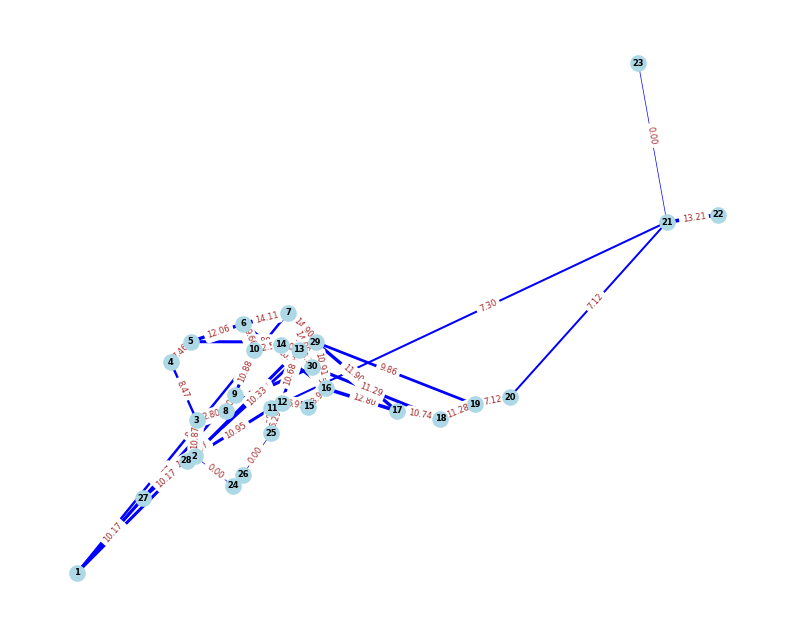

Iter 94: Obj=65551.0605, Best=49947.7013, Tabu=84


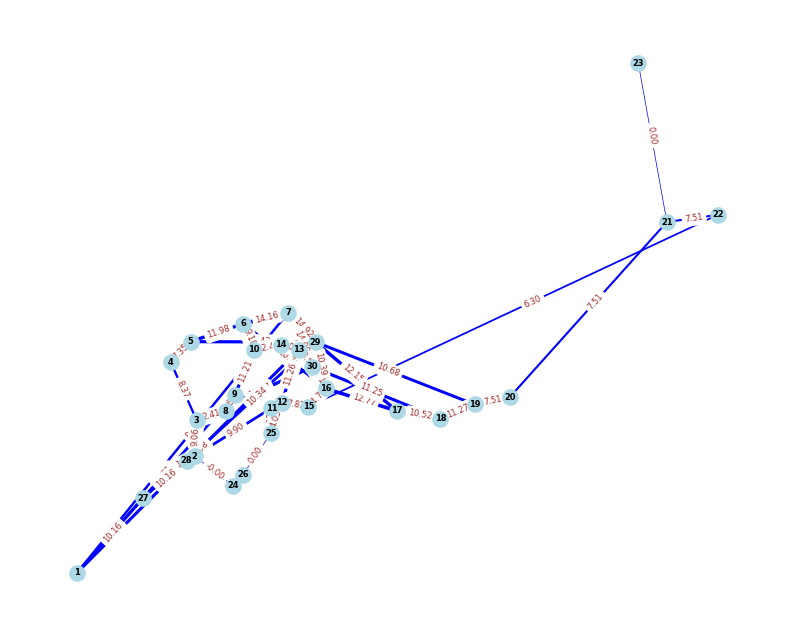

Iter 95: Obj=66772.9398, Best=49947.7013, Tabu=85


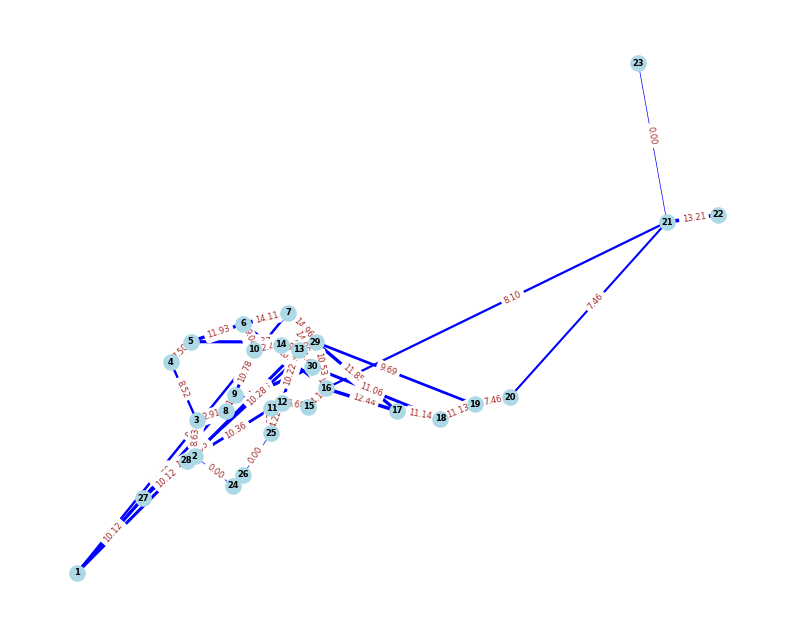

Iter 96: Obj=66773.8534, Best=49947.7013, Tabu=86


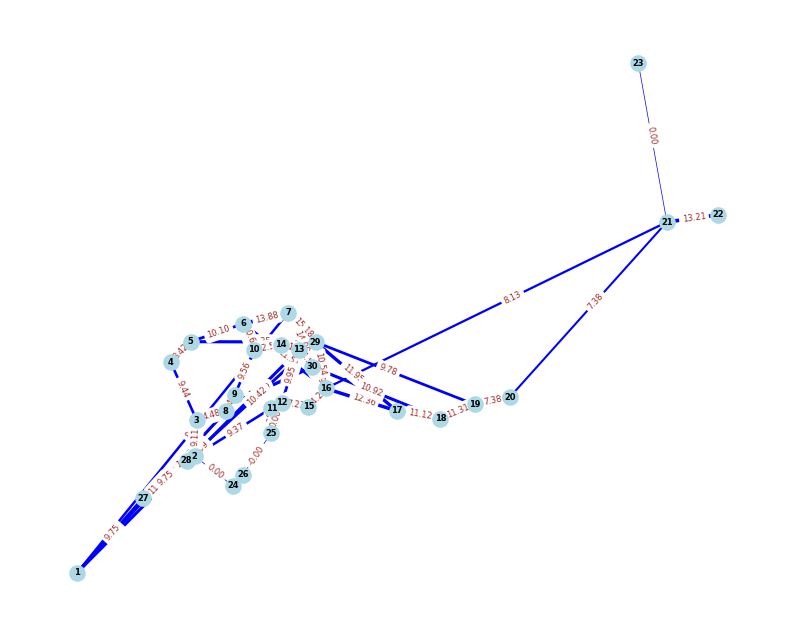

Iter 97: Obj=67100.9893, Best=49947.7013, Tabu=87


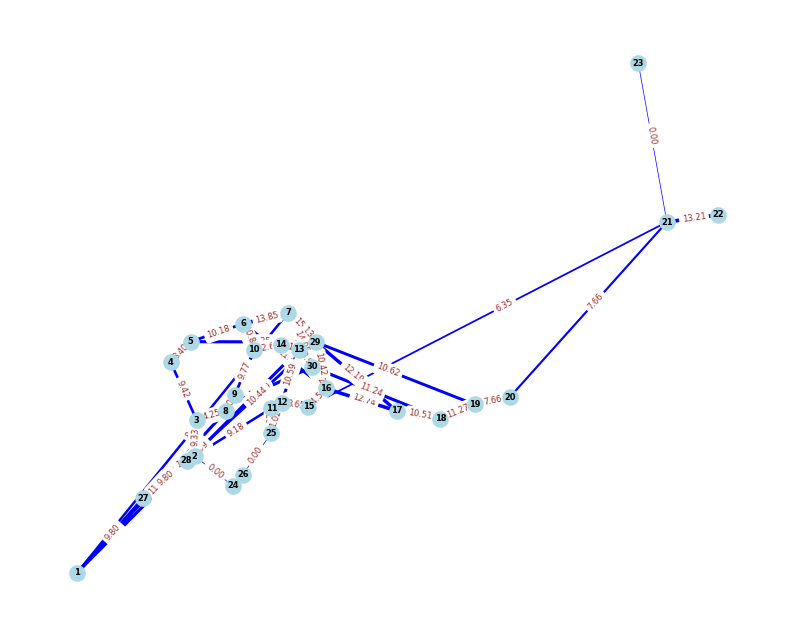

Iter 98: Obj=66982.7560, Best=49947.7013, Tabu=88


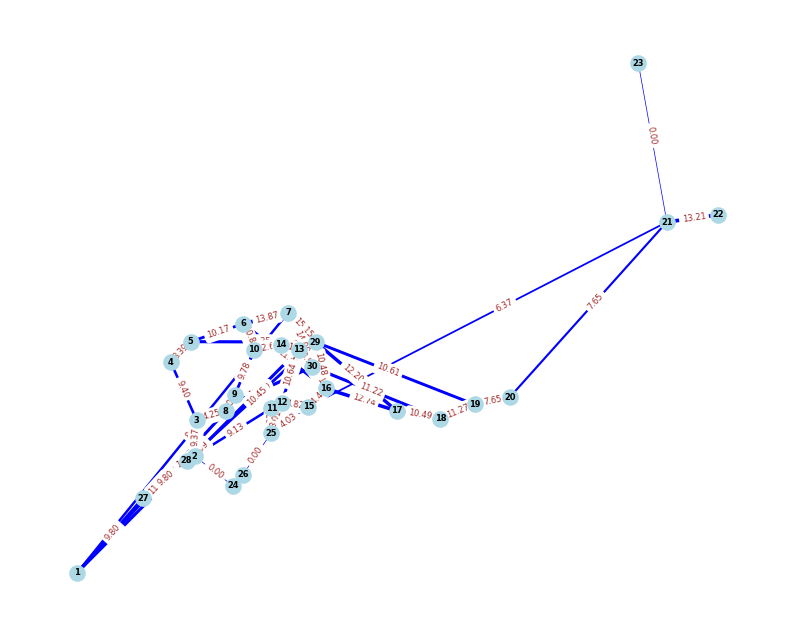

Iter 99: Obj=66509.6756, Best=49947.7013, Tabu=89


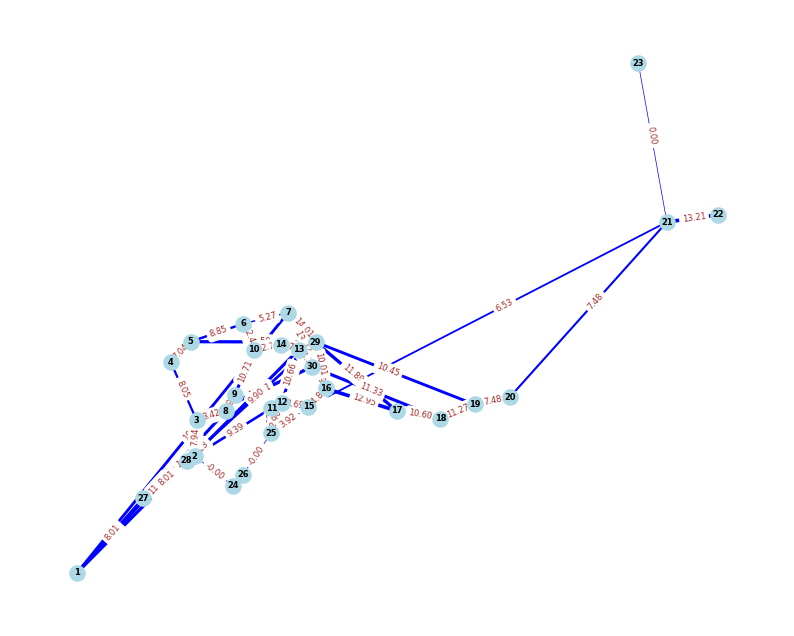

Iter 100: Obj=64179.4918, Best=49947.7013, Tabu=90


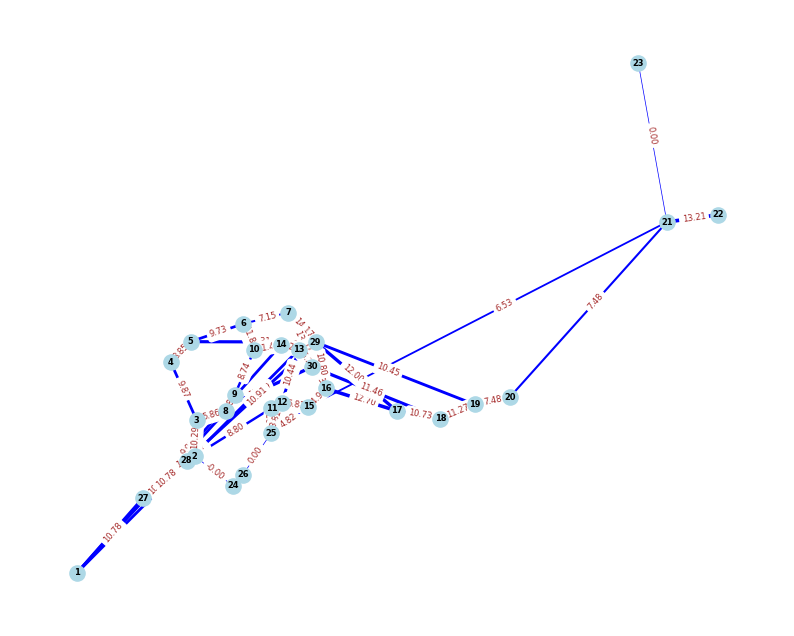

Iter 101: Obj=59074.2781, Best=49947.7013, Tabu=91


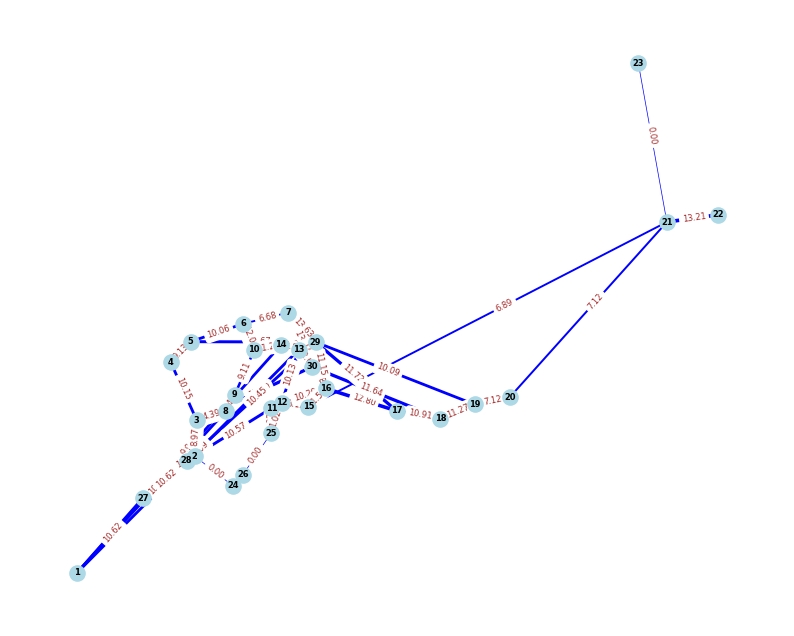

Iter 102: Obj=58746.9824, Best=49947.7013, Tabu=92


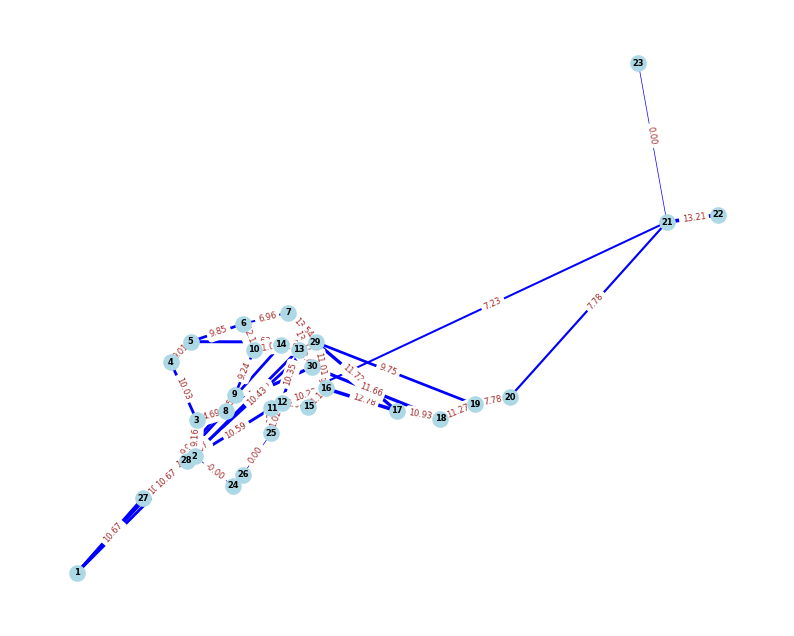

Iter 103: Obj=57156.7285, Best=49947.7013, Tabu=93


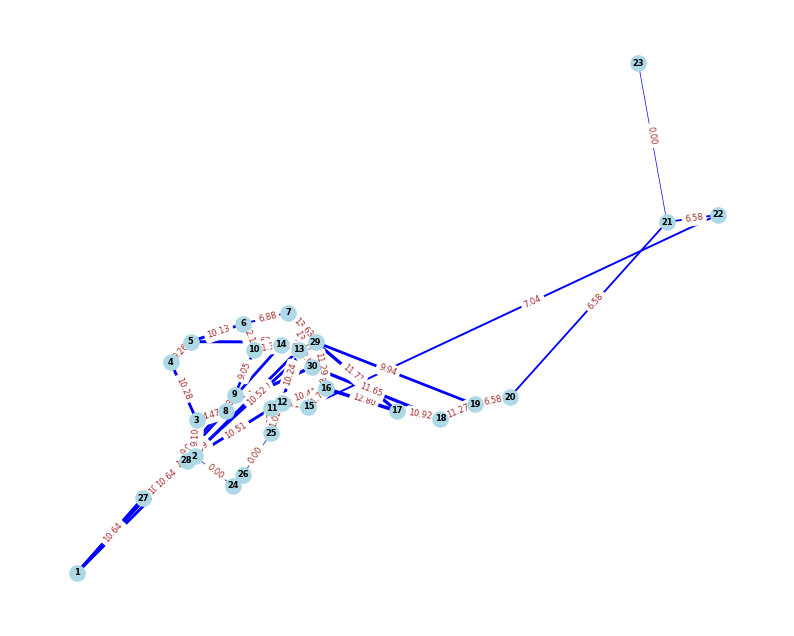

Iter 104: Obj=56182.3485, Best=49947.7013, Tabu=94


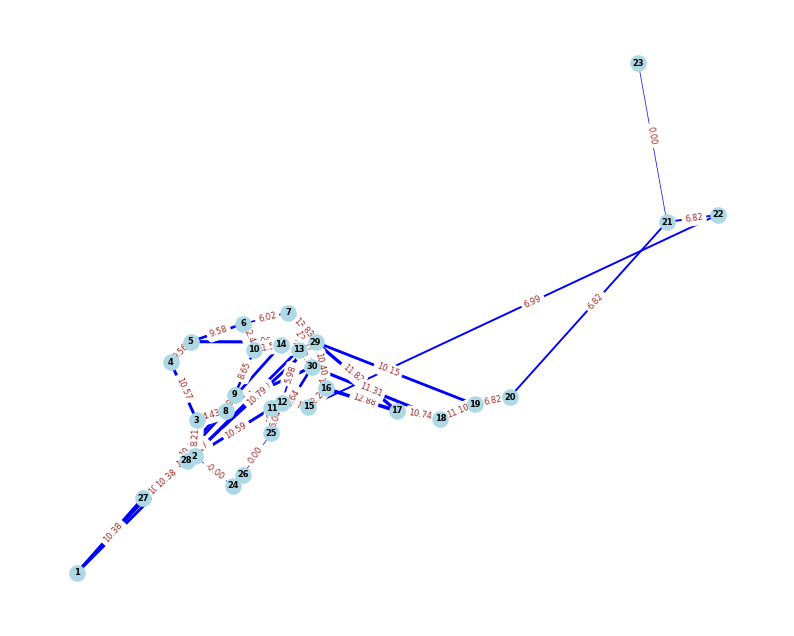

Iter 105: Obj=58821.4020, Best=49947.7013, Tabu=95


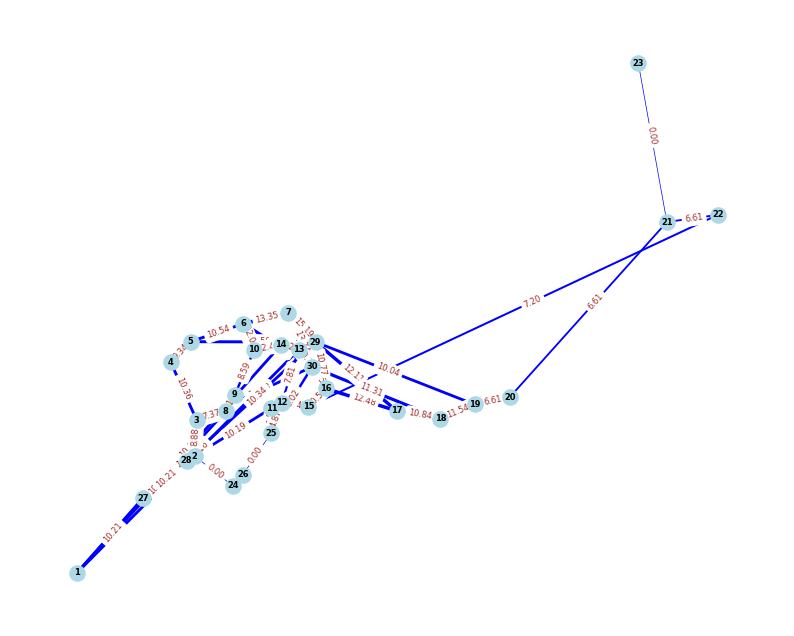

Iter 106: Obj=58420.6807, Best=49947.7013, Tabu=95


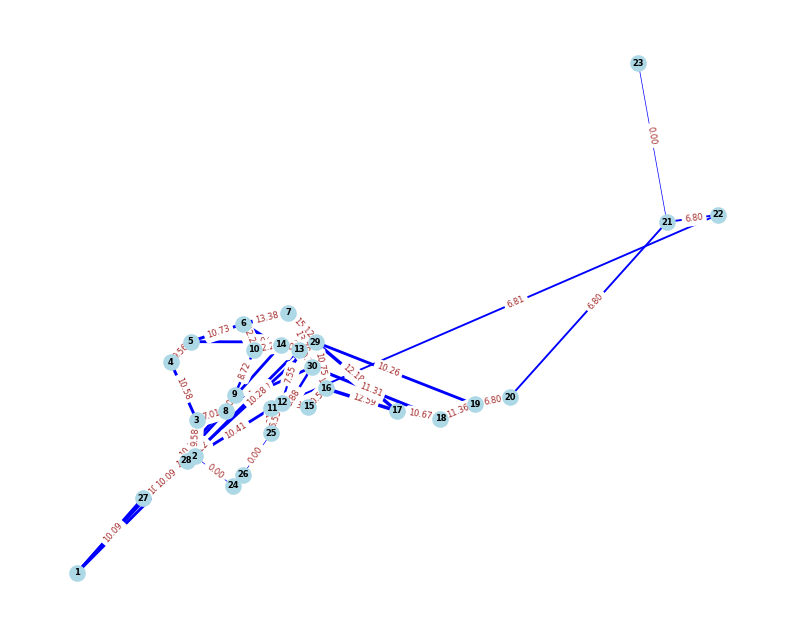

Iter 107: Obj=61846.0965, Best=49947.7013, Tabu=96


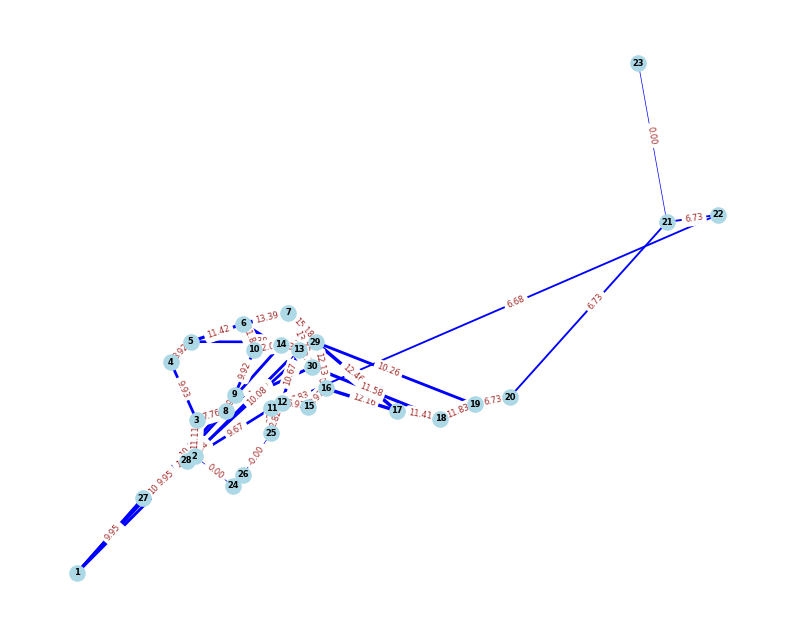

Iter 108: Obj=57156.5028, Best=49947.7013, Tabu=97


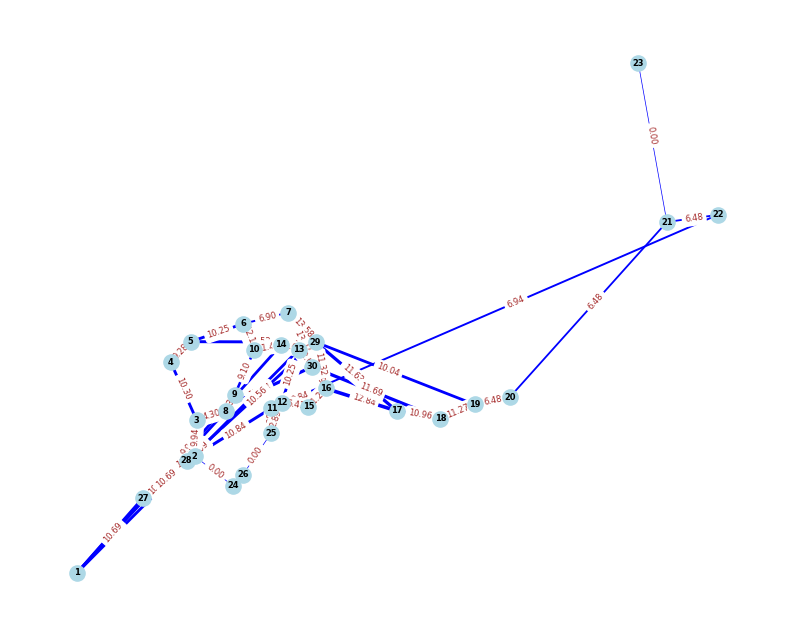

Iter 109: Obj=58812.0524, Best=49947.7013, Tabu=97


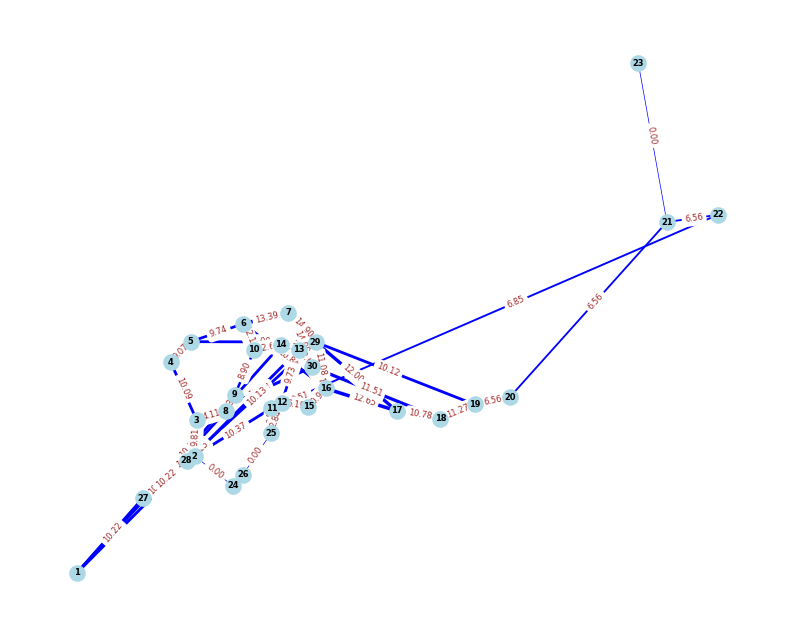

Iter 110: Obj=56012.6626, Best=49947.7013, Tabu=98


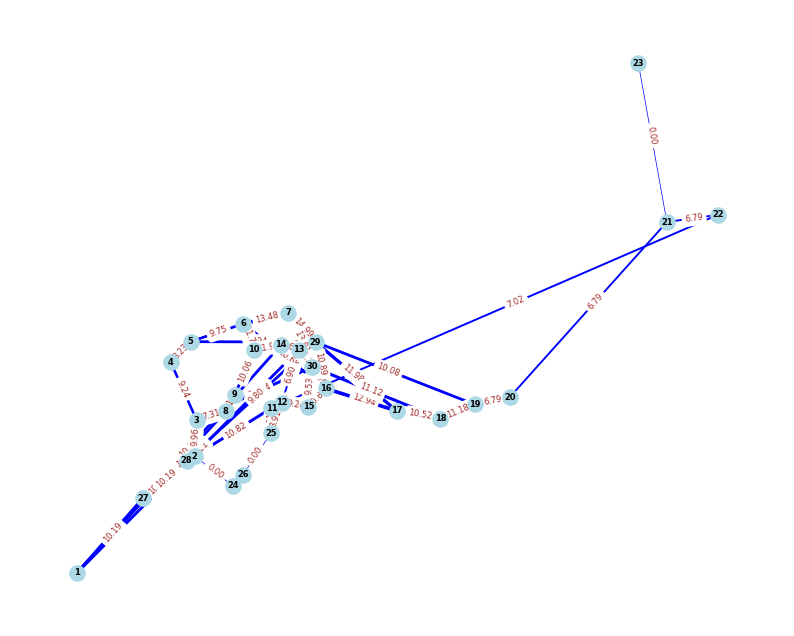

Iter 111: Obj=56967.8021, Best=49947.7013, Tabu=98


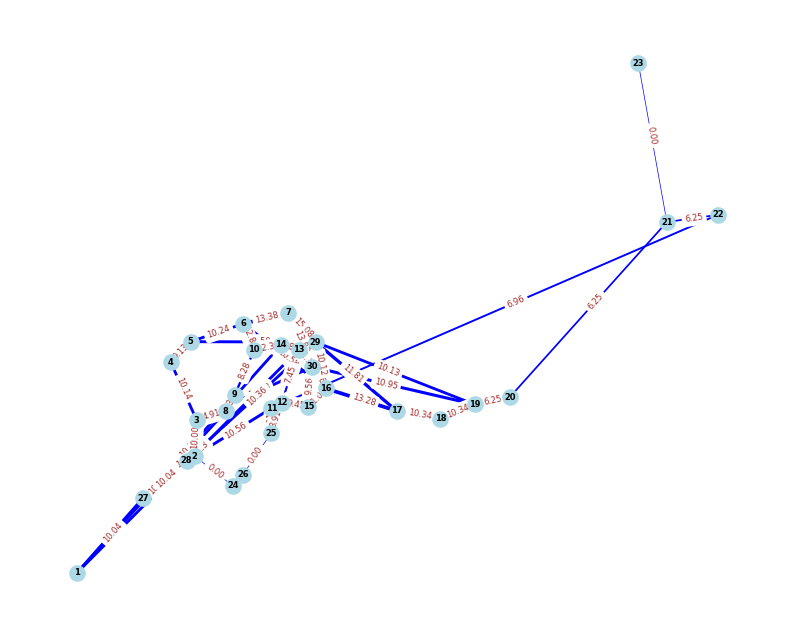

Iter 112: Obj=56193.5847, Best=49947.7013, Tabu=99


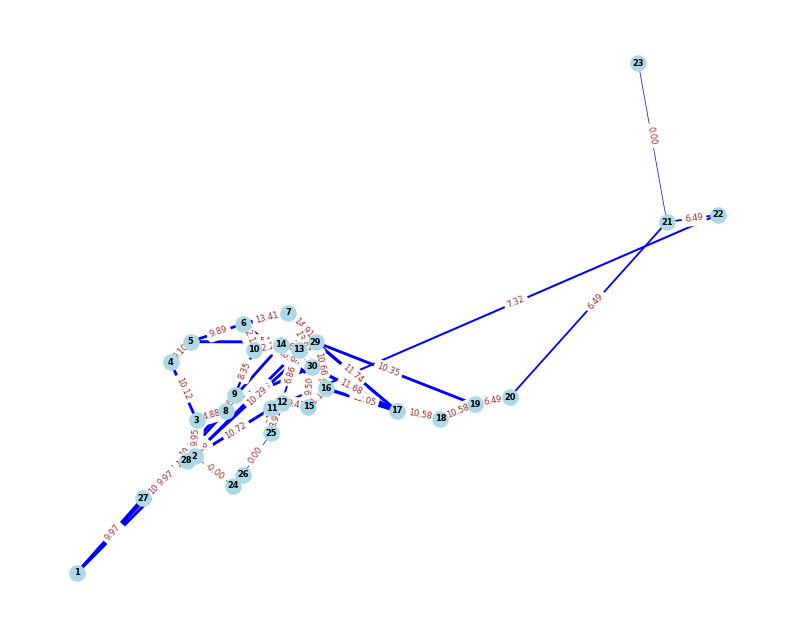

Iter 113: Obj=56105.9517, Best=49947.7013, Tabu=99


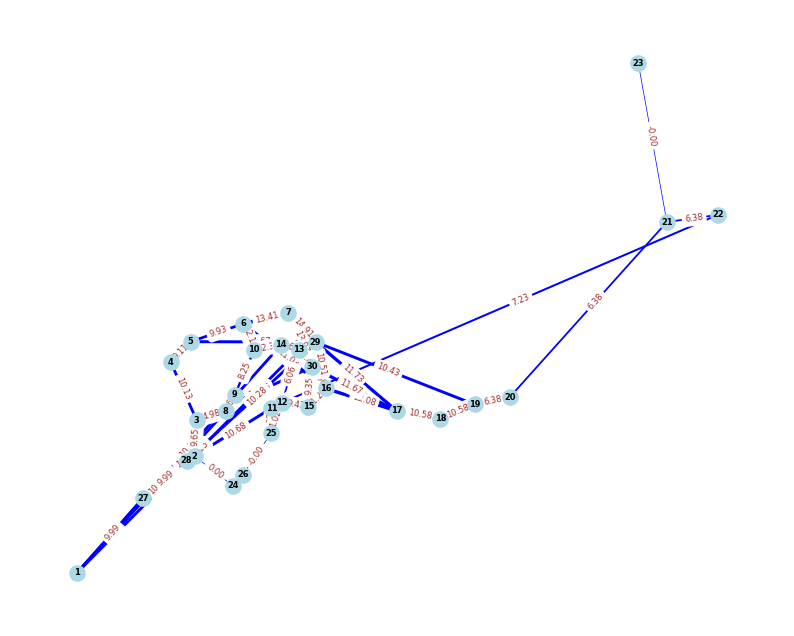

Iter 114: Obj=58886.9611, Best=49947.7013, Tabu=100


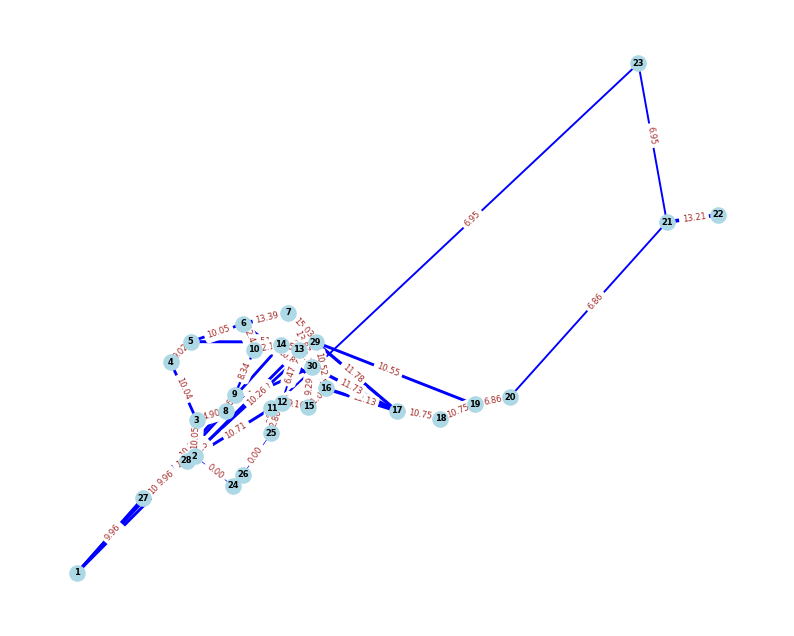

Iter 115: Obj=58941.2517, Best=49947.7013, Tabu=101


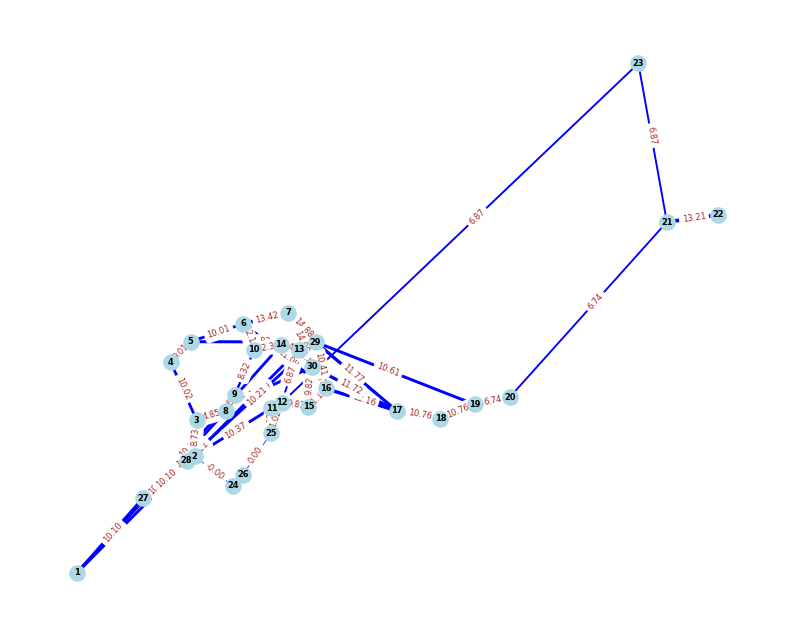

Iter 116: Obj=59998.7271, Best=49947.7013, Tabu=102


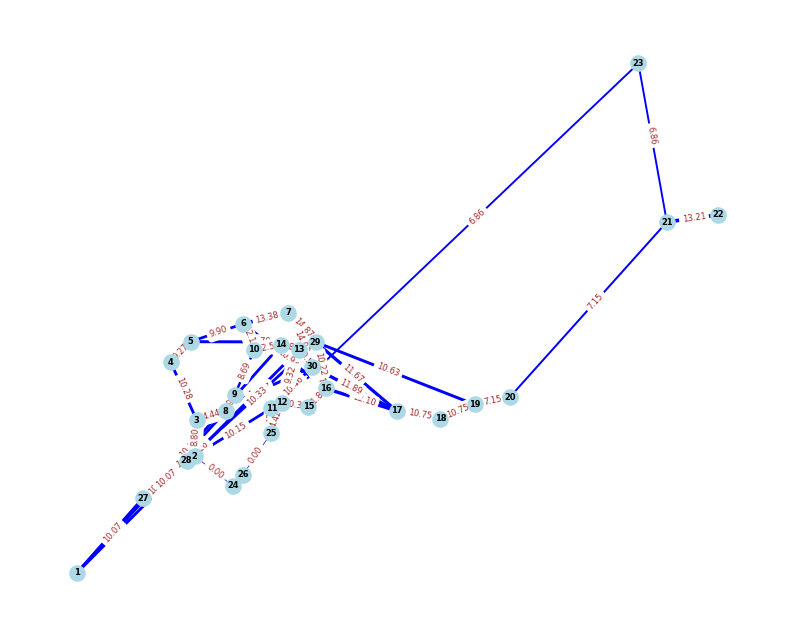

Iter 117: Obj=59729.7576, Best=49947.7013, Tabu=103


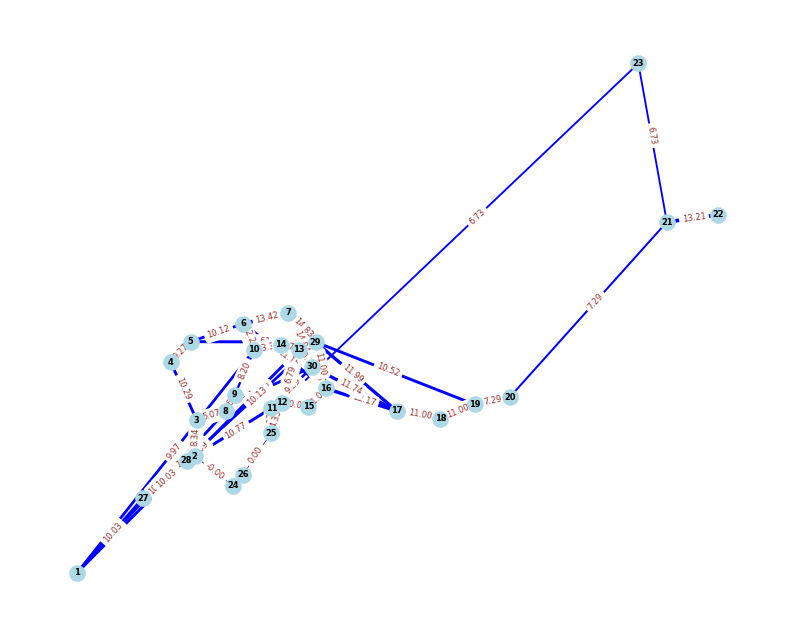

Iter 118: Obj=64800.3248, Best=49947.7013, Tabu=104


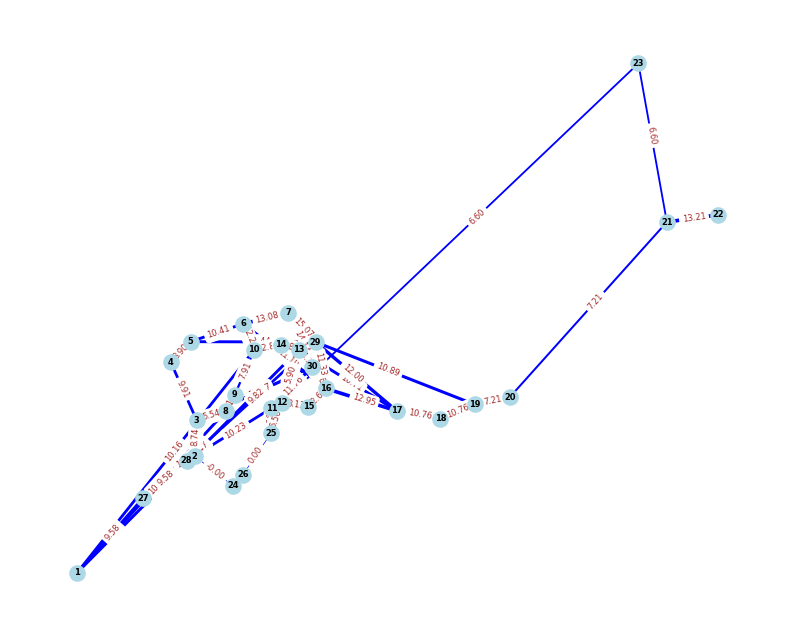

Iter 119: Obj=66458.8675, Best=49947.7013, Tabu=105


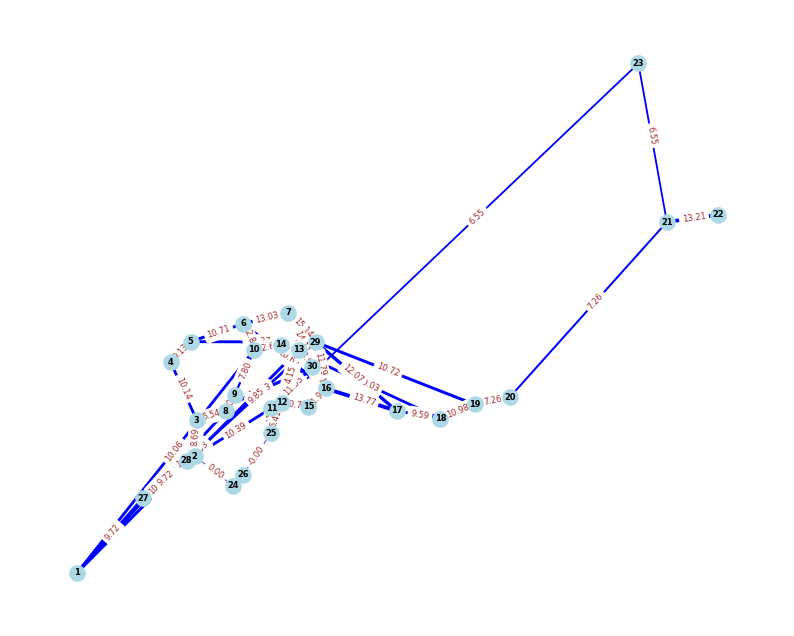

Iter 120: Obj=67173.9101, Best=49947.7013, Tabu=106


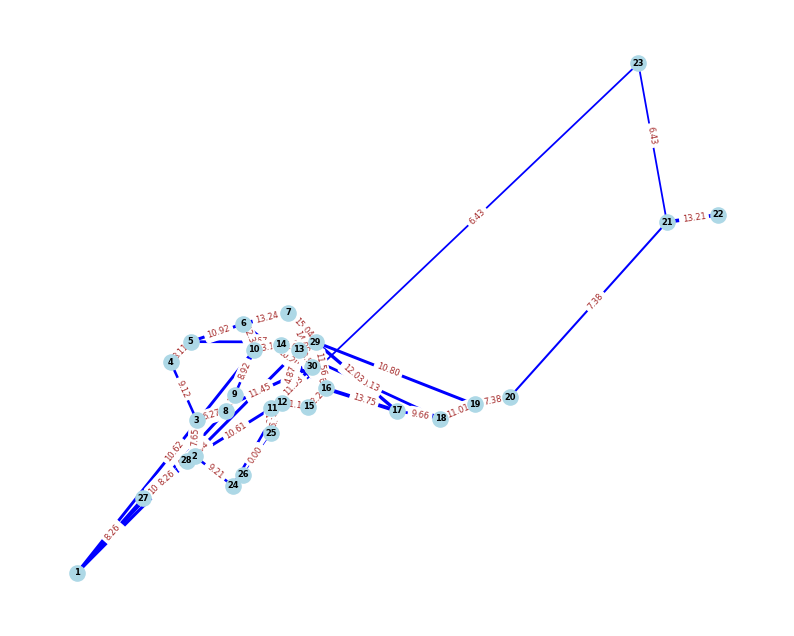

Iter 121: Obj=66458.8675, Best=49947.7013, Tabu=107


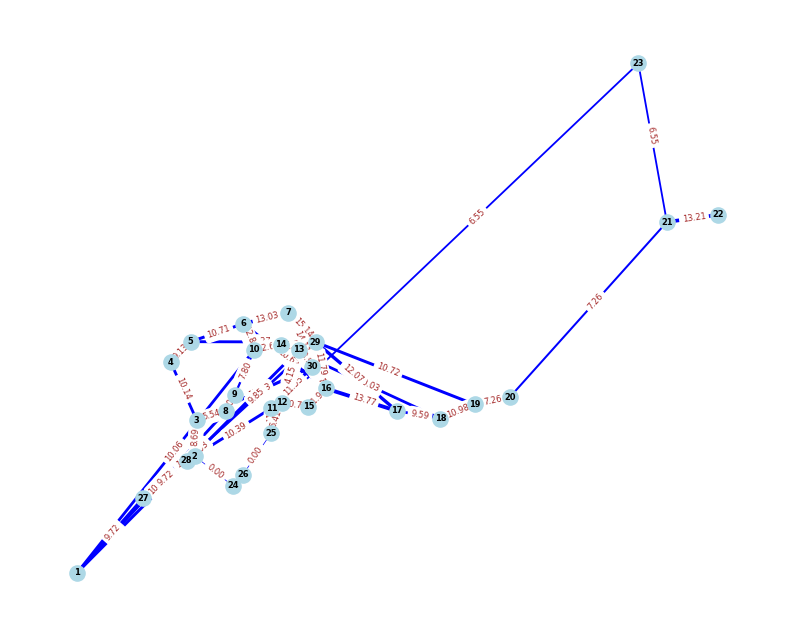

Iter 122: Obj=64034.0026, Best=49947.7013, Tabu=107


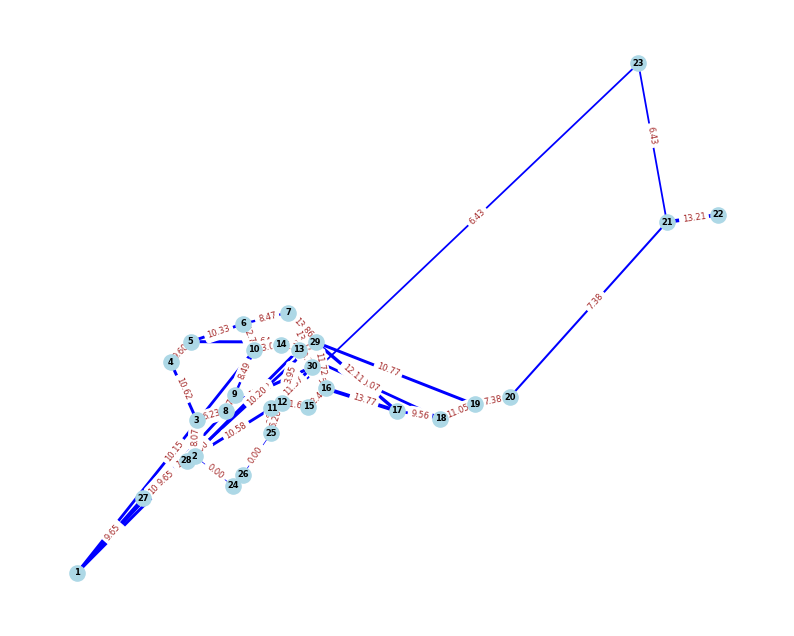

Iter 123: Obj=66348.5991, Best=49947.7013, Tabu=108


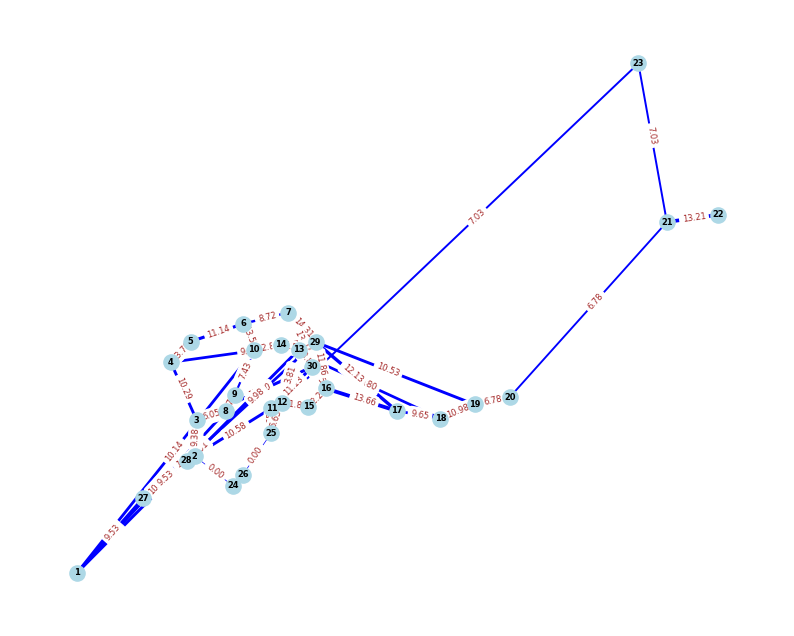

Iter 124: Obj=63976.9683, Best=49947.7013, Tabu=108


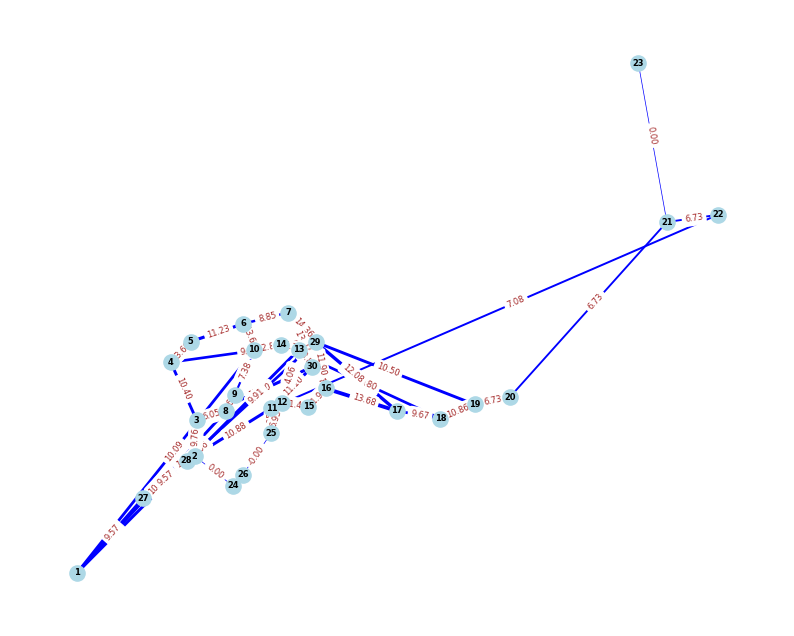

Iter 125: Obj=65592.4351, Best=49947.7013, Tabu=109


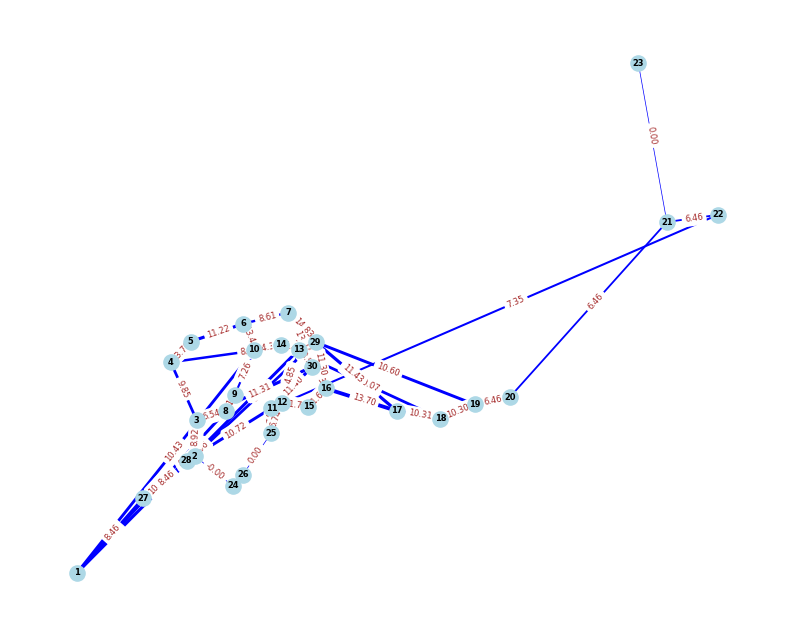

Iter 126: Obj=65137.0211, Best=49947.7013, Tabu=110


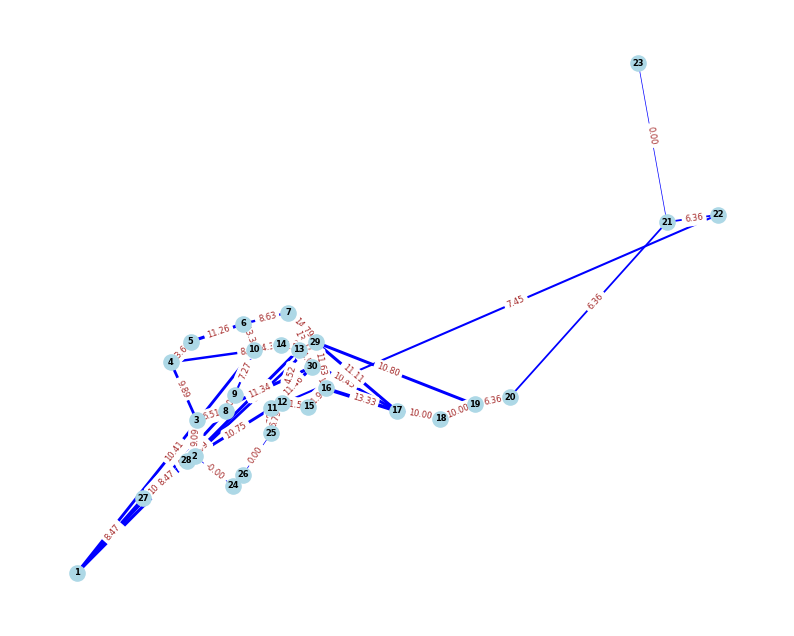

Iter 127: Obj=64601.7275, Best=49947.7013, Tabu=110


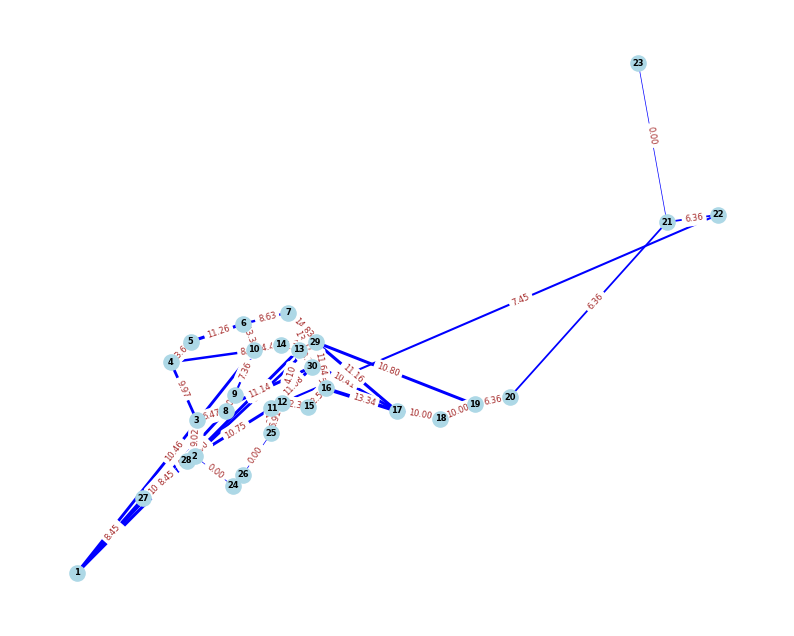

Iter 128: Obj=65137.0211, Best=49947.7013, Tabu=110


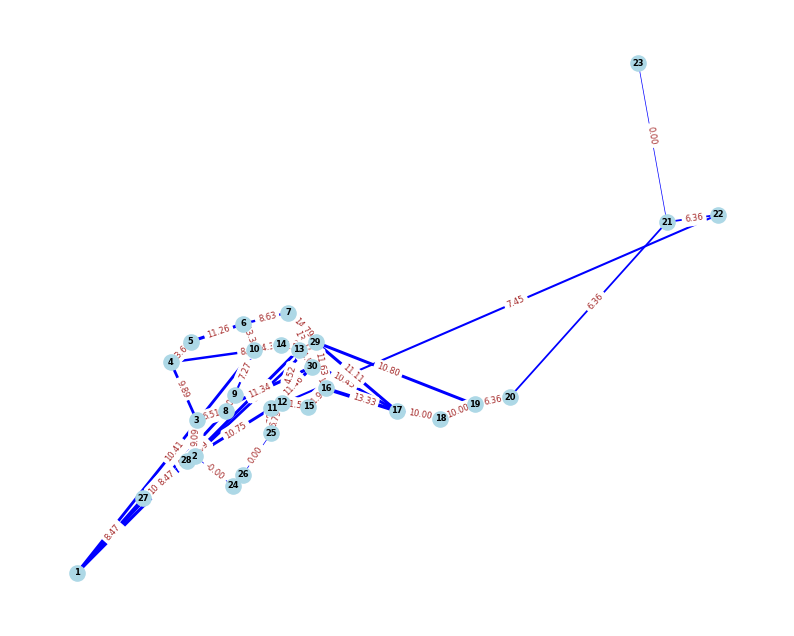

Iter 129: Obj=64097.1078, Best=49947.7013, Tabu=111


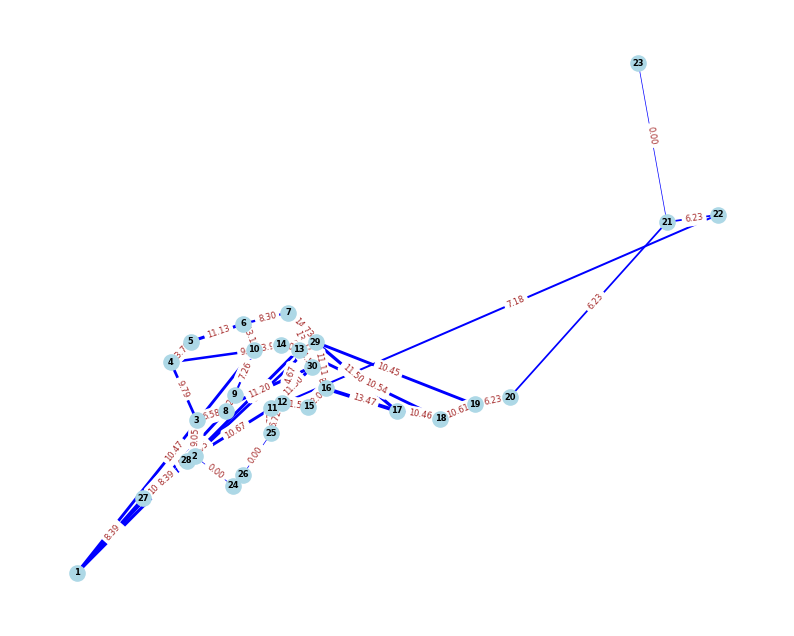

Iter 130: Obj=63995.1131, Best=49947.7013, Tabu=111


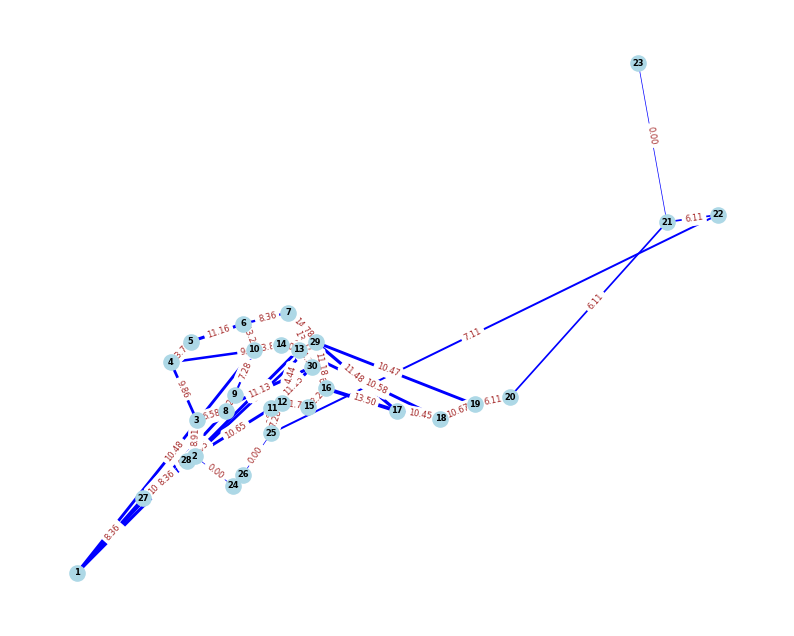

Iter 131: Obj=64501.6242, Best=49947.7013, Tabu=112


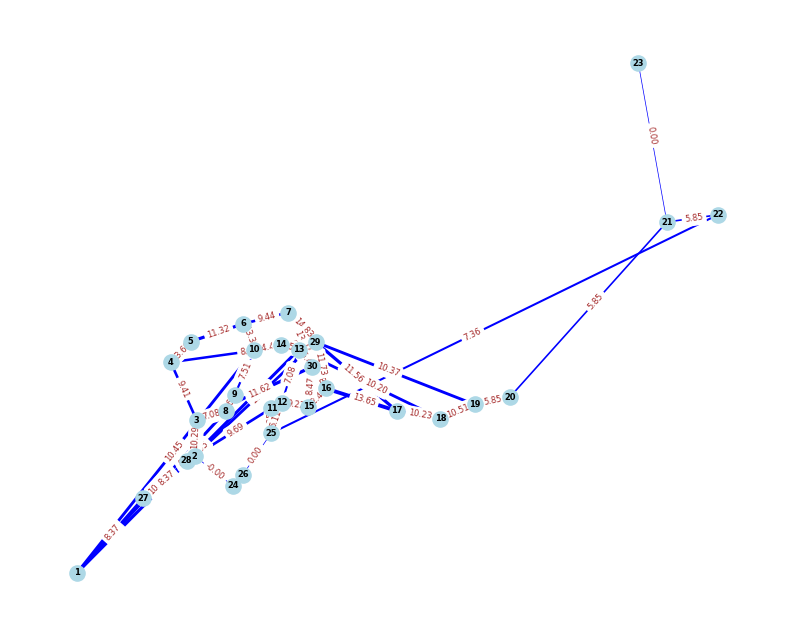

Iter 132: Obj=65160.5256, Best=49947.7013, Tabu=113


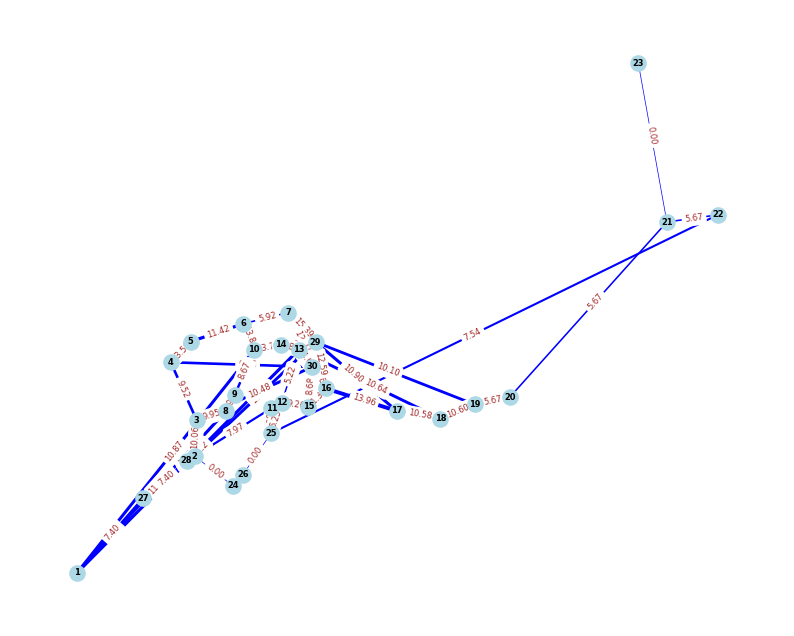

Iter 133: Obj=65427.1811, Best=49947.7013, Tabu=113


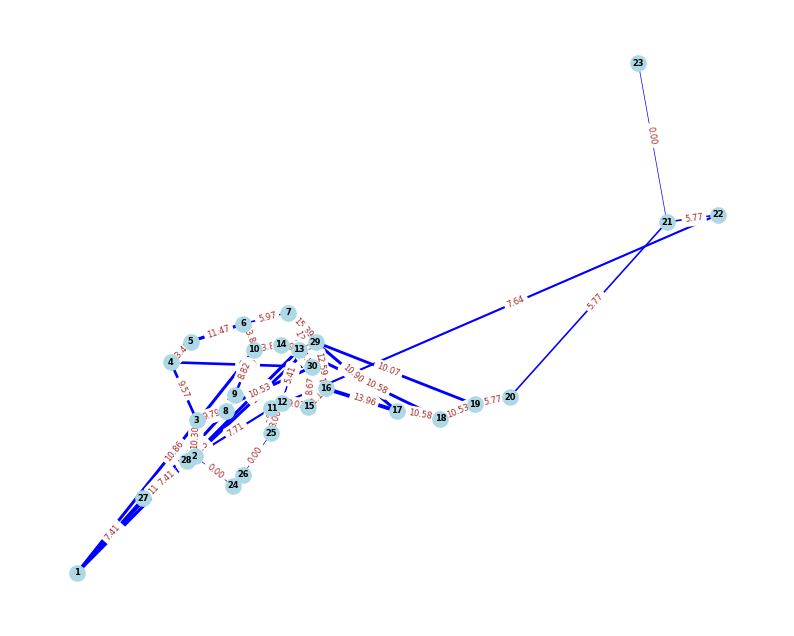

Iter 134: Obj=60004.6182, Best=49947.7013, Tabu=114


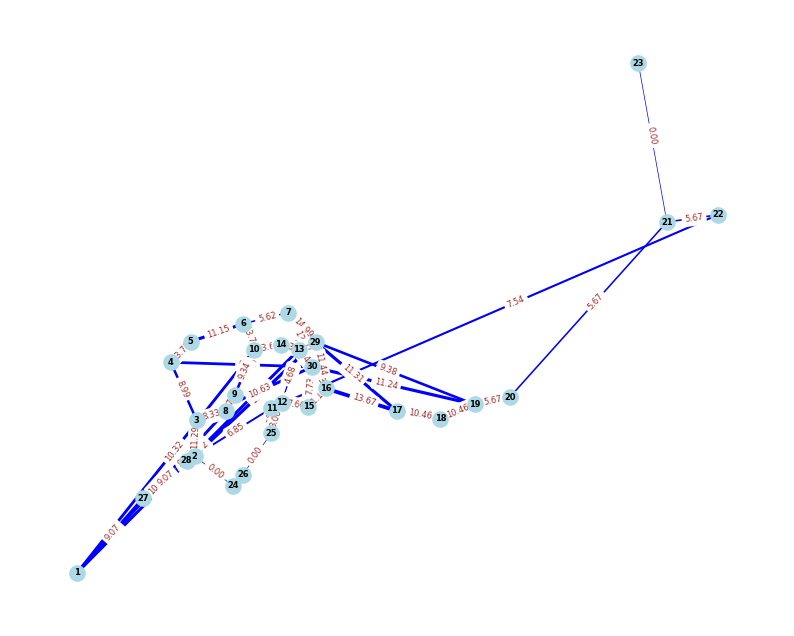

Iter 135: Obj=54005.4095, Best=49947.7013, Tabu=115


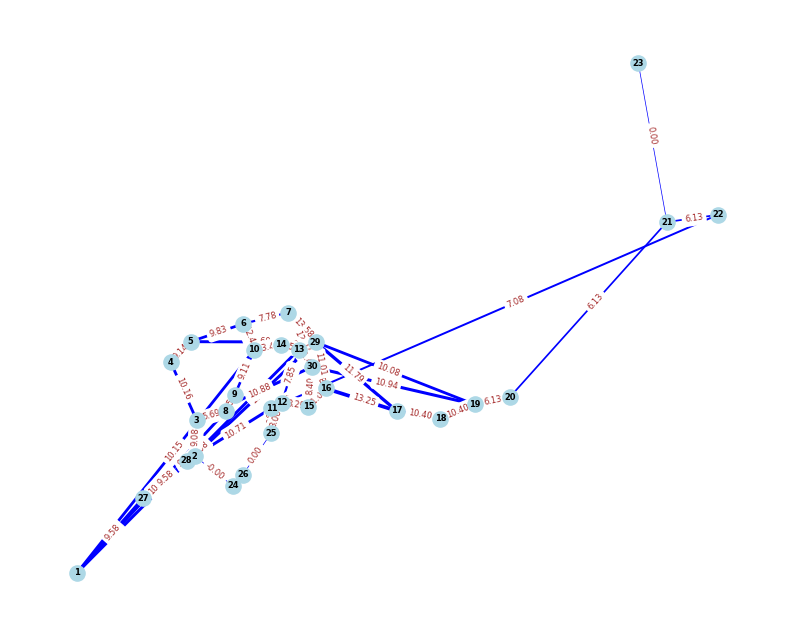

Iter 136: Obj=54823.9155, Best=49947.7013, Tabu=115


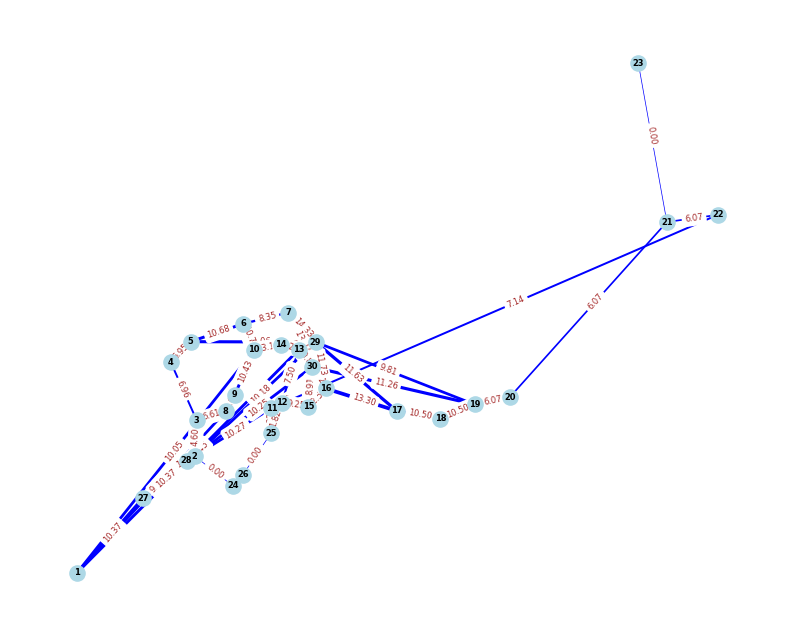

Iter 137: Obj=55607.7321, Best=49947.7013, Tabu=116


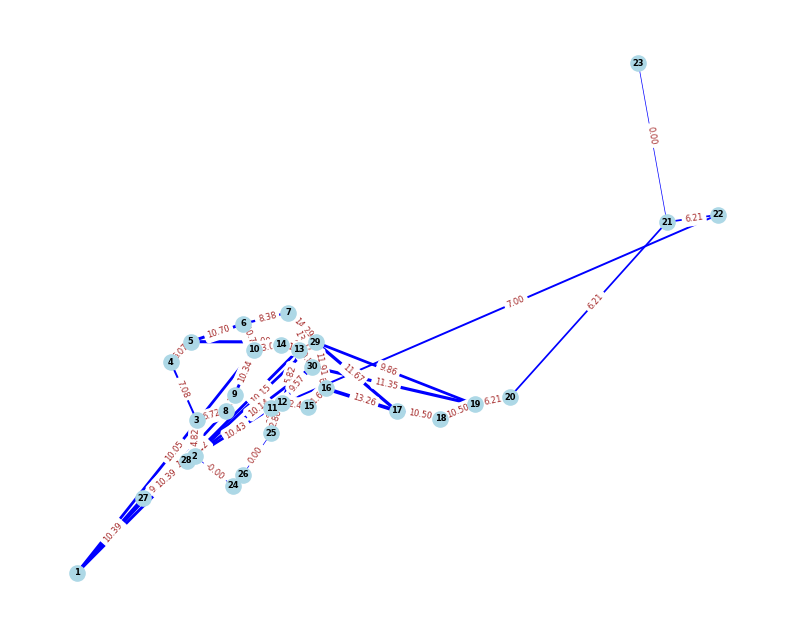

Iter 138: Obj=55858.5432, Best=49947.7013, Tabu=117


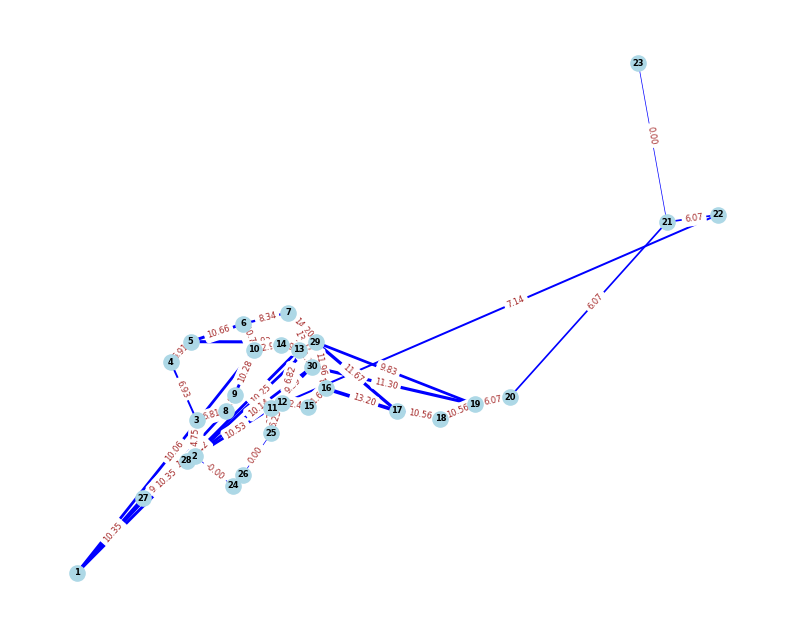

Iter 139: Obj=58624.1070, Best=49947.7013, Tabu=117


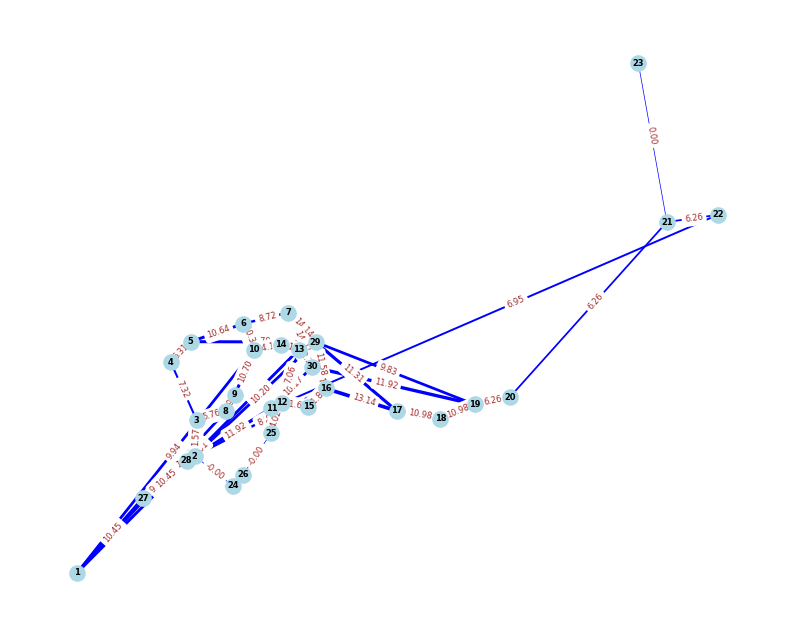

Iter 140: Obj=58587.6377, Best=49947.7013, Tabu=118


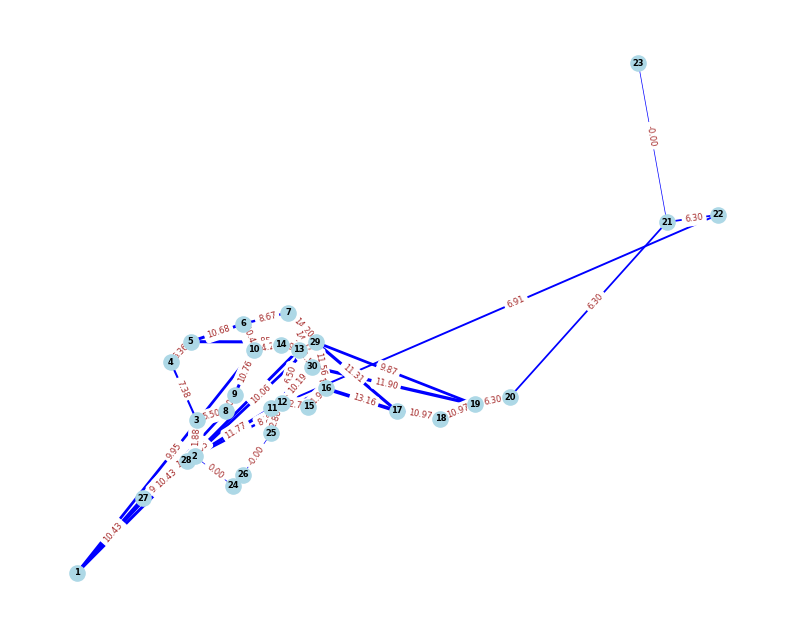

Iter 141: Obj=58349.5224, Best=49947.7013, Tabu=118


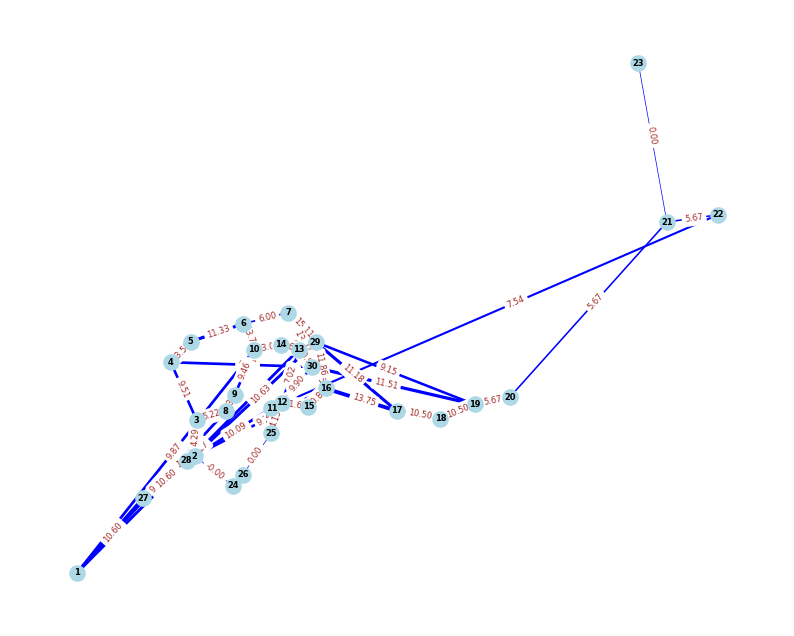

Iter 142: Obj=58578.6055, Best=49947.7013, Tabu=119


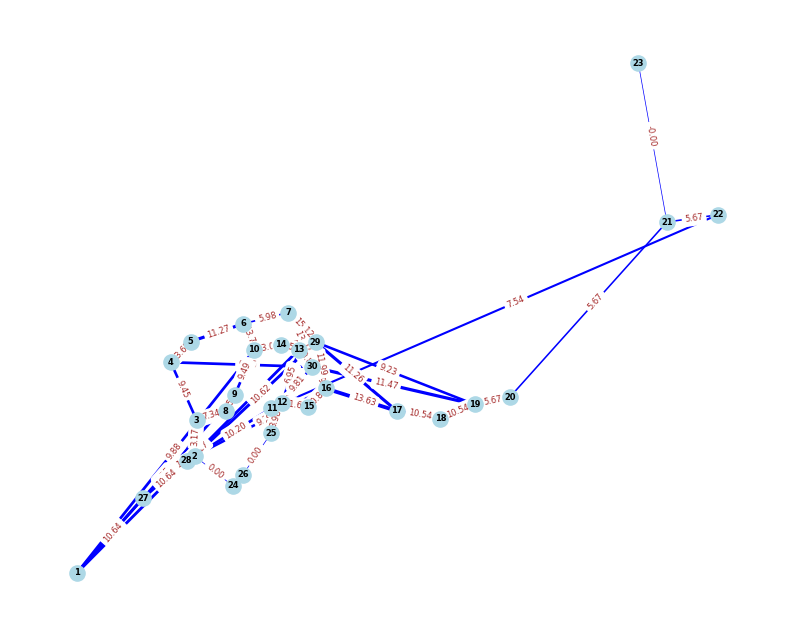

Iter 143: Obj=58669.5863, Best=49947.7013, Tabu=120


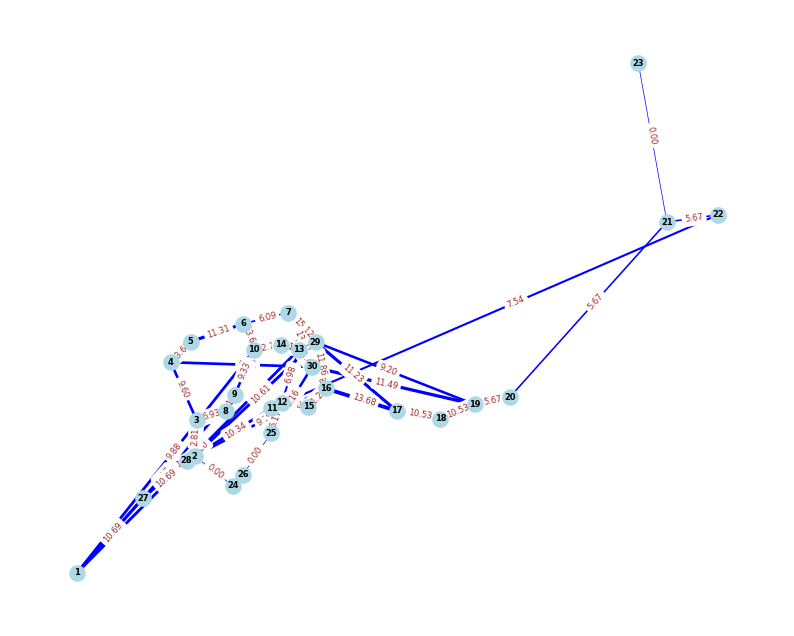

Iter 144: Obj=58217.2913, Best=49947.7013, Tabu=121


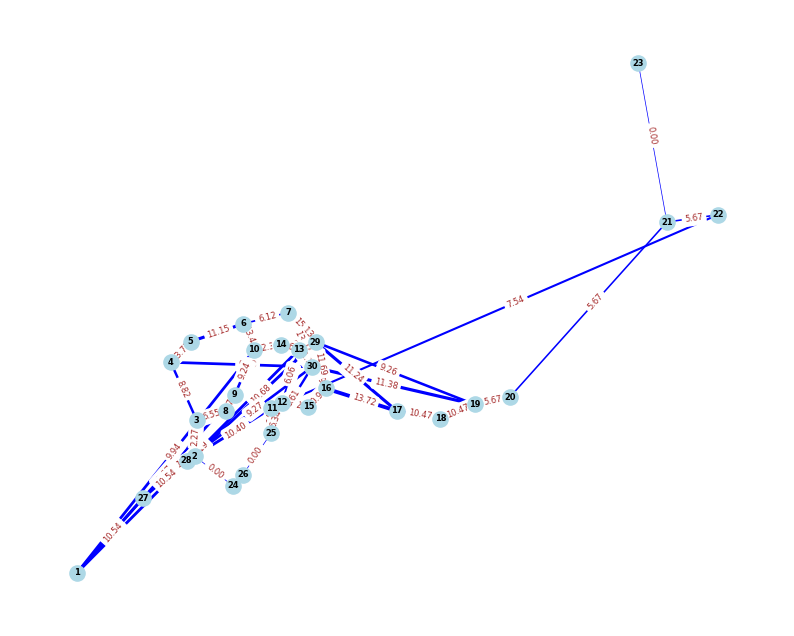

Iter 145: Obj=57382.5392, Best=49947.7013, Tabu=122


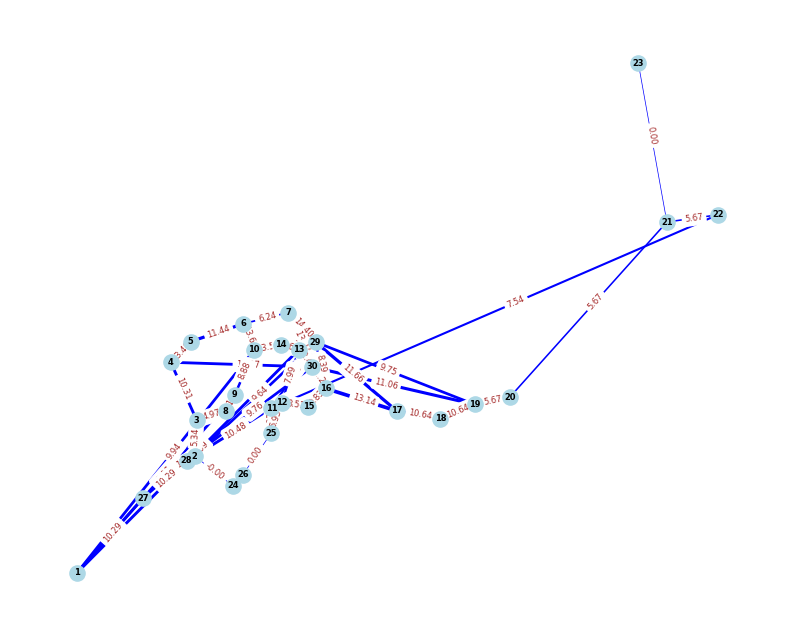

Iter 146: Obj=59367.1123, Best=49947.7013, Tabu=122


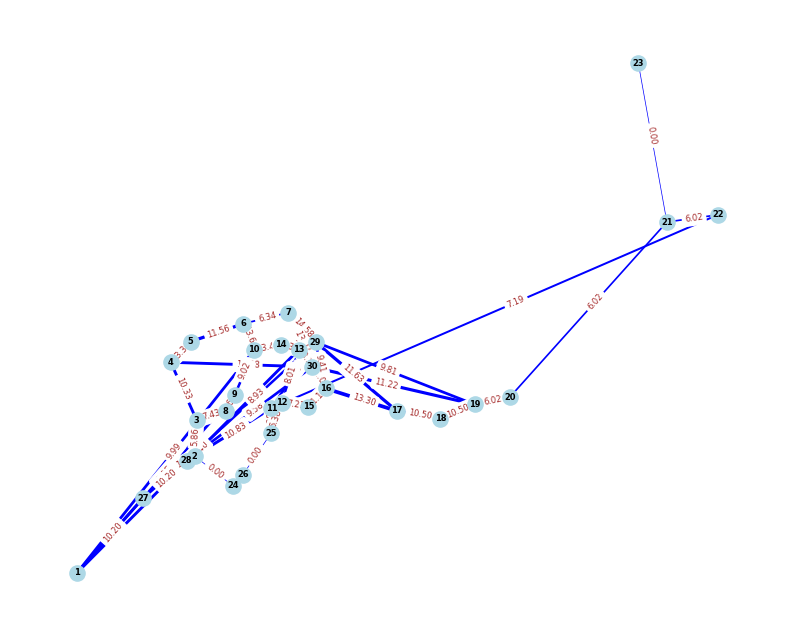

Iter 147: Obj=58219.8758, Best=49947.7013, Tabu=122


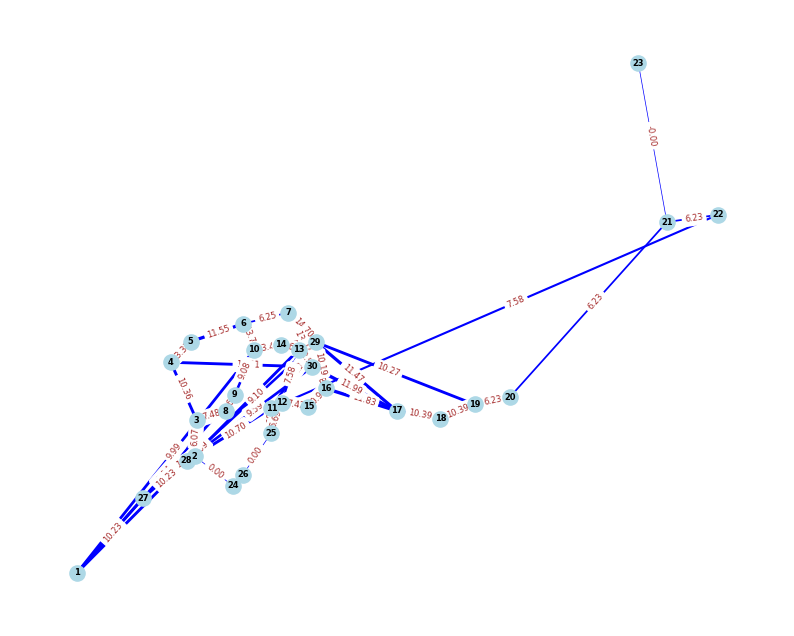

Iter 148: Obj=57913.2277, Best=49947.7013, Tabu=122


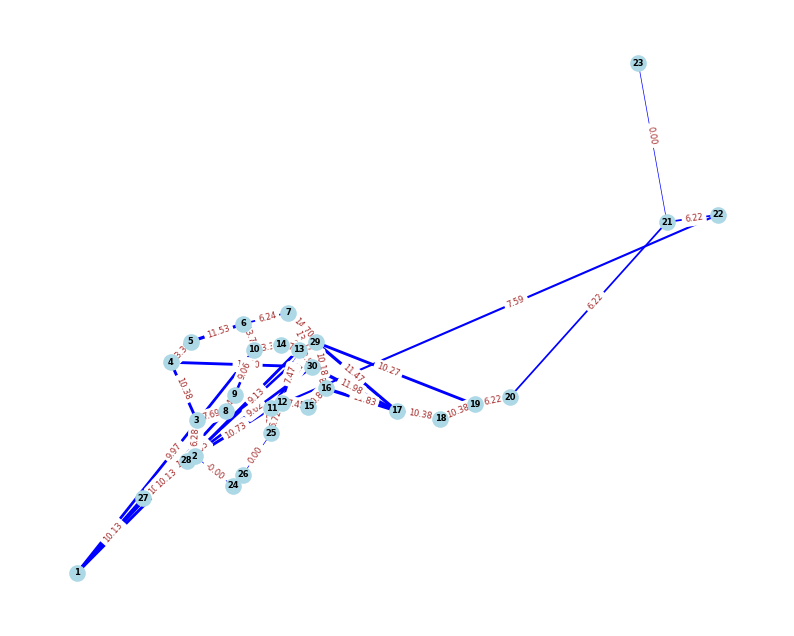

Iter 149: Obj=56264.7489, Best=49947.7013, Tabu=122


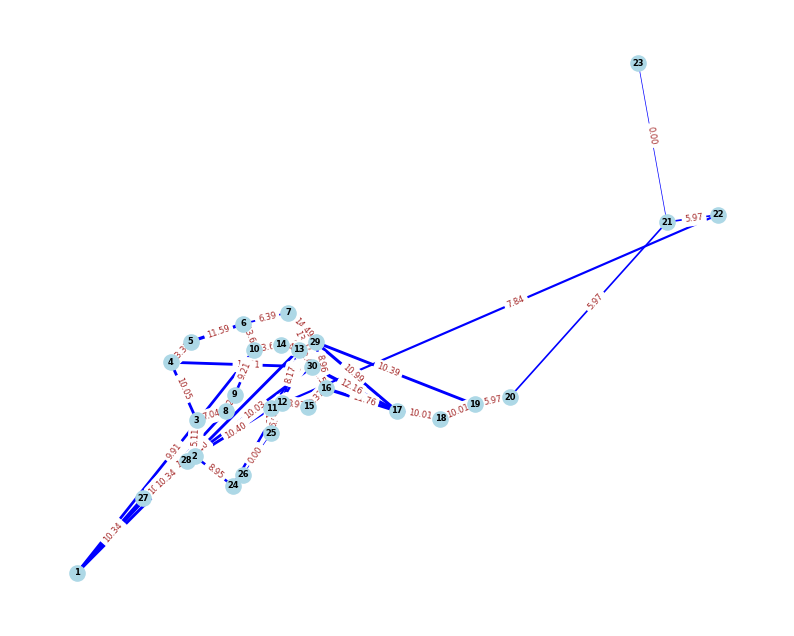

Iter 150: Obj=55464.7012, Best=49947.7013, Tabu=123


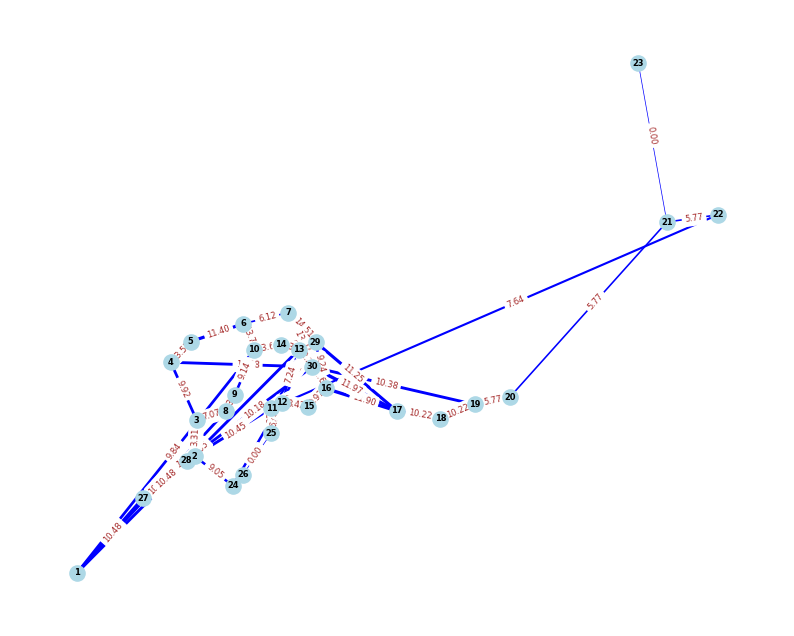

Iter 151: Obj=55868.8467, Best=49947.7013, Tabu=123


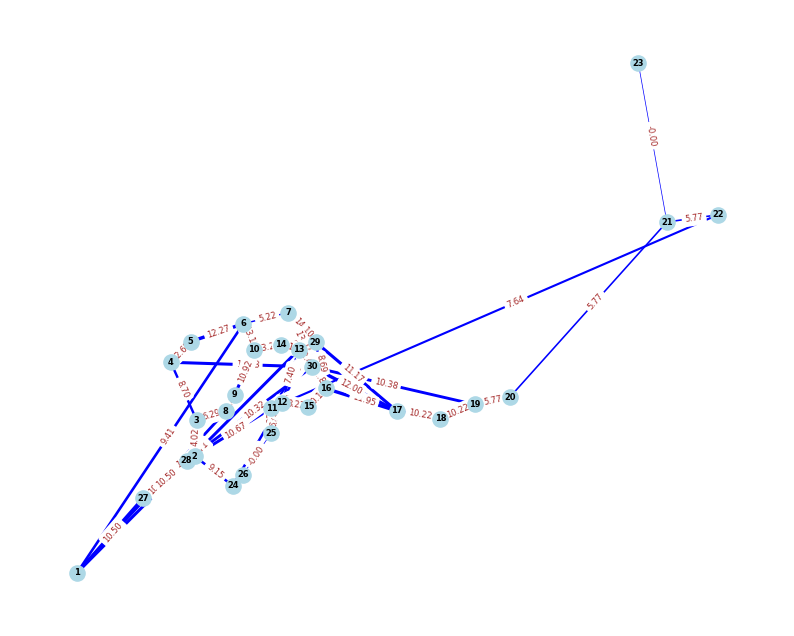

Iter 152: Obj=55918.8944, Best=49947.7013, Tabu=124


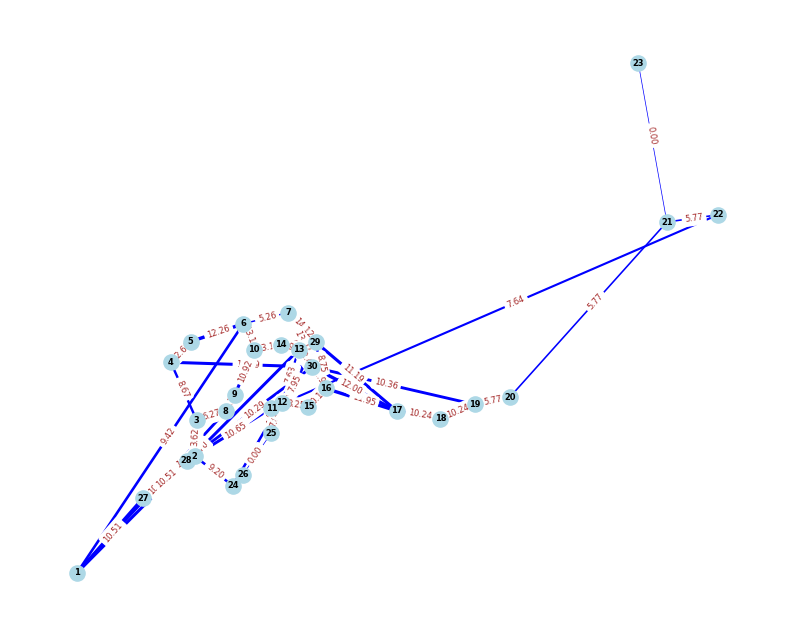

Iter 153: Obj=55425.9366, Best=49947.7013, Tabu=125


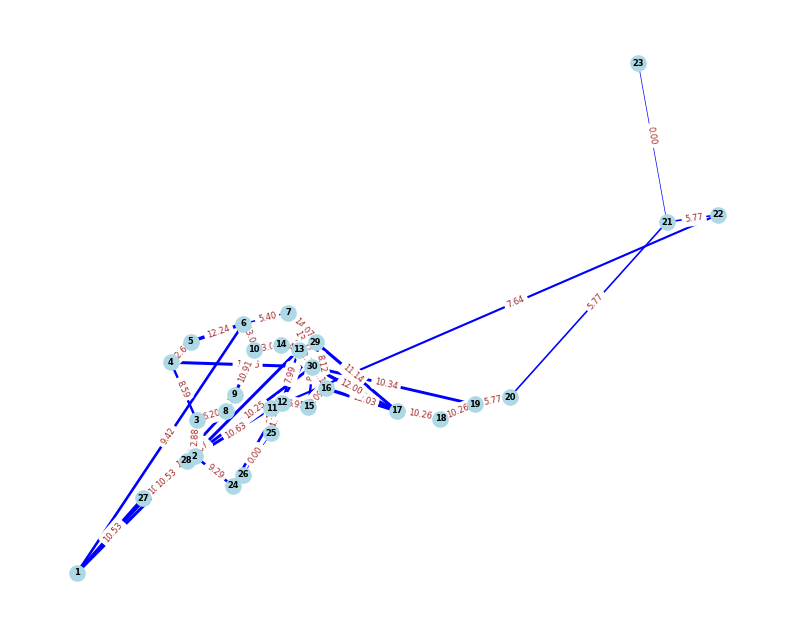

Iter 154: Obj=55296.2515, Best=49947.7013, Tabu=125


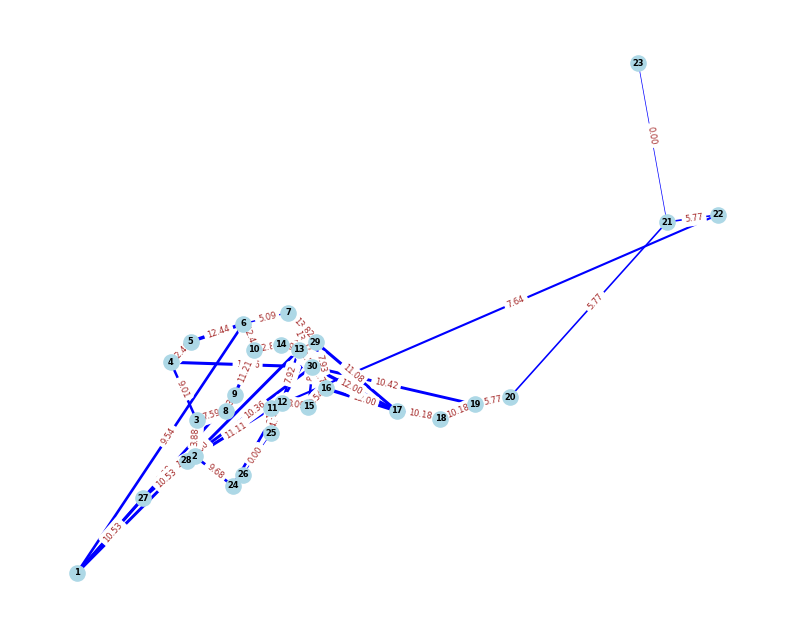

Iter 155: Obj=56486.2388, Best=49947.7013, Tabu=126


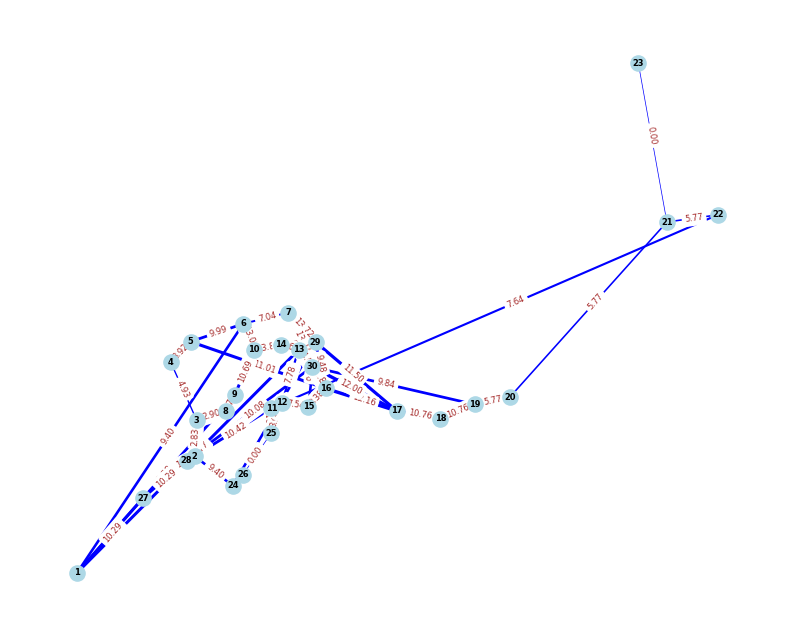

Iter 156: Obj=57631.7289, Best=49947.7013, Tabu=127


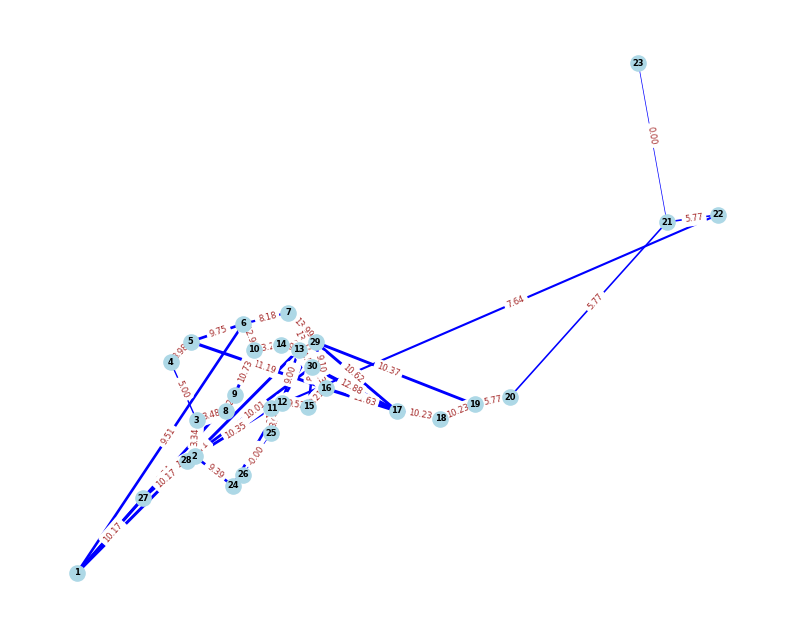

Iter 157: Obj=56801.6634, Best=49947.7013, Tabu=128


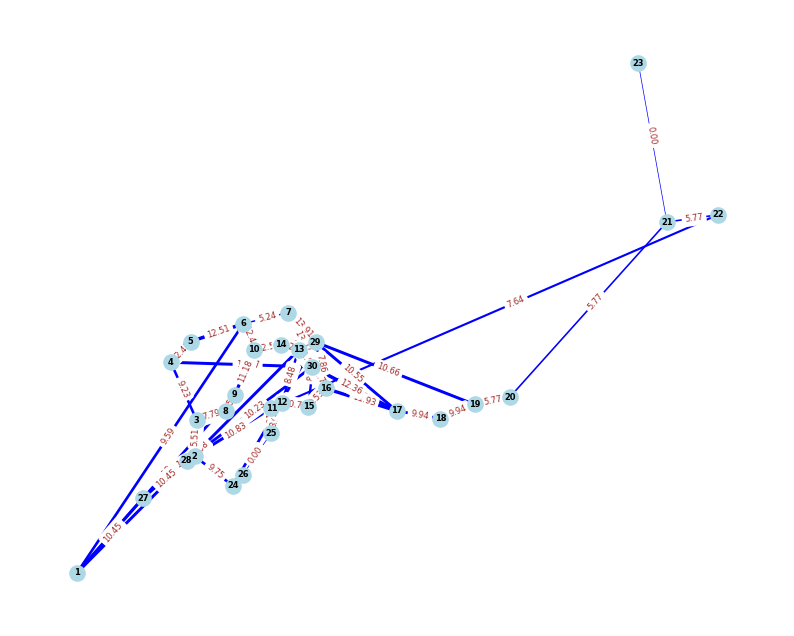

Iter 158: Obj=56252.2531, Best=49947.7013, Tabu=129


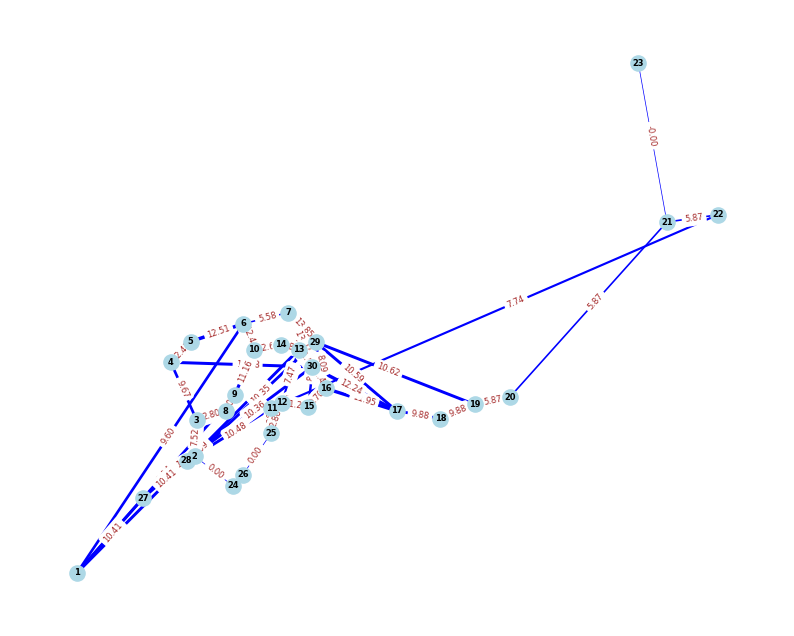

Iter 159: Obj=57496.6582, Best=49947.7013, Tabu=130


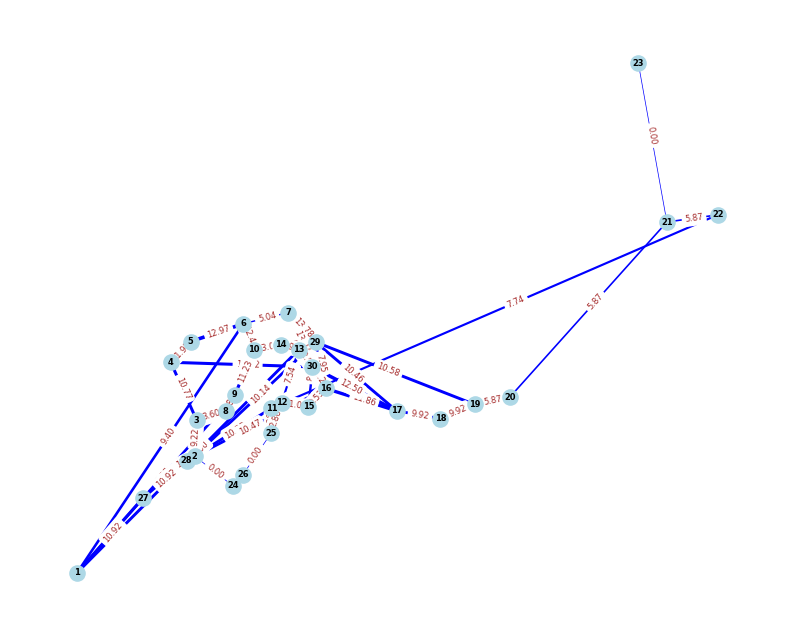

Iter 160: Obj=60336.3530, Best=49947.7013, Tabu=131


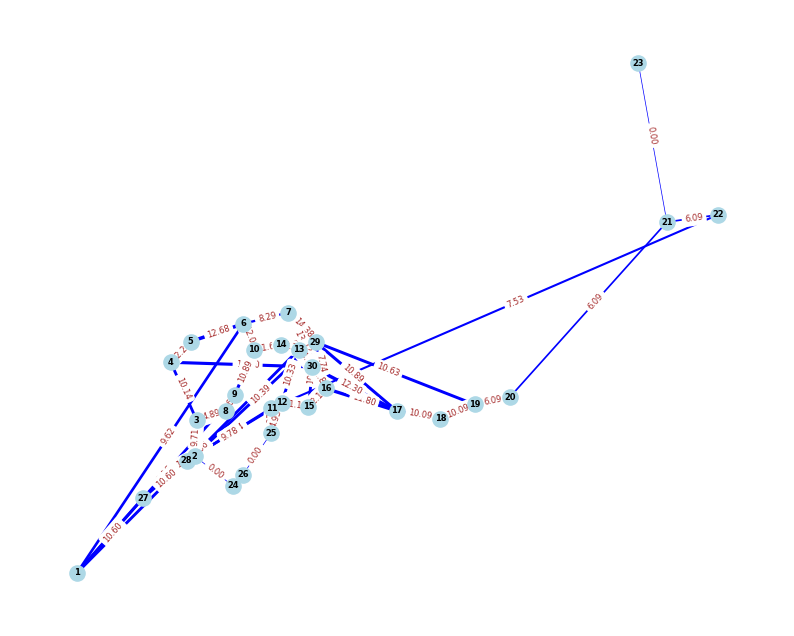

Iter 161: Obj=58947.8185, Best=49947.7013, Tabu=132


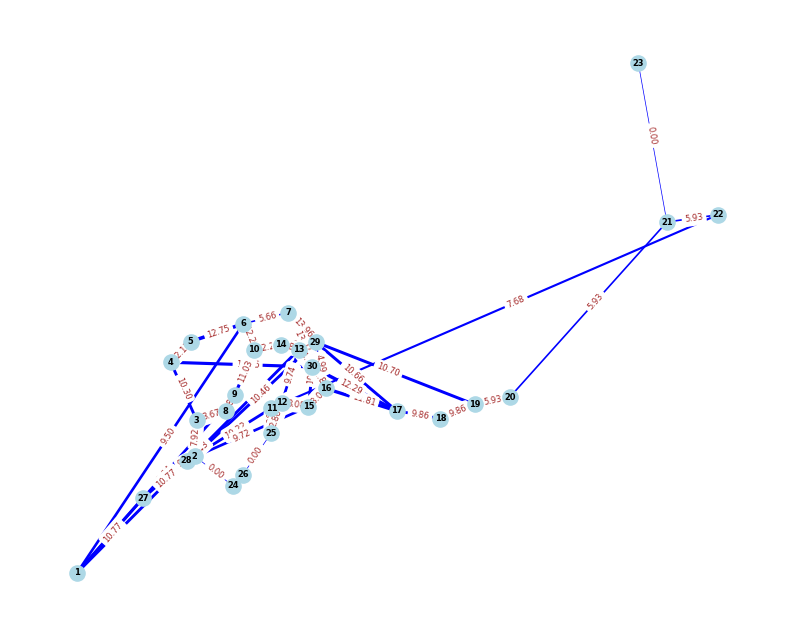

Iter 162: Obj=60574.2853, Best=49947.7013, Tabu=133


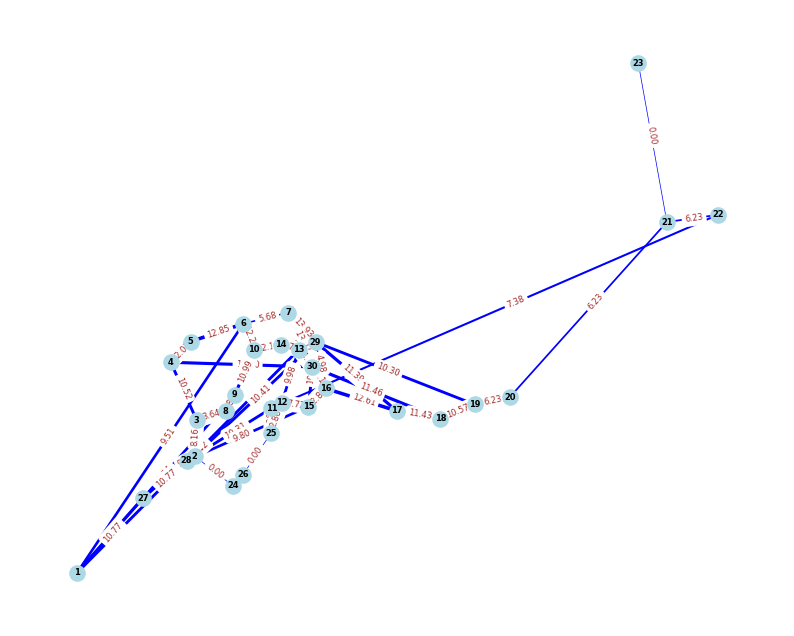

Iter 163: Obj=61037.0692, Best=49947.7013, Tabu=133


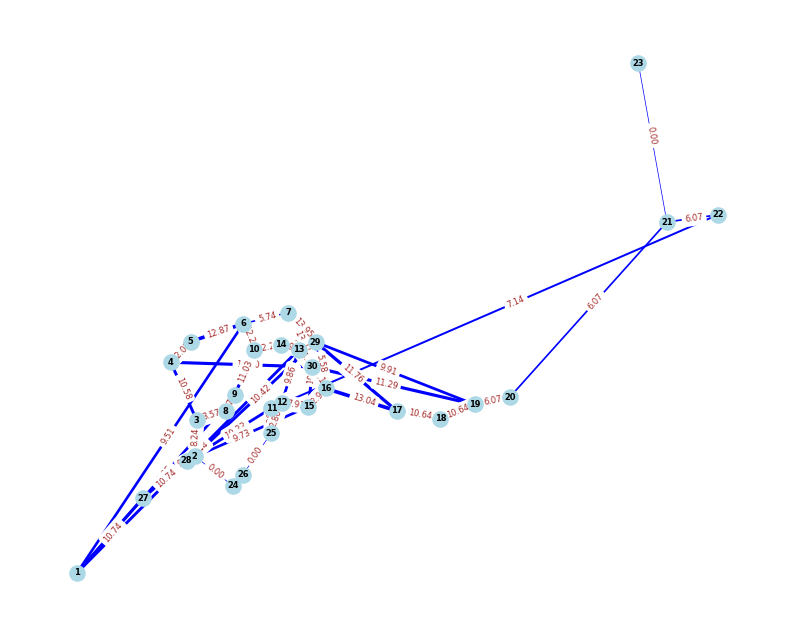

Iter 164: Obj=62452.0185, Best=49947.7013, Tabu=134


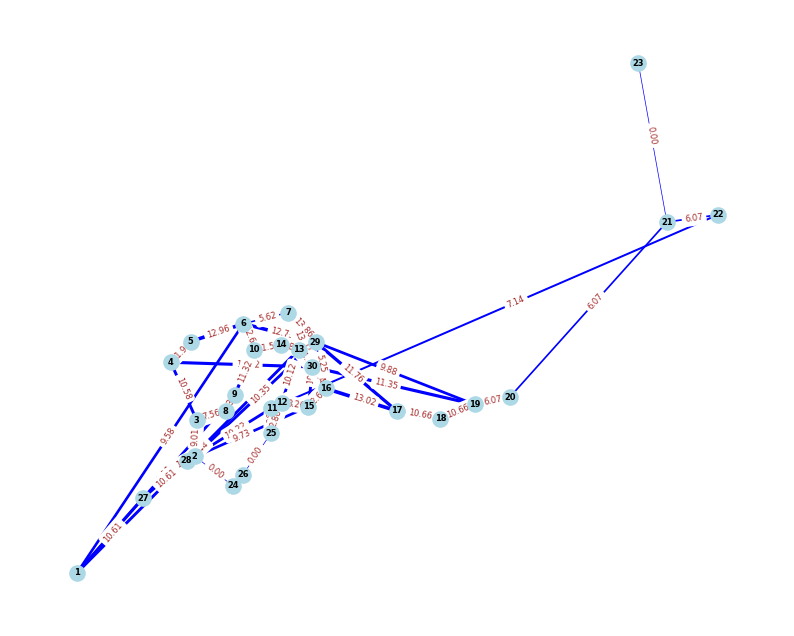

Iter 165: Obj=61710.1307, Best=49947.7013, Tabu=135


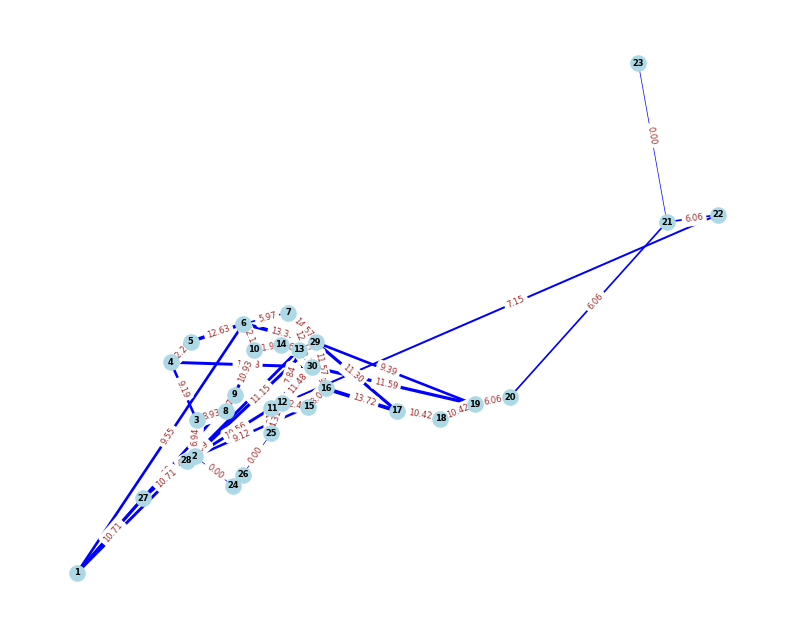

Iter 166: Obj=62452.0185, Best=49947.7013, Tabu=136


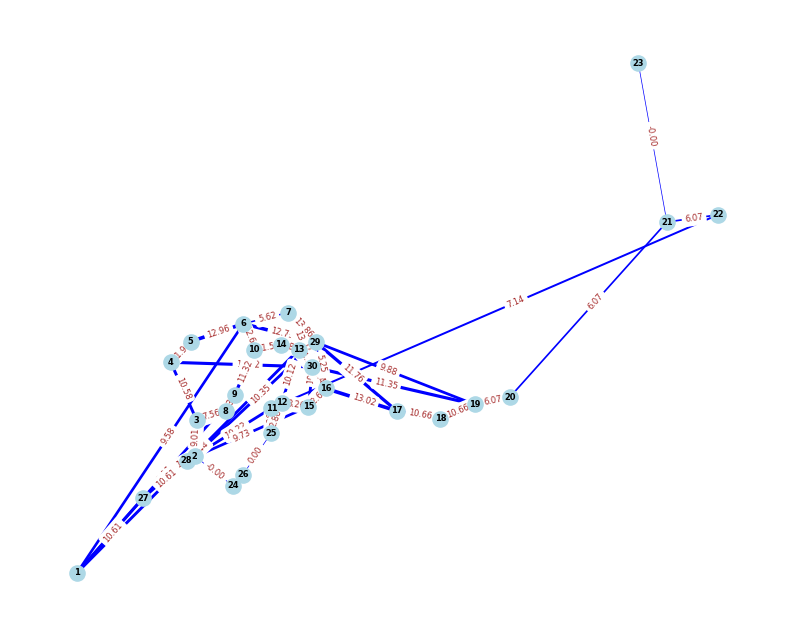

Iter 167: Obj=63389.6546, Best=49947.7013, Tabu=137


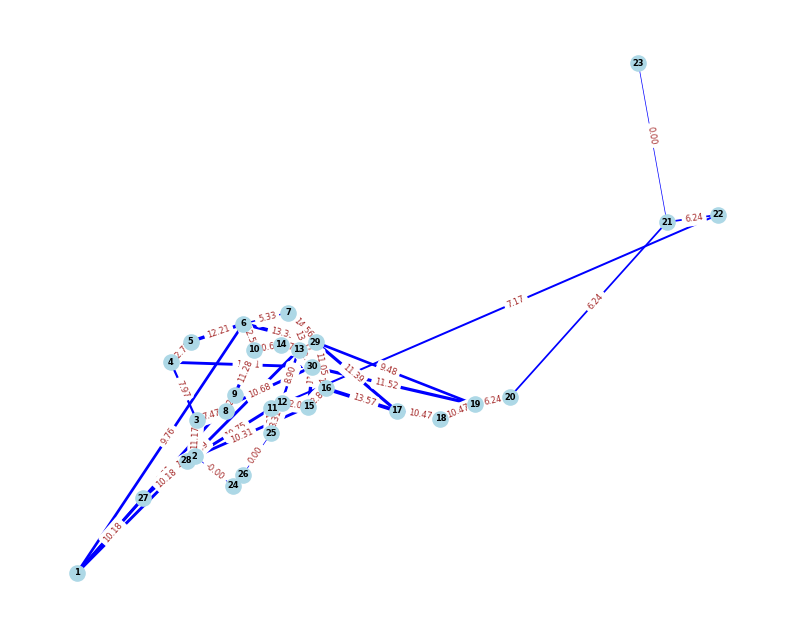

Iter 168: Obj=61394.4652, Best=49947.7013, Tabu=138


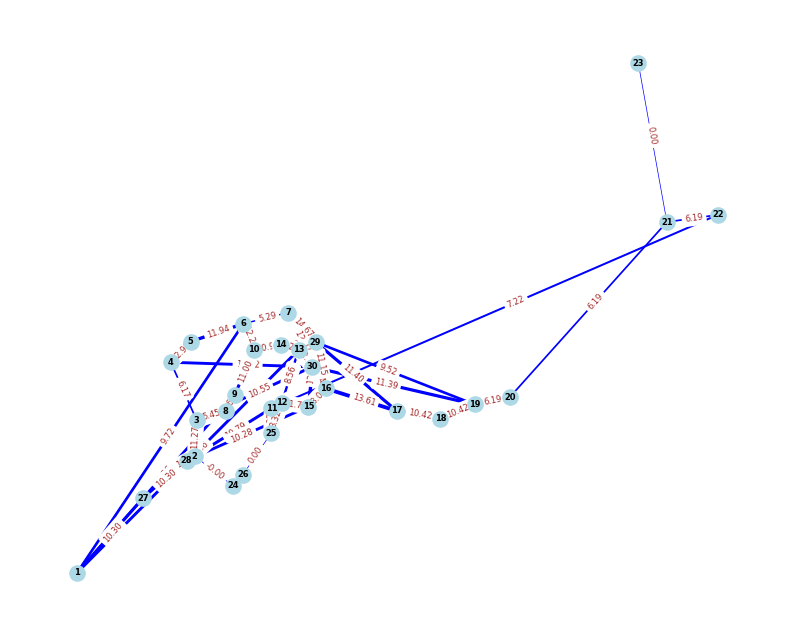

Iter 169: Obj=60366.9399, Best=49947.7013, Tabu=139


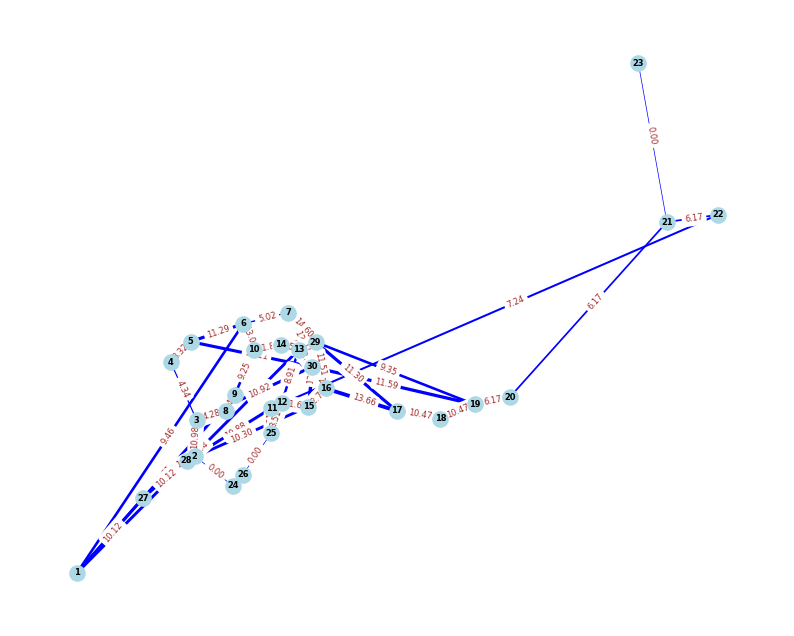

Iter 170: Obj=58166.1294, Best=49947.7013, Tabu=139


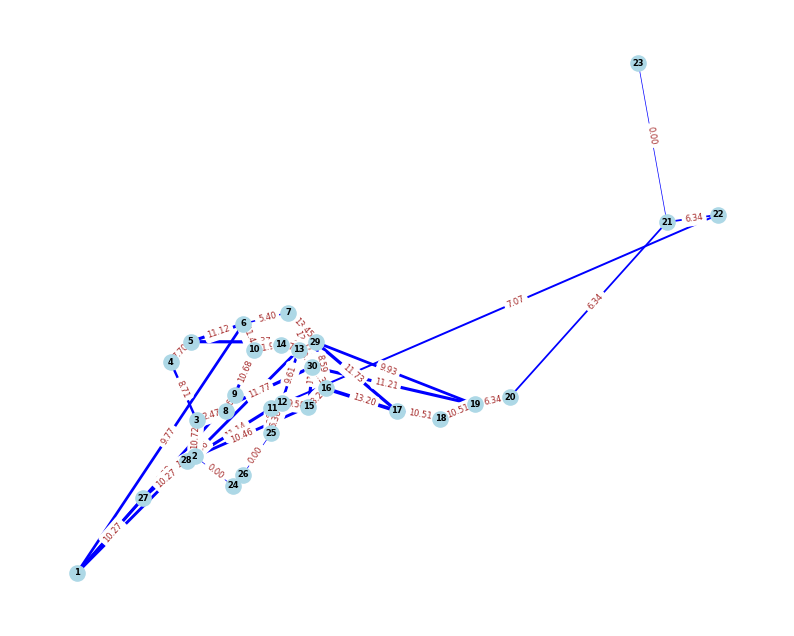

Iter 171: Obj=58261.0489, Best=49947.7013, Tabu=139


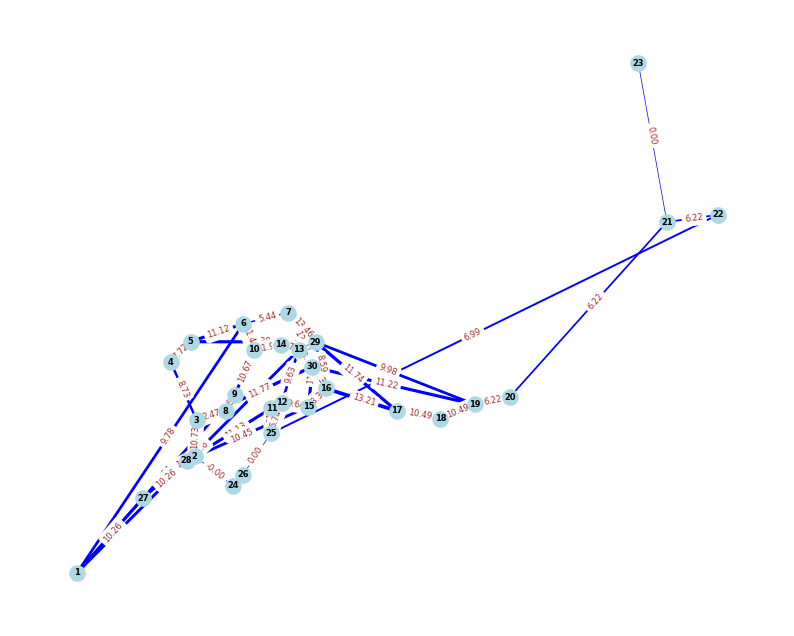

Iter 172: Obj=57954.9738, Best=49947.7013, Tabu=140


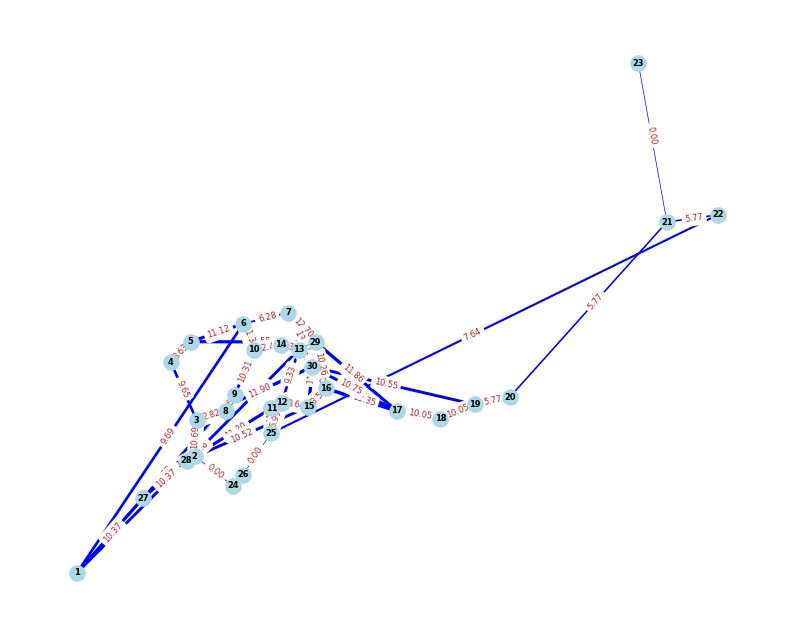

Iter 173: Obj=57840.3683, Best=49947.7013, Tabu=140


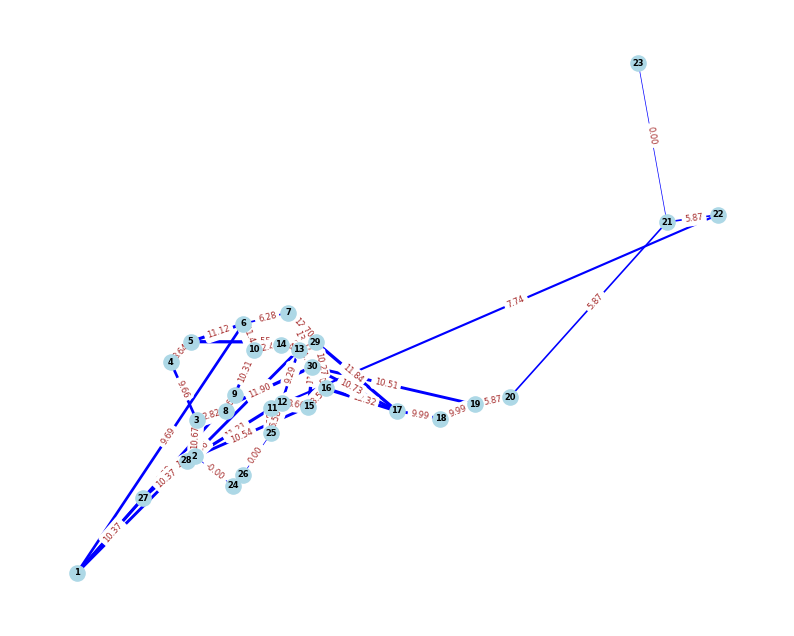

Iter 174: Obj=59272.5723, Best=49947.7013, Tabu=140


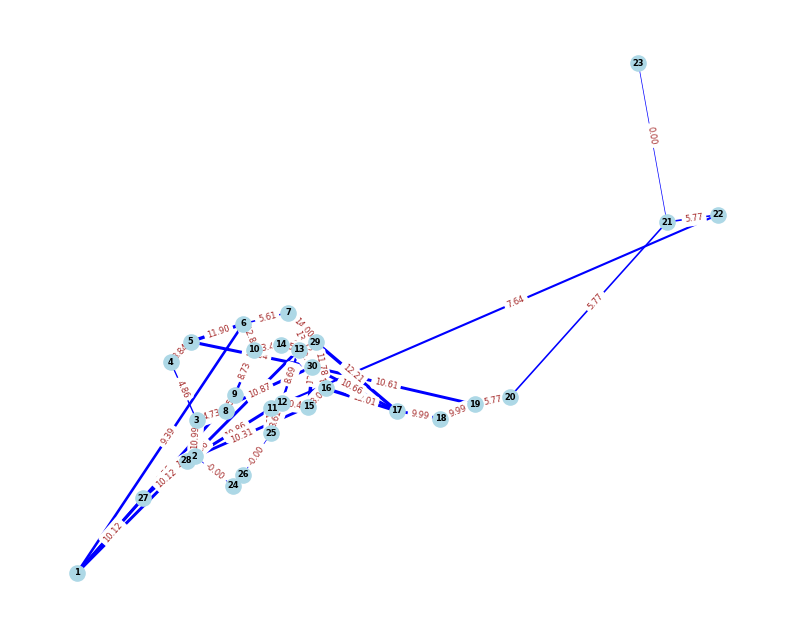

Iter 175: Obj=58836.1529, Best=49947.7013, Tabu=140


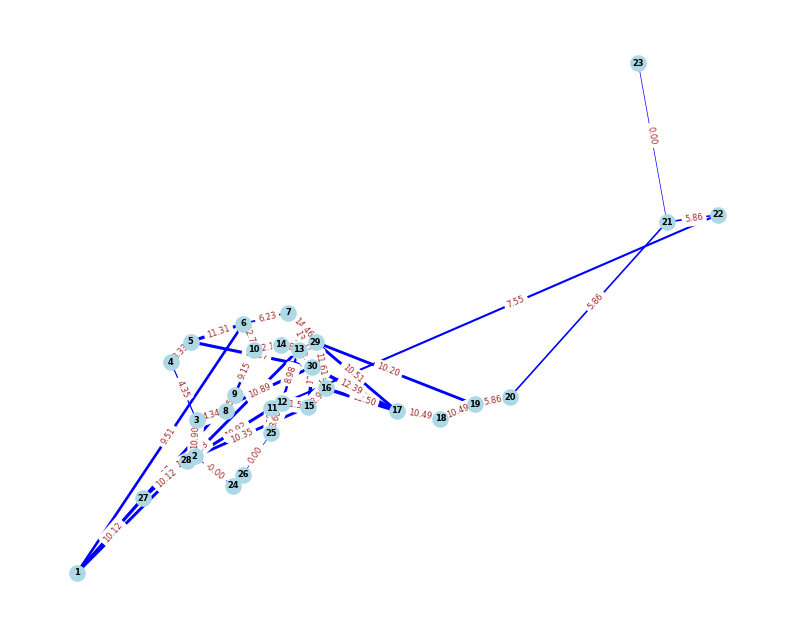

Iter 176: Obj=60366.9399, Best=49947.7013, Tabu=140


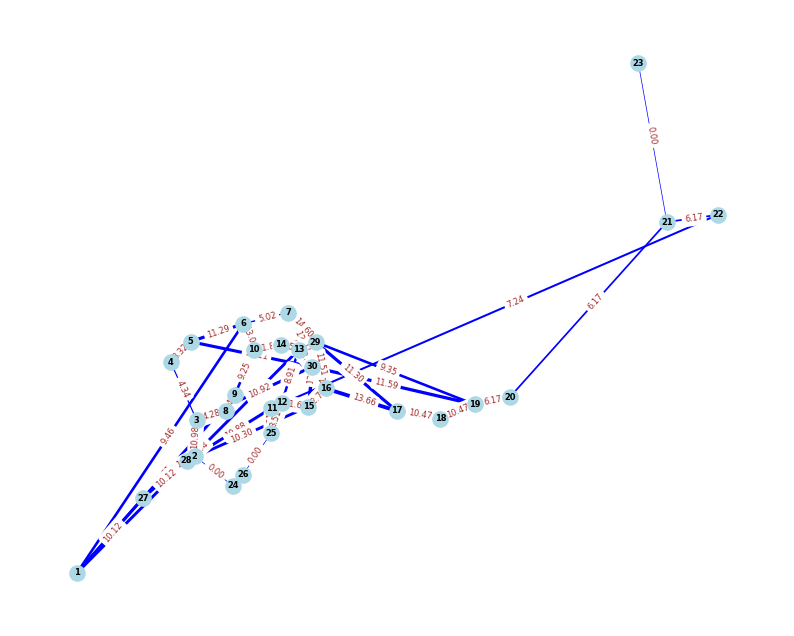

Iter 177: Obj=63437.1742, Best=49947.7013, Tabu=141


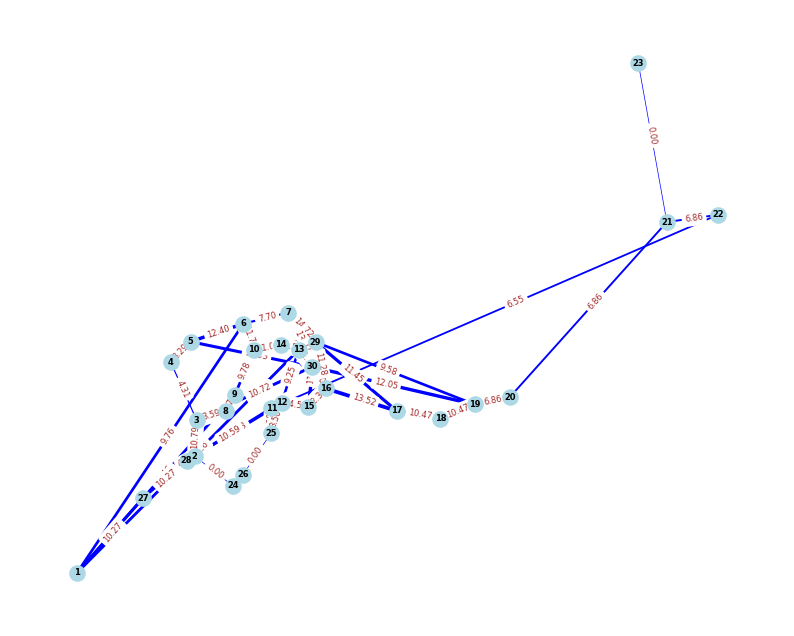

Iter 178: Obj=61635.2696, Best=49947.7013, Tabu=142


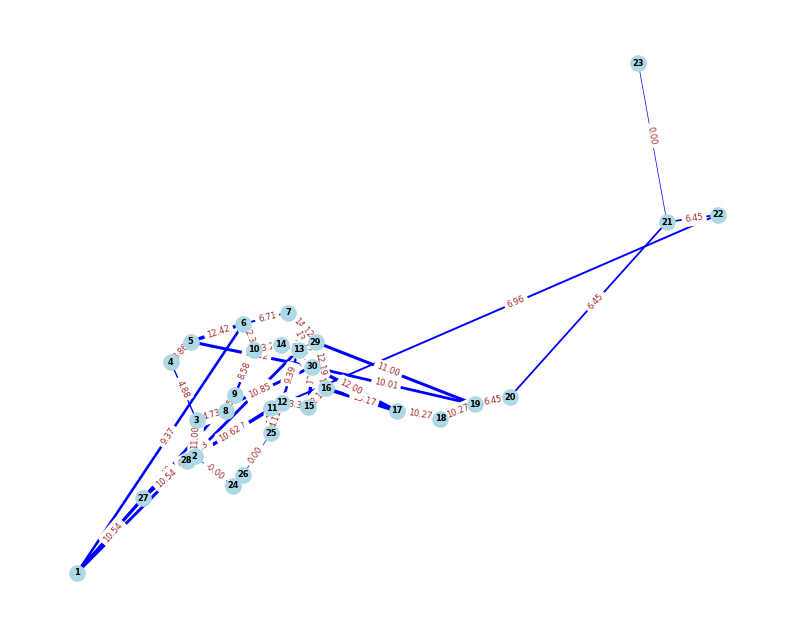

Iter 179: Obj=61818.8304, Best=49947.7013, Tabu=143


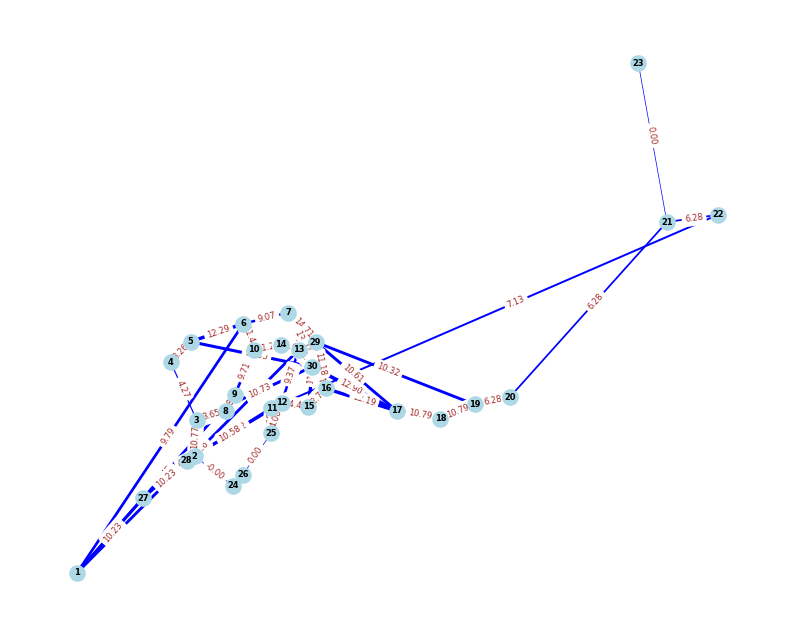

Iter 180: Obj=64655.3419, Best=49947.7013, Tabu=143


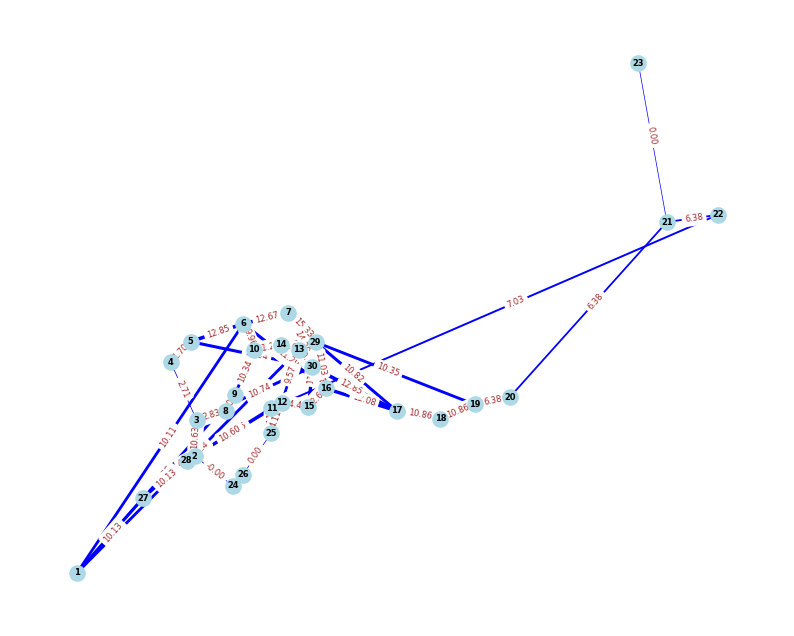

Iter 181: Obj=66222.0524, Best=49947.7013, Tabu=143


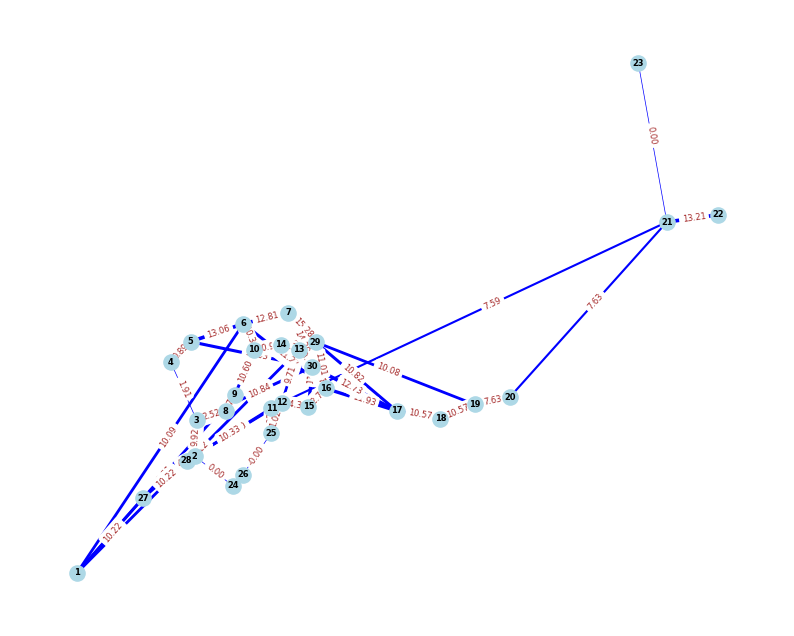

Iter 182: Obj=66402.6738, Best=49947.7013, Tabu=144


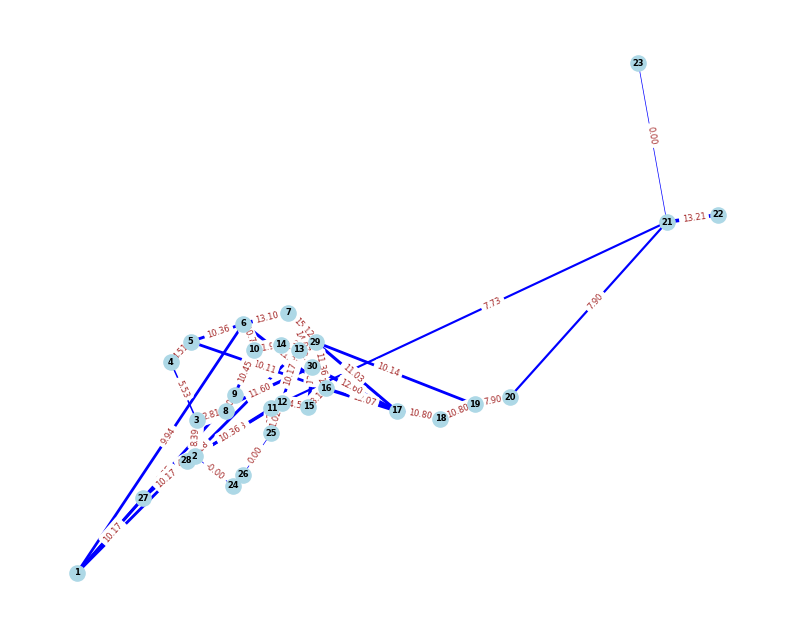

Iter 183: Obj=62979.0656, Best=49947.7013, Tabu=145


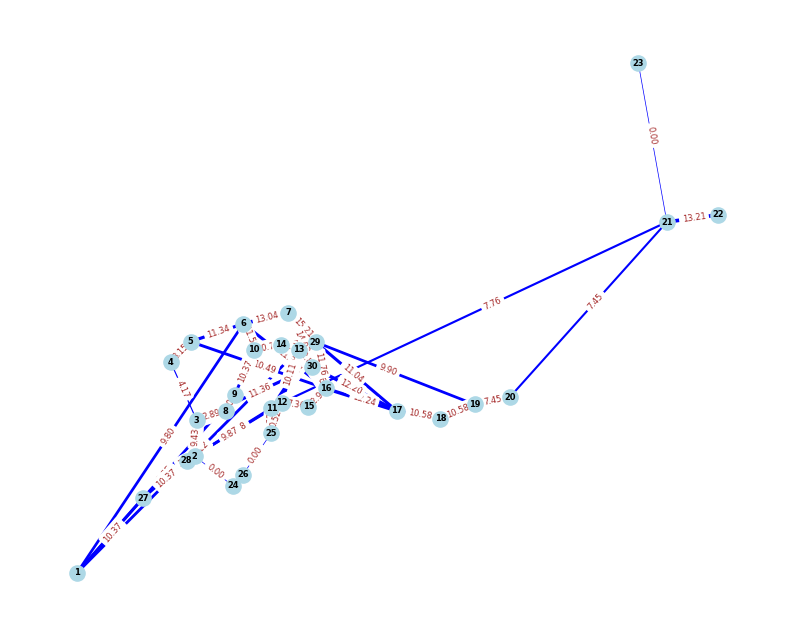

Iter 184: Obj=63271.1172, Best=49947.7013, Tabu=146


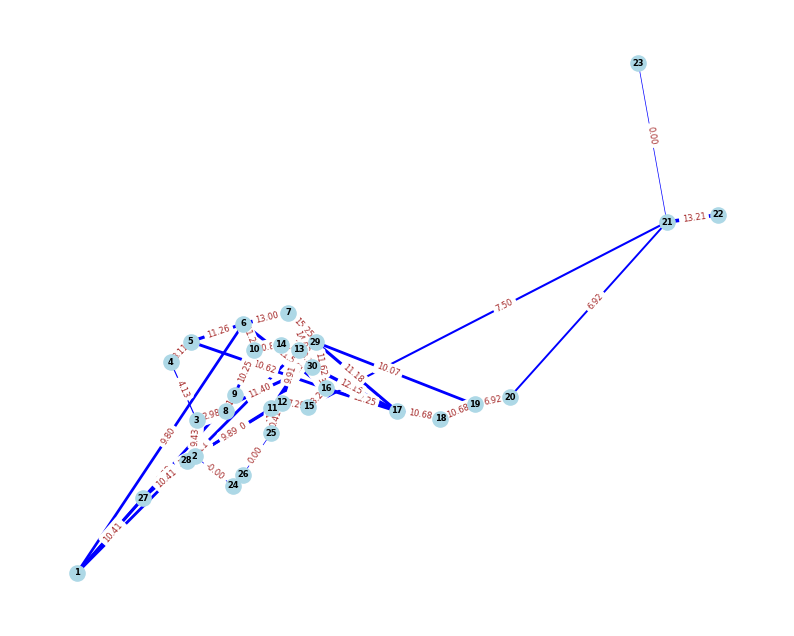

Iter 185: Obj=62892.8522, Best=49947.7013, Tabu=147


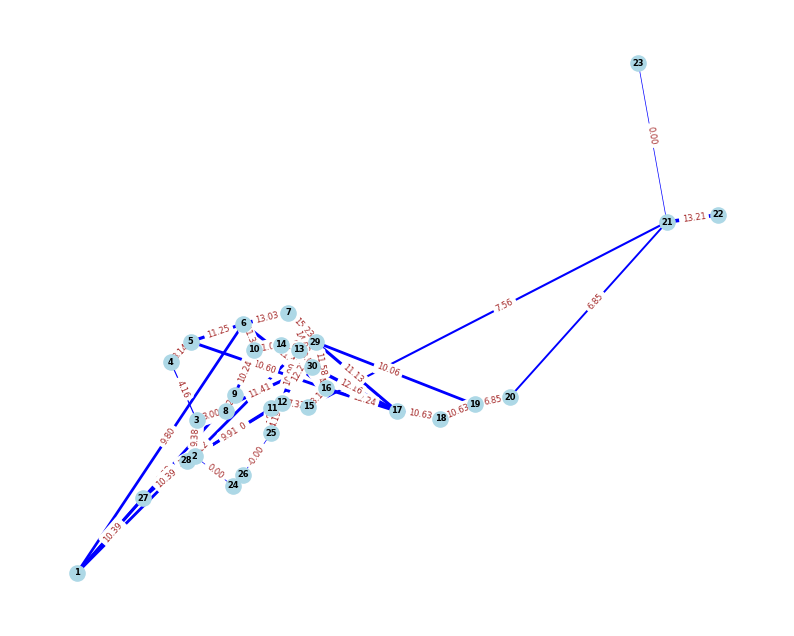

Iter 186: Obj=62517.4294, Best=49947.7013, Tabu=148


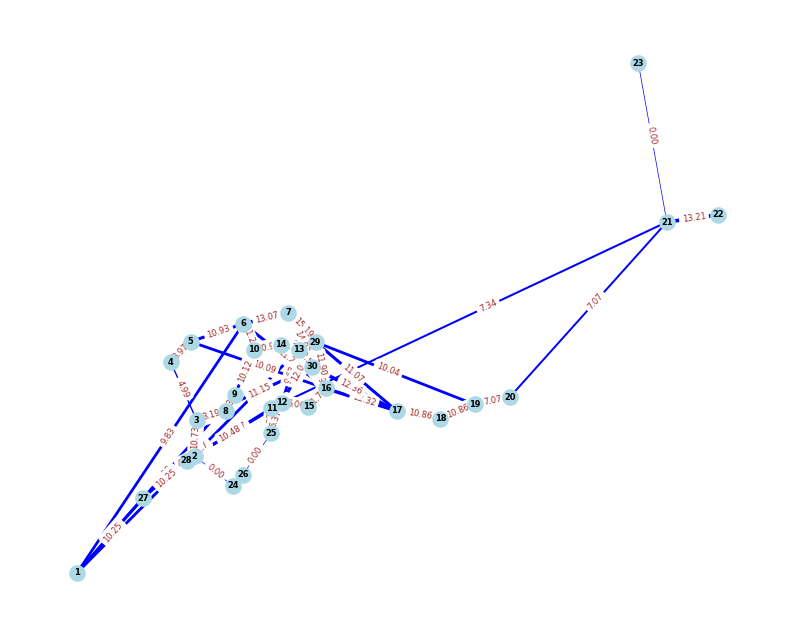

Iter 187: Obj=63031.5329, Best=49947.7013, Tabu=149


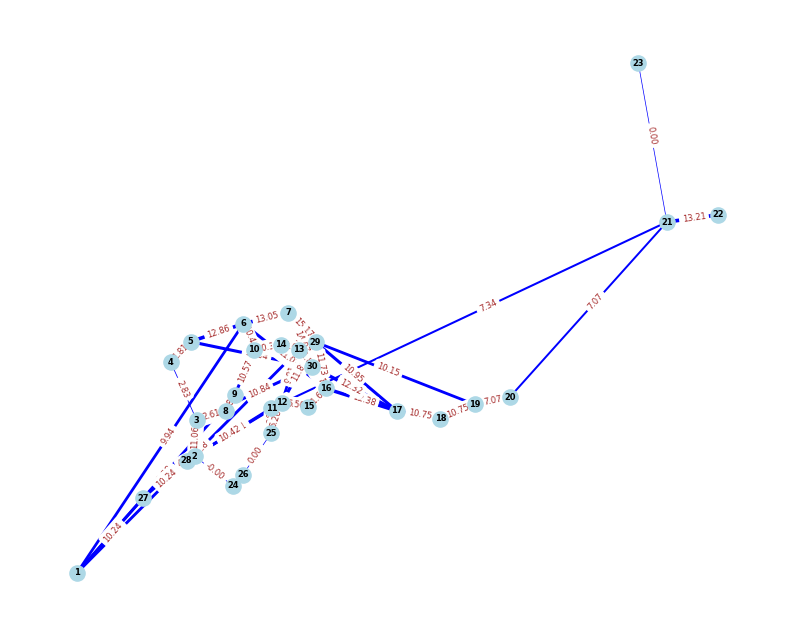

Iter 188: Obj=60192.2298, Best=49947.7013, Tabu=149


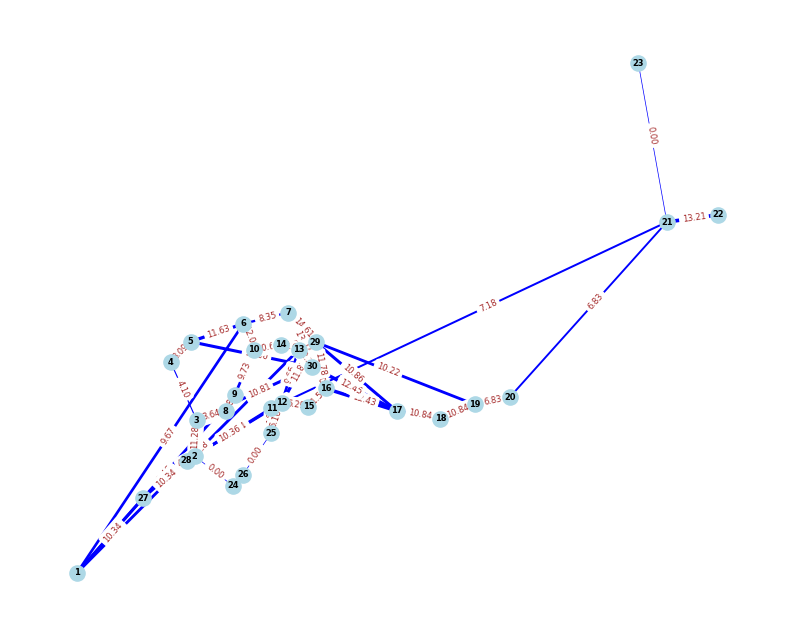

Iter 189: Obj=58323.0977, Best=49947.7013, Tabu=150


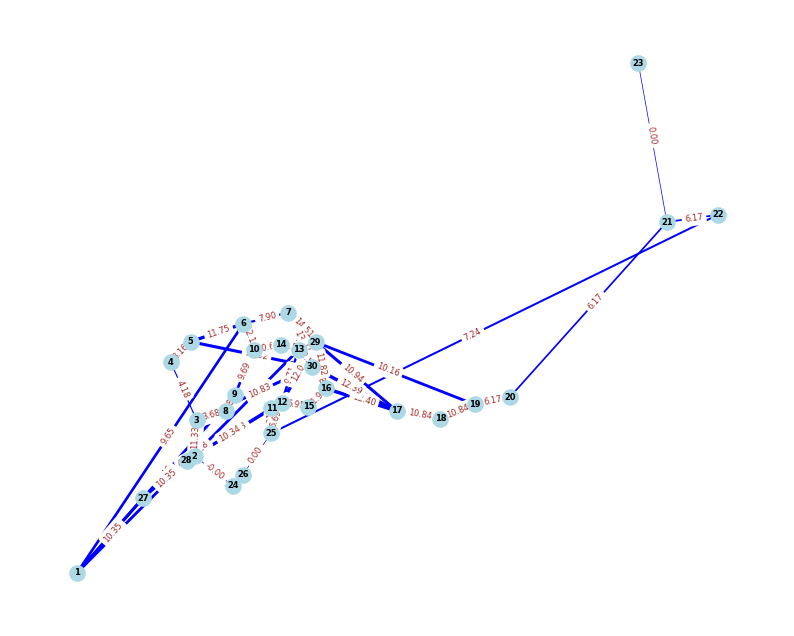

Iter 190: Obj=60301.9734, Best=49947.7013, Tabu=151


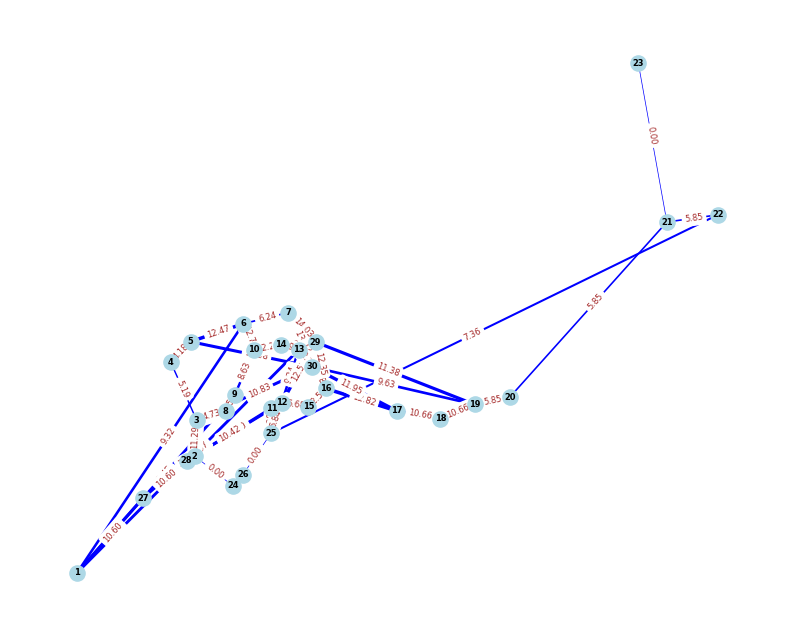

Iter 191: Obj=60075.1065, Best=49947.7013, Tabu=152


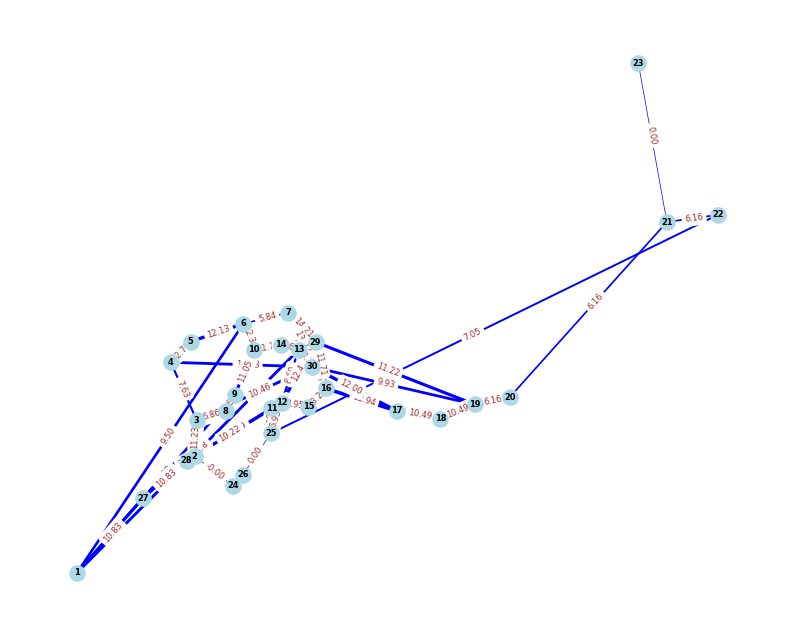

Iter 192: Obj=60171.4637, Best=49947.7013, Tabu=153


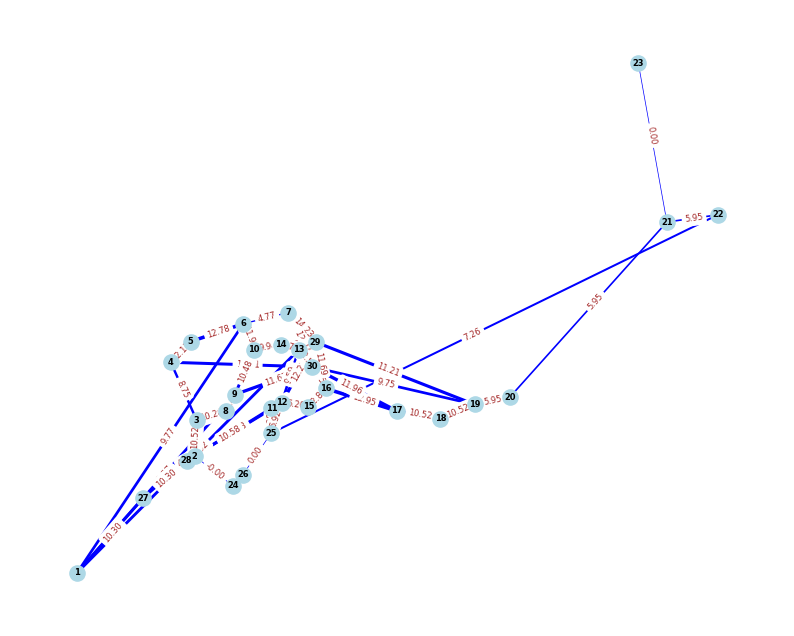

Iter 193: Obj=58835.7086, Best=49947.7013, Tabu=154


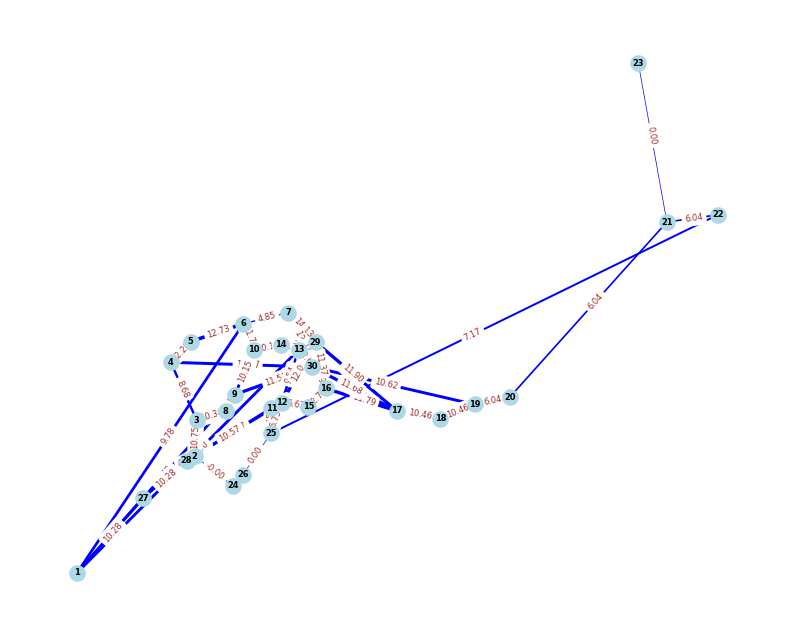

Iter 194: Obj=59805.7312, Best=49947.7013, Tabu=155


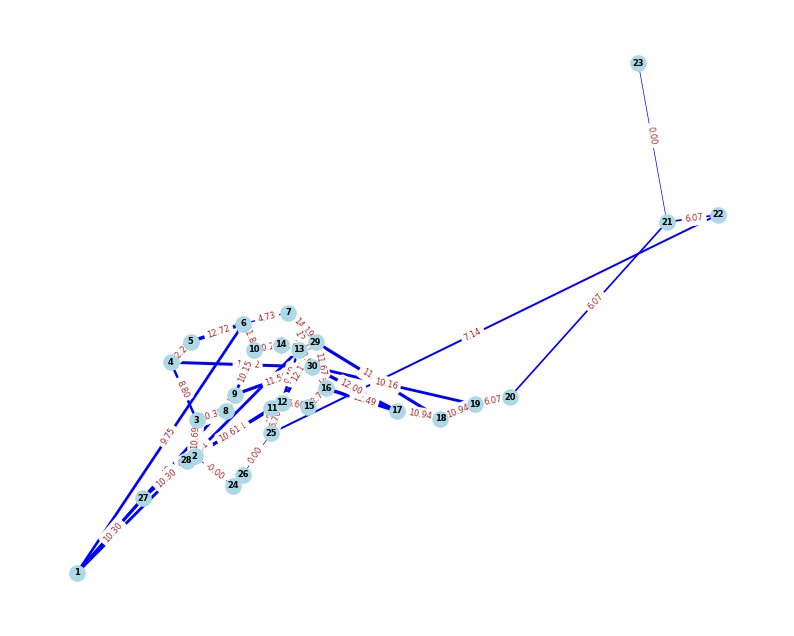

Iter 195: Obj=61127.9649, Best=49947.7013, Tabu=156


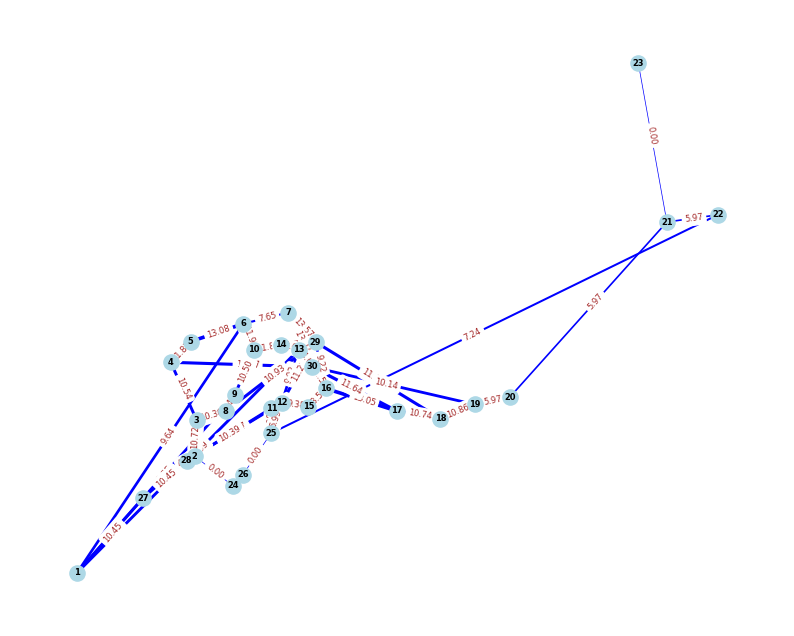

Iter 196: Obj=59943.1694, Best=49947.7013, Tabu=157


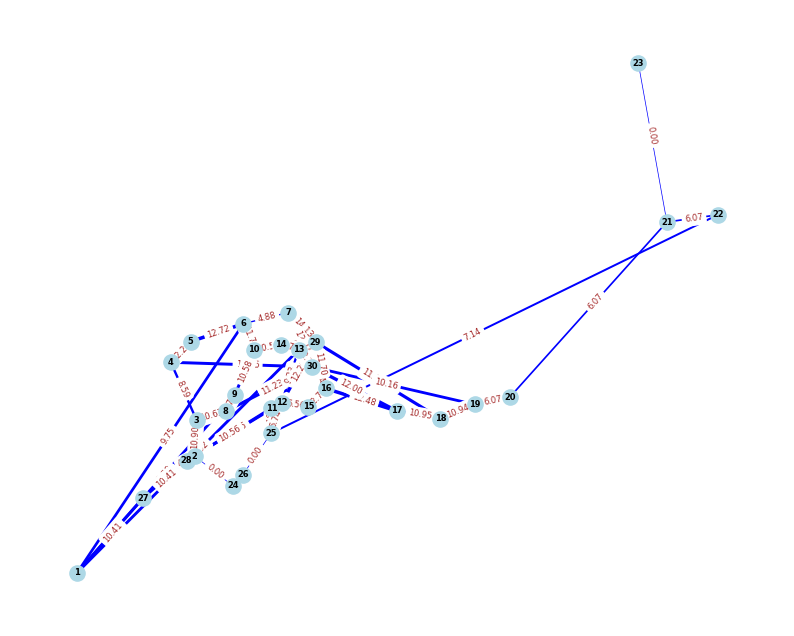

Iter 197: Obj=60331.0056, Best=49947.7013, Tabu=157


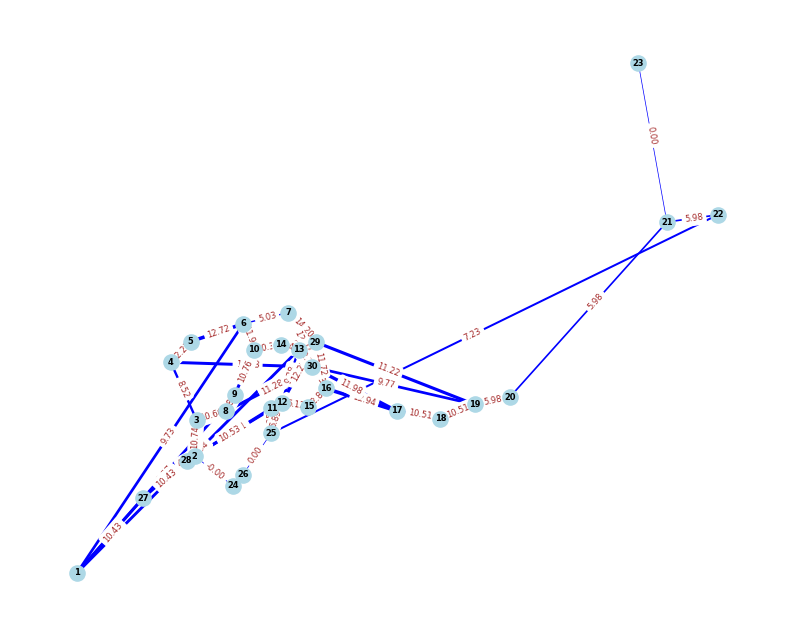

Iter 198: Obj=62435.8578, Best=49947.7013, Tabu=158


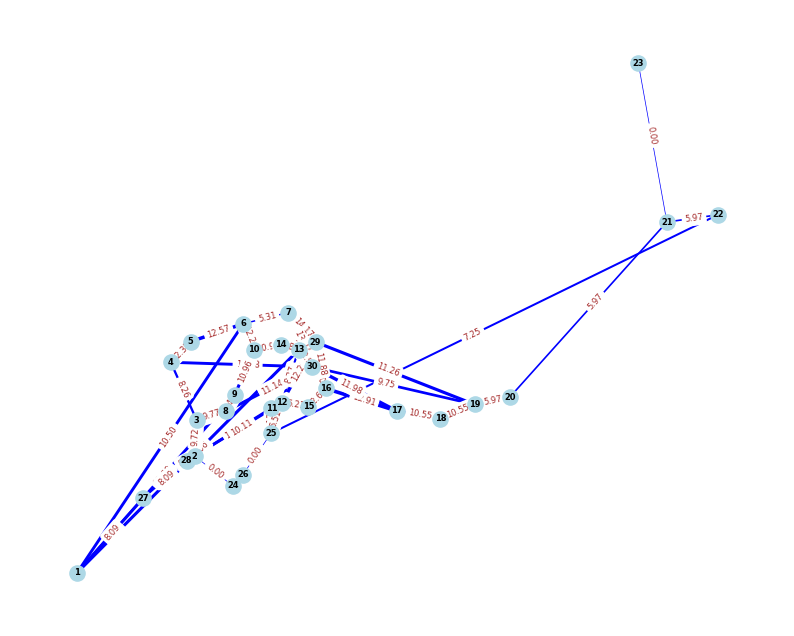

Iter 199: Obj=61026.2645, Best=49947.7013, Tabu=159


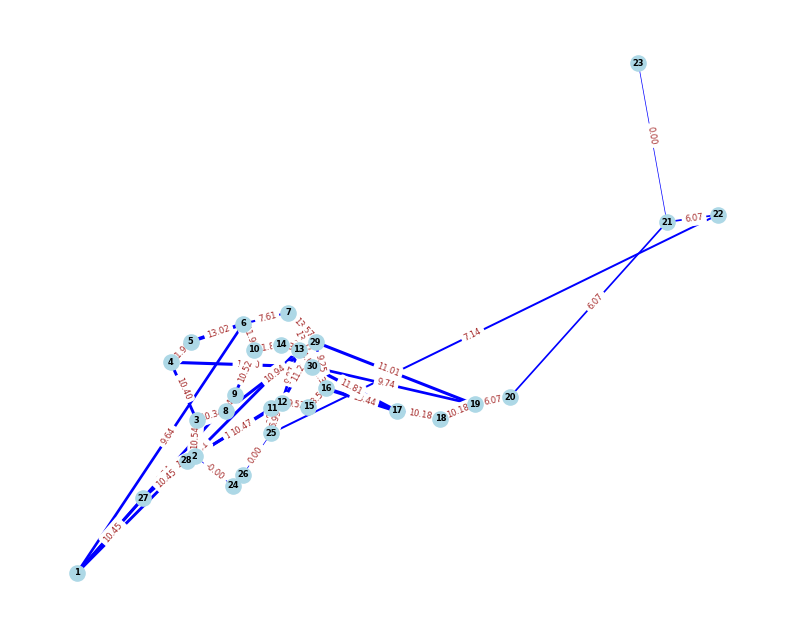

Iter 200: Obj=61844.1247, Best=49947.7013, Tabu=160


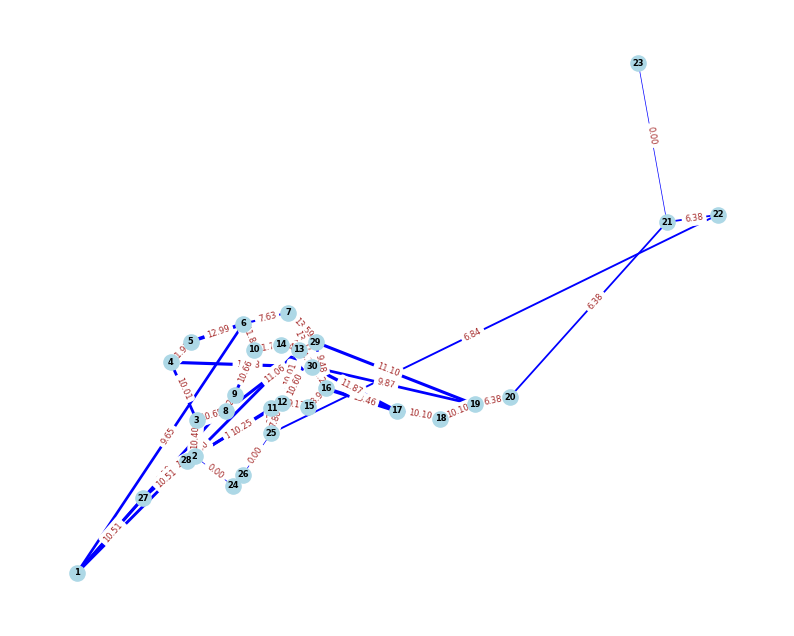

[Done] Best objective = 49947.7013 after 200 iterations.

=== Tabu Search Result ===
Best edges selected: [(7, 17), (7, 30), (1, 14), (5, 29), (1, 6), (3, 30), (19, 29), (1, 2), (17, 29), (17, 30), (16, 28), (10, 29), (2, 29), (22, 25)]
Best objective value: 49947.70130376913
Tabu Elapsed Time: 453.6322833855947 minutes


In [34]:
initial_chosen_edges = greedy_chosen_edges#[]
initial_best_obj = greedy_best_obj #float("inf")
initial_flows = greedy_best_flows #[]
print("\n=== Greedy Solution ===")
print("Initial edges selected:", initial_chosen_edges)
print("Initial objective value:", initial_best_obj)
#greedy_chosen_edges, greedy_best_obj, greedy_best_flows 
#---------
elapsed_tabu_list = []
tabu_best_edges_list = []
tabu_best_obj_list = []
tabu_best_flows_list = []
tabu_iter_history_list= []
#------------------------------------------------------------------------------
start_tabu = time.time()

# ===   Run Tabu Search (Starting from Greedy Solution) ===
tabu_best_edges, tabu_best_obj, tabu_best_flows,tabu_iter_history = tabu_search_ul(
    G0=G0,
    complete_edge_list=complete_edge_list,
    OD_pairs=OD_pairs,
    demand_paths=demand_paths,
    travel_t0=travel_t0,
    travel_alpha=travel_alpha,
    cost_weights=cost_weights,
    initial_edges=initial_chosen_edges,        # from Greedy solver
    initial_obj=initial_best_obj,
    initial_flows=initial_flows,
    node_data = node_data,
    budget=100,
    penalty_factor=penalty_factor,
    calib=CALIB,
    max_iter=optim_max_iter,        # total iterations
    tabu_tenure=optim_tabu_tenure,      # how long a move stays tabu
    neigh_size=optim_pop_size,      # number of neighbour moves to test per iteration
    display=True
)


stop_tabu = time.time()
elapsed_tabu = (stop_tabu - start_tabu)/60

elapsed_tabu_list.append(elapsed_tabu)
tabu_best_edges_list.append(tabu_best_edges.copy())
tabu_best_obj_list.append(tabu_best_obj)
tabu_best_flows_list.append(tabu_best_flows.copy())
tabu_iter_history_list.append(tabu_iter_history.copy())

# ===  Display Results ===
print("\n=== Tabu Search Result ===")
print("Best edges selected:", tabu_best_edges)
print("Best objective value:", tabu_best_obj)
print("Tabu Elapsed Time:", elapsed_tabu, "minutes")


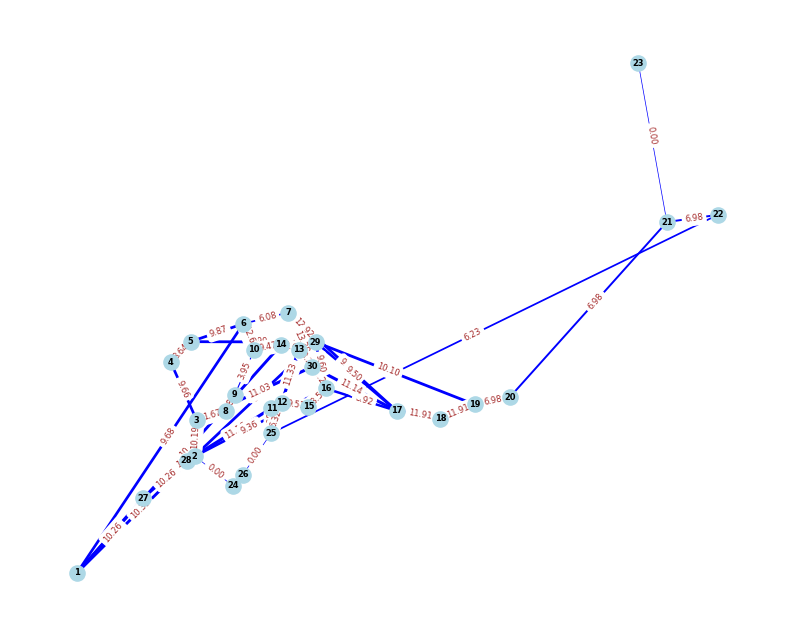

In [35]:
Gi = G0.copy()
Gi.add_edges_from(tabu_best_edges)
draw_rotated_graph(Gi,edge_flows=tabu_best_flows)

<h4>Tabu Search Multiple Restarts</h4>

In [36]:
for i in range(n_runs):
    print('Tabu run number %d...'%(i+1))
    #------------------------------------------------------------------------------
    start_tabu = time.time()
    
    # ===   Run Tabu Search (Starting from Greedy Solution) ===
    tabu_best_edges, tabu_best_obj, tabu_best_flows,tabu_iter_history = tabu_search_ul(
        G0=G0,
        complete_edge_list=complete_edge_list,
        OD_pairs=OD_pairs,
        demand_paths=demand_paths,
        travel_t0=travel_t0,
        travel_alpha=travel_alpha,
        cost_weights=cost_weights,
        initial_edges=initial_chosen_edges,        # from Greedy solver
        initial_obj=initial_best_obj,
        initial_flows=initial_flows,
        node_data = node_data,
        budget=100,
        penalty_factor=penalty_factor,
        calib=CALIB,
        max_iter=optim_max_iter,        # total iterations
        tabu_tenure=5,      # how long a move stays tabu
        neigh_size=optim_pop_size,      # number of neighbour moves to test per iteration
        display=False
    )
    
    
    stop_tabu = time.time()
    elapsed_tabu = (stop_tabu - start_tabu)/60
    
    elapsed_tabu_list.append(elapsed_tabu)
    tabu_best_edges_list.append(tabu_best_edges.copy())
    tabu_best_obj_list.append(tabu_best_obj)
    tabu_best_flows_list.append(tabu_best_flows.copy())
    tabu_iter_history_list.append(tabu_iter_history.copy())

    print("\n=== Tabu Search Result ===")
    print("Best edges selected:", tabu_best_edges)
    print("Best objective value:", tabu_best_obj)
    print("Tabu Elapsed Time:", elapsed_tabu, "minutes")
    

print('Tabu search multiple runs complete...')

Tabu run number 1...

=== Tabu Search Result ===
Best edges selected: [(7, 17), (7, 30), (1, 6), (2, 29), (10, 29), (17, 30), (17, 29), (1, 26), (28, 30), (19, 29), (1, 14), (11, 22), (6, 29), (3, 30)]
Best objective value: 49114.313651680386
Tabu Elapsed Time: 182.19211920102438 minutes
Tabu run number 2...

=== Tabu Search Result ===
Best edges selected: [(7, 17), (7, 30), (17, 29), (6, 30), (12, 30), (16, 28), (1, 10), (19, 30), (6, 29), (1, 14), (1, 25), (19, 29), (12, 22), (2, 29)]
Best objective value: 49029.06661536692
Tabu Elapsed Time: 115.95816875298819 minutes
Tabu run number 3...

=== Tabu Search Result ===
Best edges selected: [(7, 30), (1, 14), (1, 26), (10, 29), (17, 30), (6, 30), (16, 28), (1, 6), (7, 17), (11, 29), (2, 30), (19, 29), (12, 22), (19, 30)]
Best objective value: 49195.14454416274
Tabu Elapsed Time: 116.53380358219147 minutes
Tabu run number 4...

=== Tabu Search Result ===
Best edges selected: [(1, 26), (7, 30), (1, 14), (11, 30), (17, 29), (10, 29), (1, 6

In [37]:
greedy_solution_pack = {
    "optim_name": "GrA",
    "desc": "no intersection to objective function",
    "n_sol": 1,
    "optim_time": [elapsed_greedy],
    "settings": [{"sampling_rate":1}],
    "solutions":[greedy_chosen_edges],
    "obj_vals": [greedy_best_obj],
    "flows": [greedy_best_flows],
    "iter_history": [greedy_iter_history]
}

ts_solution_pack = {
    "optim_name": "GrA-TS",
    "desc": "no intersection to objective function",
    "n_sol": n_runs+1,
    "optim_time" : elapsed_tabu_list,
    "settings" : [{"optim_max_iter":optim_max_iter,"sampling_rate":1, "tabu_tenure":optim_tabu_tenure,"neigh_size":20}],
    "solutions" : tabu_best_edges_list,
    "obj_vals" : tabu_best_obj_list,
    "flows" : tabu_best_flows_list,
    "iter_history" : tabu_iter_history_list
}



In [38]:
from joblib import dump, load
from datetime import datetime
timestamp = datetime.now().strftime("%d_%m_%Y_%H_%M_%S")
greedy_title = "../../output/results/unconstrained/rv1/greedy_results_%s.joblib"%timestamp
tabu_title  = "../../output/results/unconstrained/rv1/gr_tabu_results_%s.joblib"%timestamp

In [39]:
dump(greedy_solution_pack, greedy_title)
dump(ts_solution_pack, tabu_title)
print(greedy_title,"saved....")
print(tabu_title,"saved....")

output/results/v3/greedy_results_20_11_2025_14_04_47.joblib saved....
output/results/v3/gr_tabu_results_20_11_2025_14_04_47.joblib saved....


In [40]:
print("\n=== TABU SEARCH MULTI-RUN SUMMARY ===")
print(f"Average objective: {np.mean(tabu_best_obj_list):.4f}")
print(f"Best objective: {np.min(tabu_best_obj_list):.4f}")
print(f"Average runtime: {np.mean(elapsed_tabu_list):.4f} minutes")
print(f"Std. deviation of objective: {np.std(tabu_best_obj_list):.4f}")


=== TABU SEARCH MULTI-RUN SUMMARY ===
Average objective: 50016.5838
Best objective: 48290.6518
Average runtime: 192.4164 minutes
Std. deviation of objective: 1792.2473
